# DELL

## Exogeneous variables to investigate and why

| #  | Variable Name               | Yahoo Ticker         | Relevance                                                                 |
|----|-----------------------------|----------------------|---------------------------------------------------------------------------|
| 1  | Semiconductor ETF           | SMH                  | Dell relies heavily on semiconductors for PCs, servers, and storage; SMH reflects input costs and supply pressure. |
| 2  | NASDAQ Composite            | ^IXIC                | Captures overall tech investor sentiment; Dell stock often moves with NASDAQ trends. |
| 3  | Tech Sector ETF             | XLK                  | Tracks Dell’s peer group (e.g., Apple, Microsoft); useful for benchmarking and sector-level sentiment. |
| 4  | Copper Futures              | HG=F                 | Copper is used in wiring, circuit boards, and PC components; price increases may signal rising production costs. |
| 5  | Crude Oil Futures           | CL=F                 | Affects global shipping and logistics costs; higher oil prices raise Dell’s supply chain expenses. |
| 6  | USD Index                   | DX-Y.NYB             | Dell earns significant revenue internationally; a strong dollar can reduce foreign earnings. |
| 7  | 10-Year Treasury Yield      | ^TNX                 | Impacts interest rates and cost of capital; high yields can slow tech investment and reduce corporate IT spending. |
| 8  | Volatility Index (VIX)      | ^VIX                 | High volatility reduces investor risk appetite and can delay business purchases of IT hardware. |
| 9  | Consumer Discretionary ETF  | XLY                  | Tracks consumer demand for tech products like laptops and monitors - a core Dell segment. |
| 10 | Industrial ETF              | XLI                  | A proxy for business demand; industrial growth often coincides with increased enterprise hardware spending. |
| 11 | Transportation ETF          | IYT                  | Reflects shipping volume and supply chain smoothness - crucial for Dell’s global distribution. |




| #  | Label                     | Ticker     | Category            |
|----|---------------------------|------------|---------------------|
| 1  | Semiconductor ETF         | SMH        | Sectoral            |
| 2  | NASDAQ Composite          | ^IXIC      | Sectoral            |
| 3  | Tech Sector ETF           | XLK        | Sectoral            |
| 4  | Copper Futures            | HG=F       | Commodity           |
| 5  | Crude Oil Futures         | CL=F       | Commodity / Supply Chain |
| 6  | USD Index                 | DX-Y.NYB   | Macroeconomic       |
| 7  | 10-Year Treasury Yield    | ^TNX       | Macroeconomic       |
| 8  | Volatility Index          | ^VIX       | Macroeconomic       |
| 9  | Consumer Discretionary ETF| XLY        | Macroeconomic       |
|10  | Industrial ETF            | XLI        | Macroeconomic       |
|11  | Transportation ETF        | IYT        | Supply Chain        |


In [4]:
import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning
# Suppress common statsmodels warnings
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=ConvergenceWarning)
warnings.filterwarnings("ignore", message="No supported index is available")
warnings.filterwarnings("ignore", message="A date index has been provided, but it has no associated frequency")

In [5]:
#load libraries
# Core libraries
import os
os.environ['PYTHONHASHSEED'] = '22'
import random
import time
import string
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Statistical and time series analysis
from scipy.stats import spearmanr, pearsonr
from scipy.stats import pearsonr
from statsmodels.tsa.stattools import adfuller, grangercausalitytests
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Forecasting
from pmdarima import auto_arima

# Machine learning
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import MinMaxScaler
from xgboost import XGBRegressor

# Deep learning (LSTM)
import tensorflow as tf
import keras_tuner
from tensorflow.keras import optimizers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, LeakyReLU
from tensorflow.keras.callbacks import EarlyStopping
from keras_tuner.tuners import RandomSearch
from keras_tuner import HyperModel

# loading data
import yfinance as yf

#!pip install xgboost
#!pip install keras-tuner --quiet
#!pip install pmdarima

#preventinf memory full error
import gc
from keras import backend as K

In [6]:
#setting random seeed
seed = 22
random.seed(seed)
np.random.seed(seed)
tf.random.set_seed(seed)

## Basic EDA for BA and exogeneous variables 

In [8]:
# data doenloaded via google cloab instead
# uploading here

# Load the full combined file
df = pd.read_csv("dell_exo_data_covid/dell_exo_variables_combined_2020_2021.csv", skiprows = 1, index_col=0, parse_dates=True, date_format="%Y-%m-%d")

# Drop the first row (which is still the leftover 'Date' label)
df = df[df.index != "Date"].copy()

# Convert all columns to numeric (force errors to NaN)
df = df.apply(pd.to_numeric, errors="coerce")

# Check structure
print(df.info())
print(df.head())
print("\nMissing values:\n", df.isna().sum())

<class 'pandas.core.frame.DataFrame'>
Index: 313 entries, 2020-01-02 to 2021-03-30
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   DELL      313 non-null    float64
 1   SMH       313 non-null    float64
 2   ^IXIC     313 non-null    float64
 3   XLK       313 non-null    float64
 4   HG=F      313 non-null    float64
 5   CL=F      313 non-null    float64
 6   DX-Y.NYB  313 non-null    float64
 7   ^TNX      313 non-null    float64
 8   ^VIX      313 non-null    float64
 9   XLY       313 non-null    float64
 10  XLI       313 non-null    float64
 11  IYT       313 non-null    float64
dtypes: float64(12)
memory usage: 31.8+ KB
None
                 DELL        SMH        ^IXIC        XLK    HG=F       CL=F  \
Ticker                                                                        
2020-01-02  24.481901  69.920441  9092.190430  88.947220  2.8330  61.180000   
2020-01-03  23.676603  68.775078  9020.769531  87.947

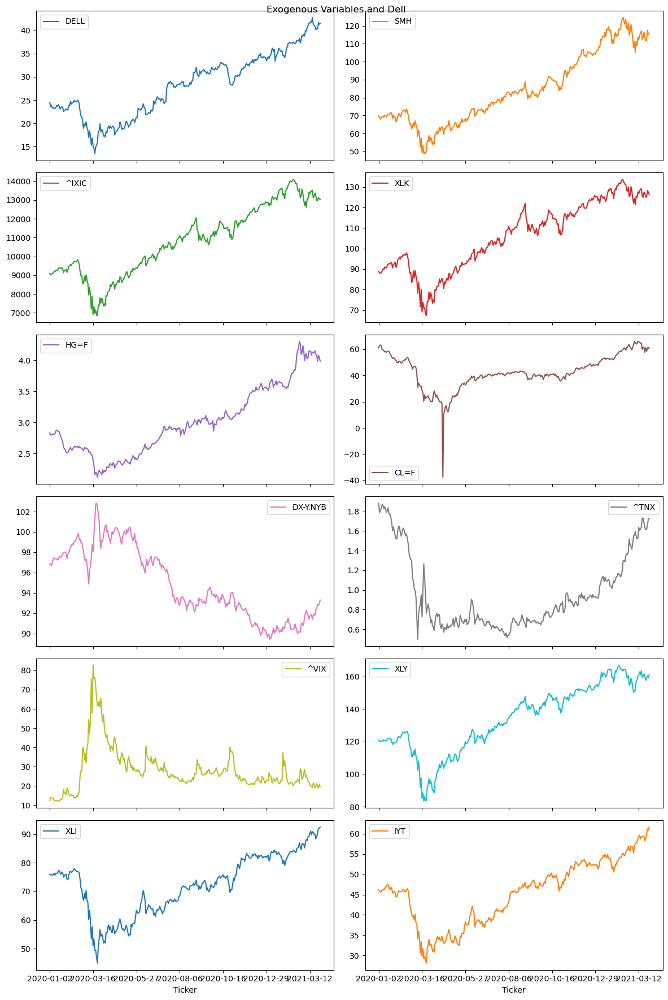

In [9]:
# Basic visual EDA
df.plot(subplots=True, figsize=(12, 18), layout=(6, 2), title="Exogenous Variables and Dell")
plt.tight_layout()
plt.show()

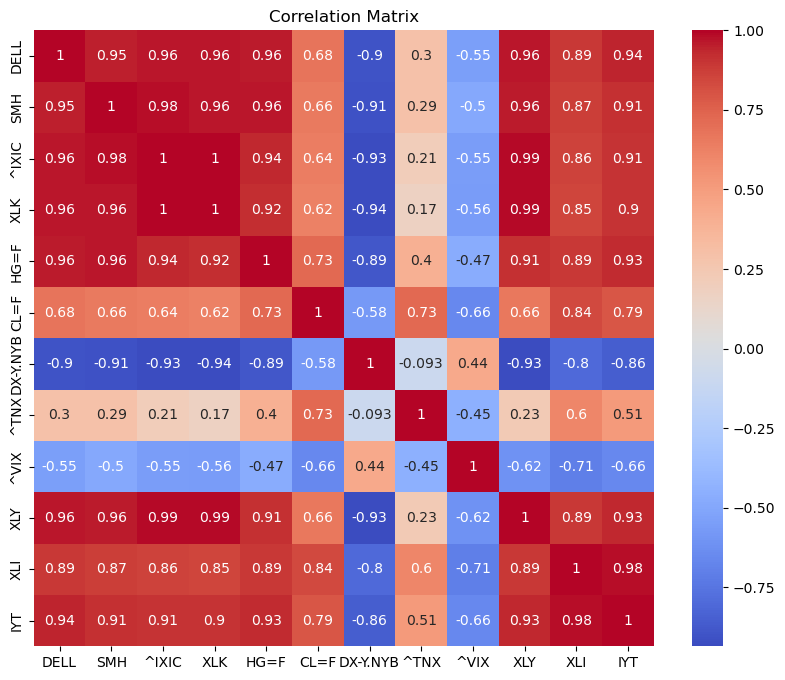

In [10]:
#correlation heatmap
corr = df.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap="coolwarm")
plt.title("Correlation Matrix")
plt.show()

These exo variables look extremely promising! Seem to floow a similar pattern and plenty of strong correlation between variables and dell (with exception of ^TNX)

#### Checking for stationality

In [13]:
#ADF tests
#Ho: Time series is non-stationary
#Ha: Time series is stationary 
#for each ticker, if p is less than 0.05 the test was significant and we reject Ho.. thus stationary


# Initialize result list
adf_results = []

# Looping over each column (including Boeing and exogenous variables)
for column in df.columns:
    series = df[column].dropna()
    
    try:
        result = adfuller(series)
        adf_results.append({
            'Variable': column,
            'ADF Statistic': result[0],
            'p-value': result[1],
            'Stationary': 'Yes' if result[1] < 0.05 else 'No'
        })
    except Exception as e:
        adf_results.append({
            'Variable': column,
            'ADF Statistic': None,
            'p-value': None,
            'Stationary': 'Error',
            'Error': str(e)
        })

# converting results to DataFrame
adf_df = pd.DataFrame(adf_results)
print(adf_df)

    Variable  ADF Statistic   p-value Stationary
0       DELL       0.179334  0.971078         No
1        SMH       0.081410  0.964769         No
2      ^IXIC      -0.746276  0.834396         No
3        XLK      -0.817973  0.813785         No
4       HG=F       0.127117  0.967864         No
5       CL=F      -1.362642  0.600049         No
6   DX-Y.NYB      -1.065244  0.728731         No
7       ^TNX      -1.628068  0.468502         No
8       ^VIX      -2.938516  0.041049        Yes
9        XLY      -0.788155  0.822577         No
10       XLI      -0.802011  0.818531         No
11       IYT      -0.240119  0.933567         No


Need to ensure all are stationary before doing granger tests to avoid getting spurious results, inflated p-values, or invalid inference.

The Granger test assumes:
- Time series are covariance stationary
- constant mean/variance over time


In [15]:
# getting first difference for all bar ^VIX
# making copy of original DataFrame
df_diff = df.copy()

# list of non-stationary series from ADF output
non_stationary = ['DELL', 'SMH', '^IXIC', 'XLK', 'HG=F', 'CL=F', 'DX-Y.NYB', '^TNX', 'XLY', 'XLI', 'IYT']
stationary = ['^VIX'] 

# differencing only non-stationary series
df_diff_nonstat = df[non_stationary].diff()

# drop NaNs from differenced data
df_diff_nonstat = df_diff_nonstat.dropna()

# slicing ^VIX data to match df_diff_nonstat index exactly
df_vix_clean = df.loc[df_diff_nonstat.index, stationary]

# join differenced and stationary series
df_diff = pd.concat([df_diff_nonstat, df_vix_clean], axis=1)

# check
print(df_diff.head())

                DELL       SMH      ^IXIC       XLK    HG=F      CL=F  \
Ticker                                                                  
2020-01-03 -0.805298 -1.145363 -71.420898 -1.000061 -0.0345  1.869999   
2020-01-06  0.238775 -0.734589  50.700195  0.209534  0.0020  0.220001   
2020-01-07 -0.599289  1.135712  -2.889648 -0.038109  0.0035 -0.570000   
2020-01-08  0.093641  0.115982  60.660156  0.942940  0.0150 -3.090000   
2020-01-09 -0.177916  0.396286  74.189453  1.009544 -0.0085 -0.049999   

            DX-Y.NYB   ^TNX       XLY       XLI       IYT   ^VIX  
Ticker                                                            
2020-01-03 -0.010002 -0.094 -1.029747 -0.146339 -0.318718  14.02  
2020-01-06 -0.169998  0.023  0.333717  0.027428 -0.274178  13.85  
2020-01-07  0.310005  0.016 -0.190689 -0.155495  0.159367  13.79  
2020-01-08  0.320000  0.047  0.362312  0.256119  0.377281  13.45  
2020-01-09  0.149994 -0.016  0.638824  0.320160  0.208569  12.54  


In [16]:
#checking for stationality again (same hypotheses)

# initialize result list
adf_results = []

# using the differenced DataFrame
for column in df_diff.columns:
    series = df_diff[column].dropna()

    try:
        result = adfuller(series)
        adf_results.append({
            'Variable': column,
            'ADF Statistic': result[0],
            'p-value': result[1],
            'Stationary': 'Yes' if result[1] < 0.05 else 'No'
        })
    except Exception as e:
        adf_results.append({
            'Variable': column,
            'ADF Statistic': None,
            'p-value': None,
            'Stationary': 'Error',
            'Error': str(e)
        })

# converting to dataframe... show
adf_df = pd.DataFrame(adf_results)
print(adf_df)

    Variable  ADF Statistic       p-value Stationary
0       DELL      -6.780592  2.505335e-09        Yes
1        SMH      -8.584289  7.580728e-14        Yes
2      ^IXIC      -5.029782  1.937029e-05        Yes
3        XLK      -5.261391  6.579457e-06        Yes
4       HG=F      -7.425236  6.575195e-11        Yes
5       CL=F     -12.297424  7.583421e-23        Yes
6   DX-Y.NYB      -8.494498  1.286773e-13        Yes
7       ^TNX      -6.822856  1.981554e-09        Yes
8        XLY      -5.068170  1.623908e-05        Yes
9        XLI      -4.721660  7.661207e-05        Yes
10       IYT      -4.718818  7.756335e-05        Yes
11      ^VIX      -2.956026  3.921015e-02        Yes


### Granger Causality test 
Looking for strongest candidates for exogeneous variables for this period

In [18]:
# Setting max lag for Granger test
MAX_LAG = 10

# Initialize result list
granger_results = []

# Looping through each exogenous variable
for exo_var in df_diff.columns:
    if exo_var == 'DELL':
        continue  # skipping DELL

    try:
        # Subset DataFrame for this test (BA and current exogenous var)
        test_data = df_diff[['DELL', exo_var]].dropna()

        # Granger causality test
        result = grangercausalitytests(test_data, maxlag=MAX_LAG, verbose=False)

        # Extract p-values for each lag
        p_values = [round(result[i + 1][0]['ssr_ftest'][1], 4) for i in range(MAX_LAG)]

        # Store min p-value and associated variable
        granger_results.append({
            'Exogenous Variable': exo_var,
            'Min p-value': min(p_values),
            'Lag with Min p': p_values.index(min(p_values)) + 1,
            'Causal (p < 0.05)': 'Yes' if min(p_values) < 0.05 else 'No'
        })

    except Exception as e:
        granger_results.append({
            'Exogenous Variable': exo_var,
            'Min p-value': None,
            'Lag with Min p': None,
            'Causal (p < 0.05)': 'Error',
            'Error': str(e)
        })

# Showing results
granger_df = pd.DataFrame(granger_results)
print(granger_df.sort_values("Min p-value"))

   Exogenous Variable  Min p-value  Lag with Min p Causal (p < 0.05)
5            DX-Y.NYB       0.0000               5               Yes
3                HG=F       0.0248               1               Yes
4                CL=F       0.0299               1               Yes
10               ^VIX       0.1512               3                No
1               ^IXIC       0.1615               1                No
6                ^TNX       0.1945               9                No
2                 XLK       0.1954               1                No
8                 XLI       0.2101               7                No
9                 IYT       0.3302               7                No
0                 SMH       0.3780               1                No
7                 XLY       0.3853               6                No


In [19]:
# Define target variable
target = 'DELL'

# Define exogenous variables to test
variables_to_test = ['DX-Y.NYB', 'HG=F', 'CL=F', '^VIX']

max_lag = 10

# Run tests one by one for detailed output
for var in variables_to_test:
    print(f"\n Granger Causality Test: {var} ➡ {target} (Lags 1–{max_lag})")
    test_data = df_diff[[target, var]].dropna()
    grangercausalitytests(test_data, maxlag=max_lag, verbose=True)


 Granger Causality Test: DX-Y.NYB ➡ DELL (Lags 1–10)

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.6954  , p=0.1939  , df_denom=308, df_num=1
ssr based chi2 test:   chi2=1.7119  , p=0.1907  , df=1
likelihood ratio test: chi2=1.7072  , p=0.1914  , df=1
parameter F test:         F=1.6954  , p=0.1939  , df_denom=308, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.2127  , p=0.0416  , df_denom=305, df_num=2
ssr based chi2 test:   chi2=6.5308  , p=0.0382  , df=2
likelihood ratio test: chi2=6.4630  , p=0.0395  , df=2
parameter F test:         F=3.2127  , p=0.0416  , df_denom=305, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.3399  , p=0.0052  , df_denom=302, df_num=3
ssr based chi2 test:   chi2=13.3213 , p=0.0040  , df=3
likelihood ratio test: chi2=13.0422 , p=0.0045  , df=3
parameter F test:         F=4.3399  , p=0.0052  , df_denom=302, df_num=3

Granger Causality
number of lags (no ze

In [20]:
#seeing if a different lag could correlate with the other variables
#including all variables in case better p value for later lags

# Set higher max lag for Granger test
MAX_LAG = 20

# Initialize result list
granger_results_20 = []

# Loop through each exogenous variable
for exo_var in df_diff.columns:
    if exo_var == 'DELL':
        continue  # Skipping the dependent variable

    try:
        # Prepare input data
        test_data = df_diff[['DELL', exo_var]].dropna()

        # Run Granger causality test
        result = grangercausalitytests(test_data, maxlag=MAX_LAG, verbose=False)

        # Extract p-values across lags
        p_values = [round(result[i + 1][0]['ssr_ftest'][1], 4) for i in range(MAX_LAG)]

        # Store the lowest p-value and associated lag
        granger_results_20.append({
            'Exogenous Variable': exo_var,
            'Min p-value': min(p_values),
            'Lag with Min p': p_values.index(min(p_values)) + 1,
            'Causal (p < 0.05)': 'Yes' if min(p_values) < 0.05 else 'No',
            'All p-values': p_values #storing to plot later
        })

    except Exception as e:
        granger_results_20.append({
            'Exogenous Variable': exo_var,
            'Min p-value': None,
            'Lag with Min p': None,
            'Causal (p < 0.05)': 'Error',
            'Error': str(e)
        })

# Display results
granger_df_20 = pd.DataFrame(granger_results_20)
print(granger_df_20.sort_values("Min p-value"))

   Exogenous Variable  Min p-value  Lag with Min p Causal (p < 0.05)  \
5            DX-Y.NYB       0.0000               5               Yes   
3                HG=F       0.0248               1               Yes   
4                CL=F       0.0299               1               Yes   
10               ^VIX       0.1512               3                No   
1               ^IXIC       0.1615               1                No   
6                ^TNX       0.1945               9                No   
2                 XLK       0.1954               1                No   
8                 XLI       0.2101               7                No   
9                 IYT       0.3302               7                No   
0                 SMH       0.3780               1                No   
7                 XLY       0.3853               6                No   

                                         All p-values  
5   [0.1939, 0.0416, 0.0052, 0.0018, 0.0, 0.0004, ...  
3   [0.0248, 0.0332, 0.

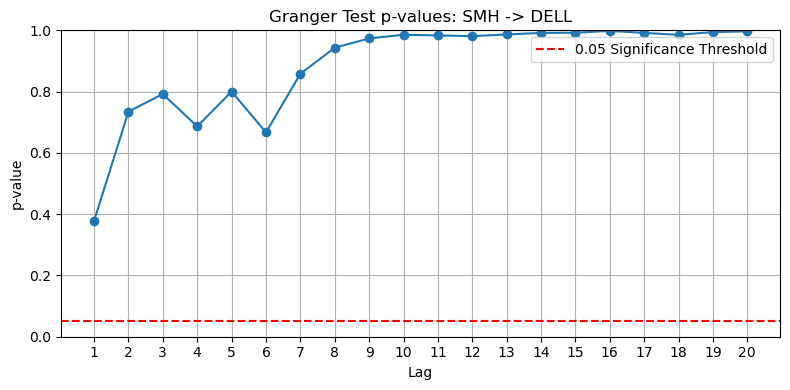

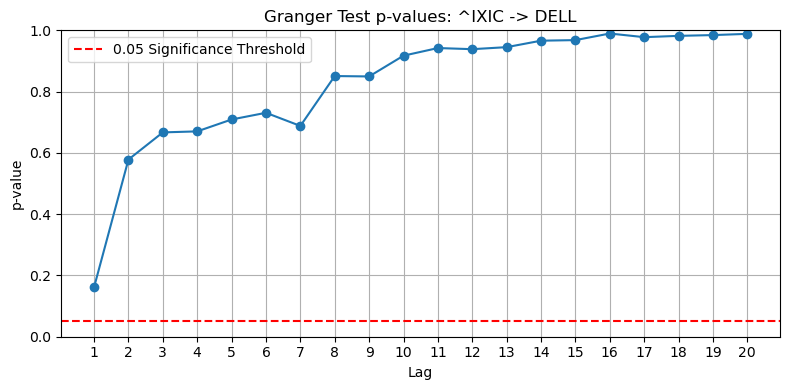

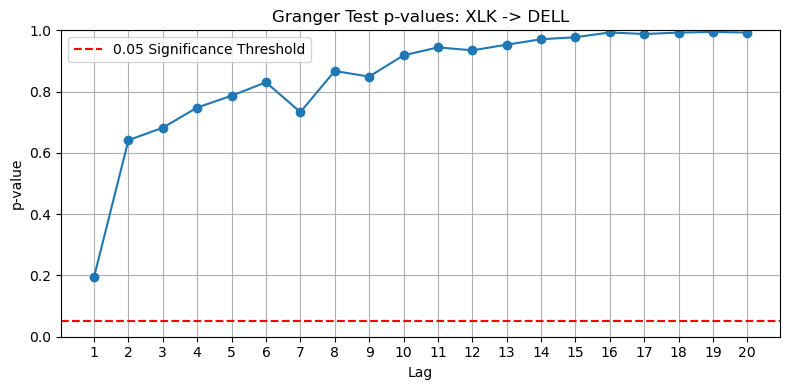

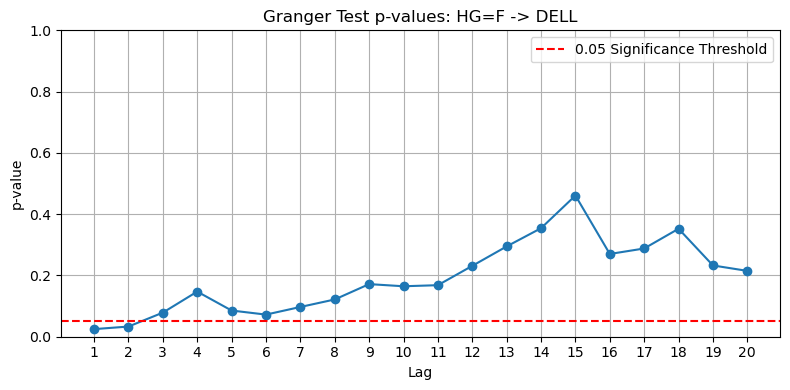

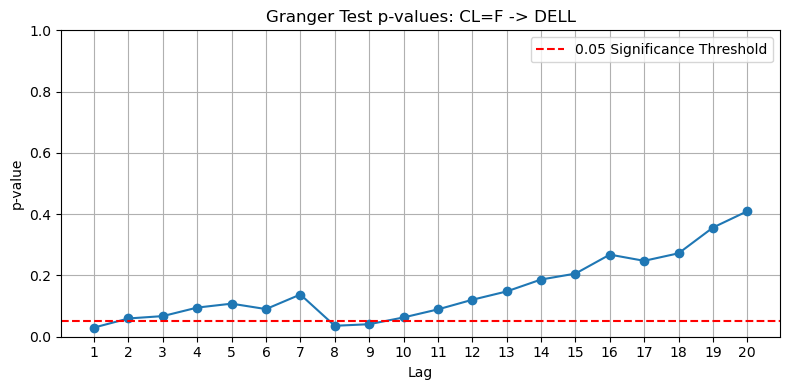

...

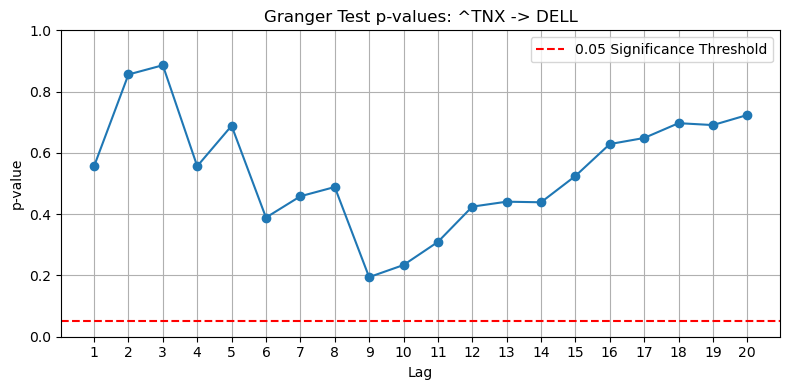

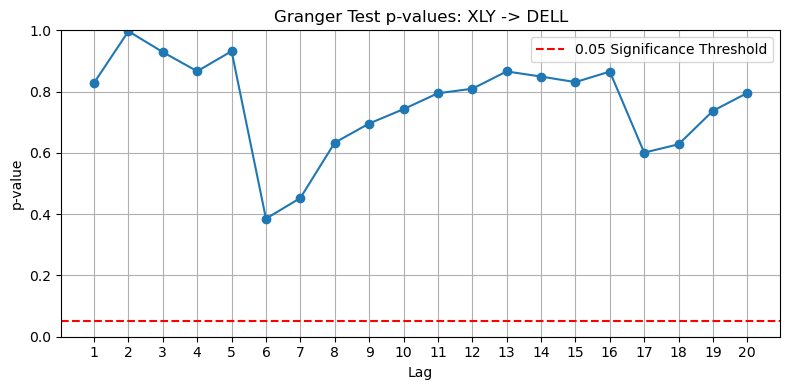

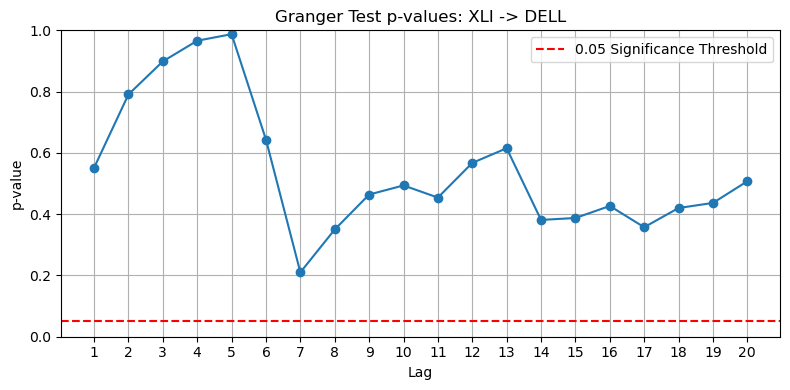

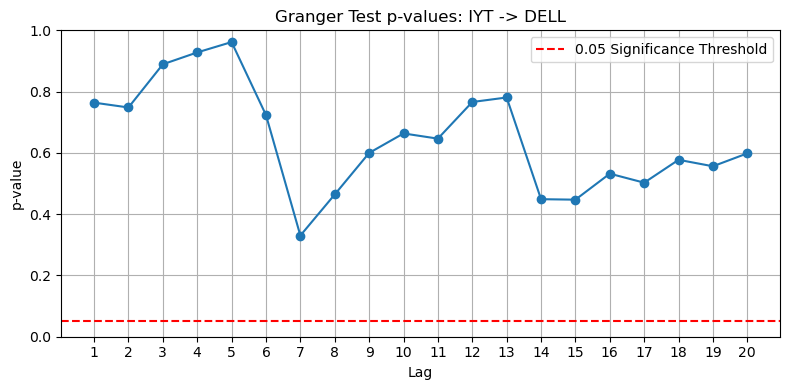

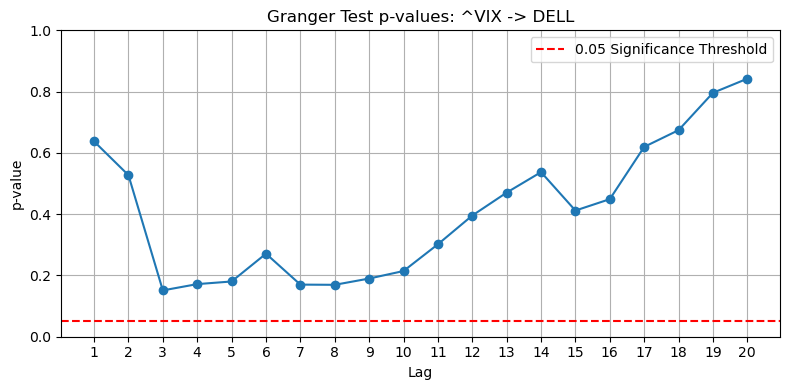

In [21]:
# Plot p-values across lags for each exogenous variable
for result in granger_results_20:
    if 'All p-values' not in result:
        continue  # Skip if p-values not stored due to error

    plt.figure(figsize=(8, 4))
    plt.plot(range(1, MAX_LAG + 1), result['All p-values'], marker='o')
    plt.axhline(y=0.05, color='red', linestyle='--', label='0.05 Significance Threshold')
    plt.title(f"Granger Test p-values: {result['Exogenous Variable']} -> DELL")
    plt.xlabel("Lag")
    plt.ylabel("p-value")
    plt.xticks(range(1, MAX_LAG + 1))
    plt.ylim(0, 1)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [22]:
# Print the full p-values from the correct DataFrame
for idx, row in granger_df_20.iterrows():
    print(f"{row['Exogenous Variable']} → p-values: {row.get('All p-values', 'Missing')}")


SMH → p-values: [0.378, 0.7346, 0.7922, 0.6864, 0.8002, 0.6669, 0.8582, 0.9431, 0.9737, 0.9855, 0.9834, 0.9811, 0.9865, 0.9916, 0.9921, 0.9983, 0.9916, 0.9853, 0.9943, 0.9966]
^IXIC → p-values: [0.1615, 0.5783, 0.6669, 0.6702, 0.709, 0.7309, 0.688, 0.8508, 0.8495, 0.9173, 0.9422, 0.9385, 0.9451, 0.9662, 0.9681, 0.9896, 0.9777, 0.982, 0.9845, 0.9885]
XLK → p-values: [0.1954, 0.6416, 0.6822, 0.7481, 0.7866, 0.8305, 0.733, 0.8674, 0.849, 0.9184, 0.9444, 0.9348, 0.9531, 0.9709, 0.9775, 0.9931, 0.9881, 0.9926, 0.9947, 0.9927]
HG=F → p-values: [0.0248, 0.0332, 0.0786, 0.1473, 0.0855, 0.0722, 0.0971, 0.1216, 0.1717, 0.1647, 0.1682, 0.2313, 0.2947, 0.3542, 0.4608, 0.2701, 0.288, 0.3524, 0.2326, 0.2149]
CL=F → p-values: [0.0299, 0.0596, 0.0673, 0.0951, 0.1079, 0.0902, 0.1378, 0.0357, 0.0408, 0.0629, 0.0892, 0.1206, 0.1478, 0.1867, 0.206, 0.268, 0.2477, 0.2723, 0.3563, 0.4097]
DX-Y.NYB → p-values: [0.1939, 0.0416, 0.0052, 0.0018, 0.0, 0.0004, 0.0002, 0.0007, 0.001, 0.002, 0.0023, 0.0034, 0.0041,

## Building ARIMA model

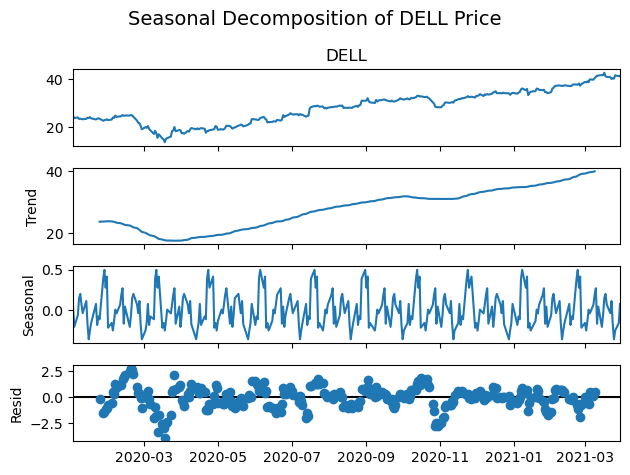

In [24]:
#already know it needs to be differenced once for stationlity
#looking at seasonality

# Extracting BA price series
dell_series = df['DELL'].dropna()
dell_series.index = pd.to_datetime(dell_series.index)

# Try daily seasonality 
decomposition = seasonal_decompose(dell_series, model='additive', period=30)
decomposition.plot()
plt.suptitle('Seasonal Decomposition of DELL Price', fontsize=14)
plt.tight_layout()
plt.show()

Pretty clear story from the decomposition here. There’s an obvious upward trend across the period, so differencing (d=1) still makes complete sense.. as expected from the ADF output. The seasonal component is quite consistent and frequent, probably tied to weekly cycles (likely 5–7 business days). The size of that seasonal signal isn’t huge, but it’s definitely there, which makes SARIMAX a justified option to test (maybe something like seasonal_order=(1, 0, 0, 5) or 7). 

The residuals look decent: centered around zero overall.. but there are a few stretches where there’s some clustering, which might mean there’s still some explainable variation left in the signal. That supports the idea that adding exogenous variables culd help predictions 

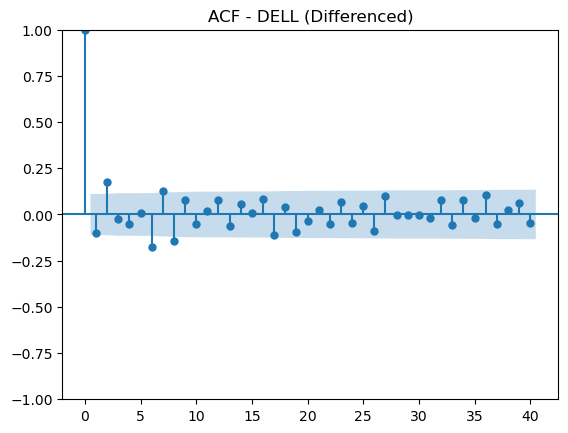

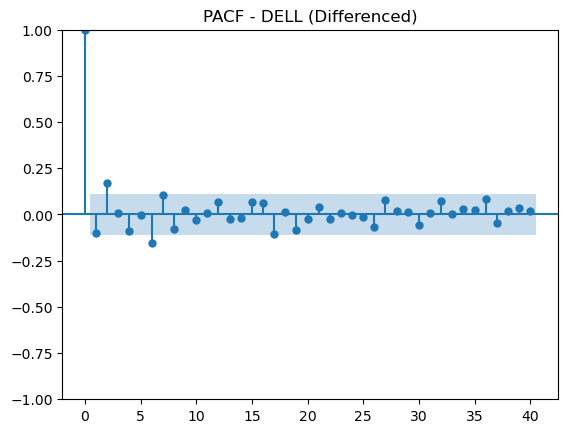

In [26]:
#ACF PACF plots
# first diff
dell_diff = dell_series.diff().dropna()

# plotting ACF & PACF
plot_acf(dell_diff, lags=40)
plt.title('ACF - DELL (Differenced)')
plt.show()

plot_pacf(dell_diff, lags=40)
plt.title('PACF - DELL (Differenced)')
plt.show()

Looks like (1,1,1) or (1,1,0) could be best. Will use auto arima to see if this is confirmed... doesn't look like any complex dynamics

In [28]:
auto_model = auto_arima(dell_series, seasonal=True, m=7,
                        stepwise=True, trace=True,
                        suppress_warnings=True, max_order=10)

print(auto_model.summary()) 
#no seasonality picked up at 5 or 30... but picked up at 7 so going with that

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[7] intercept   : AIC=636.611, Time=0.58 sec
 ARIMA(0,1,0)(0,0,0)[7] intercept   : AIC=641.054, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[7] intercept   : AIC=638.669, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[7] intercept   : AIC=639.359, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[7]             : AIC=641.099, Time=0.03 sec
 ARIMA(2,1,2)(0,0,1)[7] intercept   : AIC=634.889, Time=0.30 sec
 ARIMA(2,1,2)(0,0,0)[7] intercept   : AIC=636.155, Time=0.24 sec
 ARIMA(2,1,2)(0,0,2)[7] intercept   : AIC=636.720, Time=0.49 sec
 ARIMA(2,1,2)(1,0,0)[7] intercept   : AIC=634.751, Time=0.31 sec
 ARIMA(2,1,2)(2,0,0)[7] intercept   : AIC=636.663, Time=0.43 sec
 ARIMA(2,1,2)(2,0,1)[7] intercept   : AIC=inf, Time=1.18 sec
 ARIMA(1,1,2)(1,0,0)[7] intercept   : AIC=632.767, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[7] intercept   : AIC=634.157, Time=0.11 sec
 ARIMA(1,1,2)(2,0,0)[7] intercept   : AIC=634.683, Time=0.28 sec
 ARIMA(1,1,2)(1,0,1)[7] intercept   : AIC=634.629, 

- Best model:  ARIMA(0,1,2)(0,0,0)[30]          
Total fit time: 15.605 seconds
- Best model:  ARIMA(0,1,2)(0,0,0)[5]          
Total fit time: 6.121 seconds
- Best model:  ARIMA(0,1,2)(1,0,0)[7]          
Total fit time: 9.990 seconds

Only 7 showed seasonality... all three agreed on ARIMA(0,1,2) for non seasonal part

wil use ARIMA(0,1,2)(1,0,0)[7]   for SARIMA/X model

In [30]:
auto_model = auto_arima(dell_series, seasonal=False, m=7,
                        stepwise=True, trace=True,
                        suppress_warnings=True, max_order=10)

print(auto_model.summary())

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=636.155, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=641.054, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=639.971, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=640.758, Time=0.05 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=641.099, Time=0.00 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=634.157, Time=0.18 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=632.218, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=634.152, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=638.495, Time=0.10 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=633.763, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=631.920, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=641.158, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=633.903, Time=0.09 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=633.903, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=638.9

Going to use (1,1,1) (classic default) and (0,1,2) from auto arima... for arima/x models

will use ARIMA(0,1,2)(1,0,0)[7]   for SARIMA/X
I will choose best model based on evealuations and then continue with that model for my exogeneous variables

## Gettning results for Baseline models (no exo variables)
- No seasonality -ARIMAX- (0, 1, 2), (1,1,1)
- With seasonality -SARIMAX- (0, 1, 2) seasonality: (1, 0, 0, 7)

In [33]:
#define models

def mean_absolute_percentage_error(y_true, y_pred):
    """Avoids division by zero issues."""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    mask = y_true != 0
    return np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100

def rolling_forecast_baseline_model(
    df,
    model_order,
    forecast_horizons,
    train_end_date,
    test_start_date,
    output_csv_path,
    seasonal_order=None
):
    df = df.copy()
    df.index = pd.to_datetime(df.index)
    df = df.asfreq('B')
    series = df['DELL'].dropna()

    train = series[series.index <= train_end_date]
    test = series[series.index >= test_start_date]

    all_metrics = []

    for h in forecast_horizons:
        preds, actuals, dates = [], [], []

        for i in range(0, len(test) - h + 1):
            train_series = pd.concat([train, test.iloc[:i]])

            try:
                model = SARIMAX(
                    train_series,
                    order=model_order,
                    seasonal_order=seasonal_order,
                    enforce_stationarity=False,
                    enforce_invertibility=False
                )
                results = model.fit(disp=False)
                forecast = results.get_forecast(steps=h)
                pred = forecast.predicted_mean.iloc[-1]
                actual = test.iloc[i + h - 1]

                if not np.isnan(pred) and not np.isnan(actual):
                    preds.append(pred)
                    actuals.append(actual)
                    dates.append(test.index[i + h - 1])
            except Exception as e:
                continue

        if preds:
            rmse = np.sqrt(mean_squared_error(actuals, preds))
            mae = mean_absolute_error(actuals, preds)
            mape = mean_absolute_percentage_error(actuals, preds)
            model_name = f"SARIMA{model_order}" if seasonal_order else f"ARIMA{model_order}"
            all_metrics.append({
                'model': model_name,
                'seasonal': bool(seasonal_order),
                'horizon': h,
                'rmse': rmse,
                'mae': mae,
                'mape': mape
            })

            # Print results
            print(f"\n{model_name} {'(Seasonal)' if seasonal_order else ''} - Horizon {h}")
            print(f"  RMSE: {rmse:.2f}")
            print(f"  MAE:  {mae:.2f}")
            print(f"  MAPE: {mape:.2f}%")

            # Plot
            plt.figure(figsize=(10, 4))
            plt.plot(dates, actuals, label='Actual')
            plt.plot(dates, preds, label='Forecast')
            plt.title(f"{model_name} {'(Seasonal)' if seasonal_order else ''} - {h}-Day Horizon")
            plt.xlabel('Date')
            plt.ylabel('BA Close Price')
            plt.legend()
            plt.tight_layout()
            plt.show()

    df_metrics = pd.DataFrame(all_metrics)

    if not df_metrics.empty:
        if not os.path.exists(output_csv_path):
            df_metrics.to_csv(output_csv_path, index=False)
        else:
            df_metrics.to_csv(output_csv_path, mode='a', header=False, index=False)
        print(f"\n Saved metrics to {output_csv_path}")

    return df_metrics


ARIMA(0, 1, 2)  - Horizon 1
  RMSE: 0.66
  MAE:  0.48
  MAPE: 1.29%


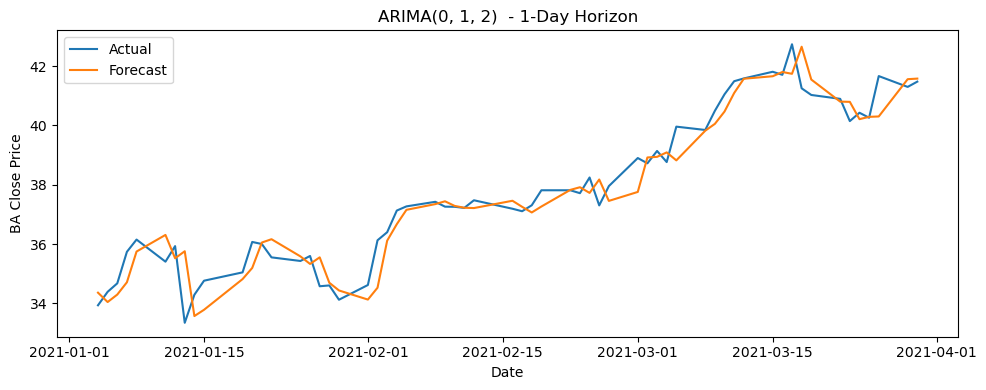


ARIMA(0, 1, 2)  - Horizon 3
  RMSE: 1.14
  MAE:  0.91
  MAPE: 2.43%


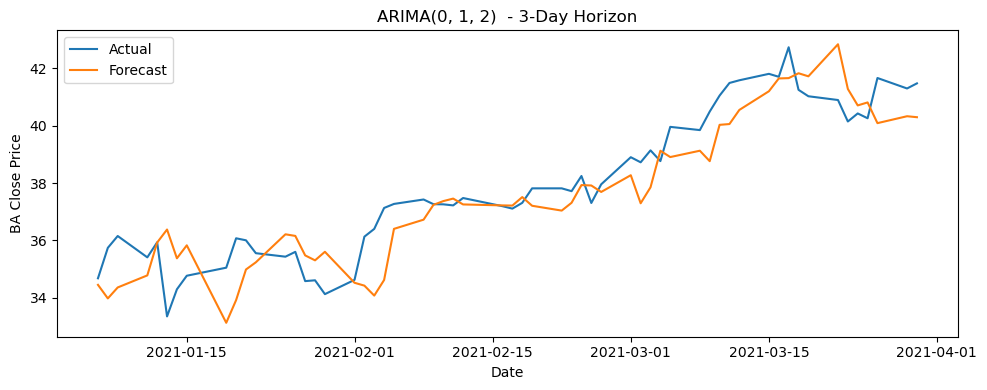


ARIMA(0, 1, 2)  - Horizon 7
  RMSE: 1.54
  MAE:  1.24
  MAPE: 3.23%


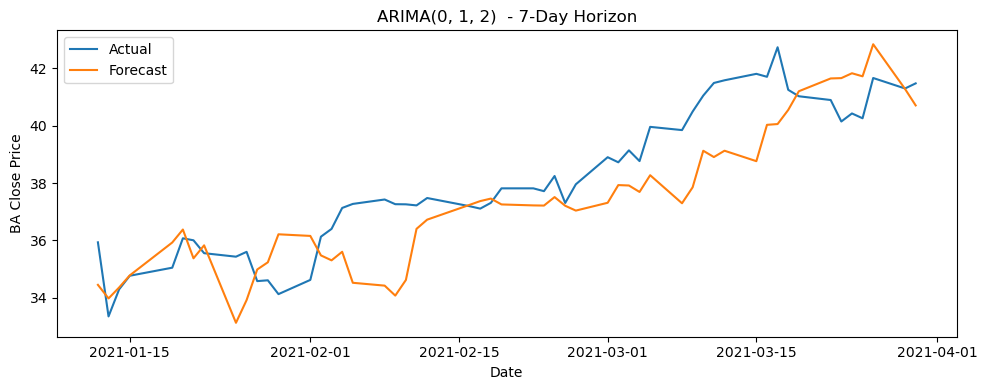


 Saved metrics to baseline_metrics_dell.csv

ARIMA(1, 1, 1)  - Horizon 1
  RMSE: 0.67
  MAE:  0.49
  MAPE: 1.31%


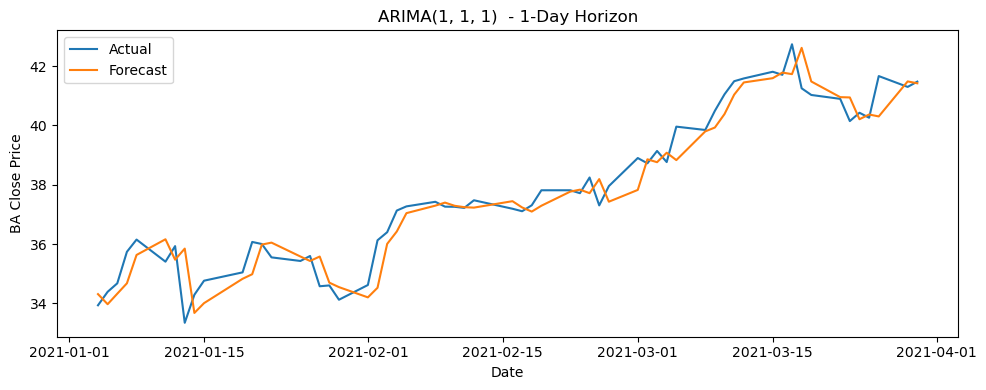


ARIMA(1, 1, 1)  - Horizon 3
  RMSE: 1.13
  MAE:  0.94
  MAPE: 2.48%


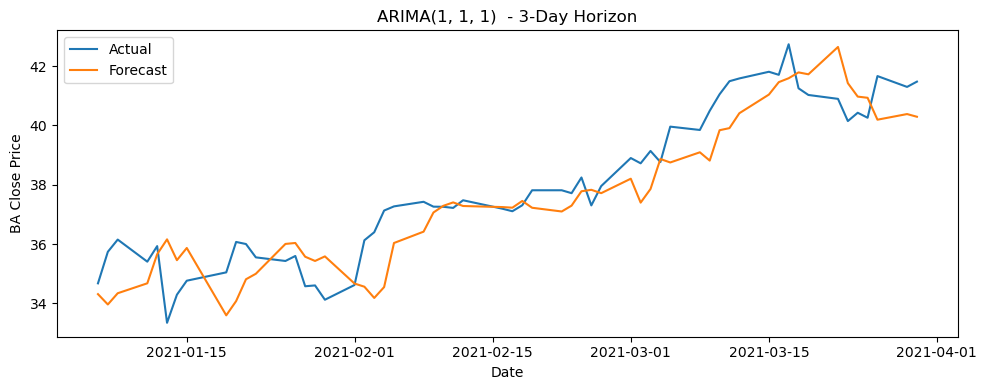


ARIMA(1, 1, 1)  - Horizon 7
  RMSE: 1.52
  MAE:  1.21
  MAPE: 3.15%


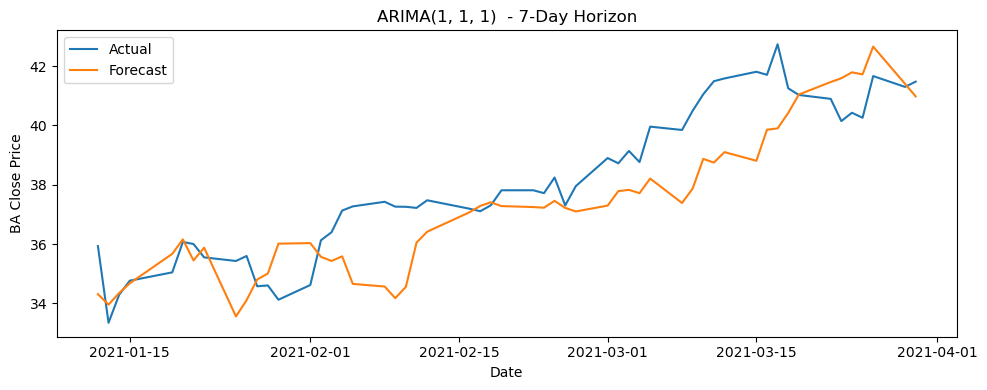


 Saved metrics to baseline_metrics_dell.csv

SARIMA(0, 1, 2) (Seasonal) - Horizon 1
  RMSE: 0.66
  MAE:  0.48
  MAPE: 1.30%


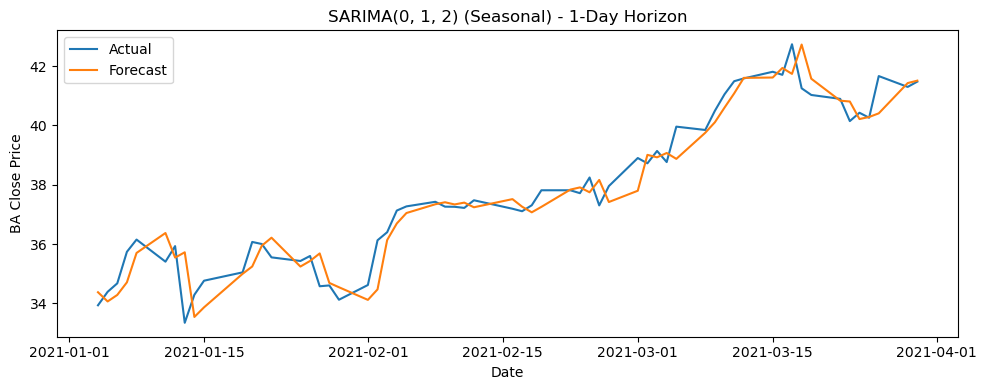


SARIMA(0, 1, 2) (Seasonal) - Horizon 3
  RMSE: 1.15
  MAE:  0.92
  MAPE: 2.45%


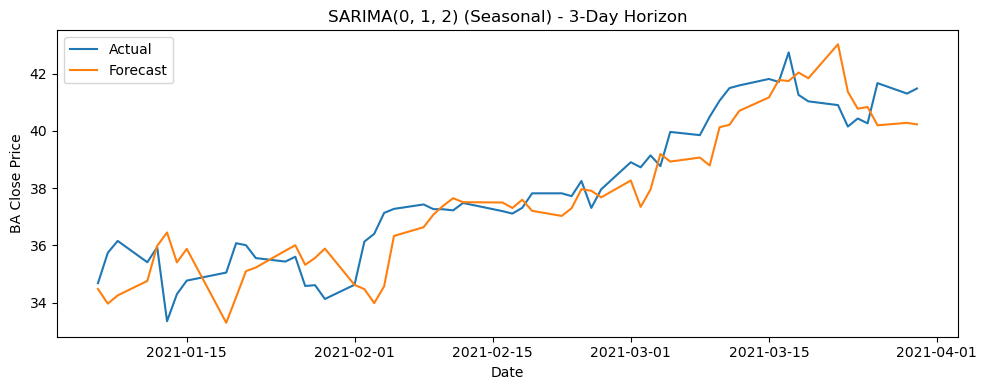


SARIMA(0, 1, 2) (Seasonal) - Horizon 7
  RMSE: 1.55
  MAE:  1.26
  MAPE: 3.27%


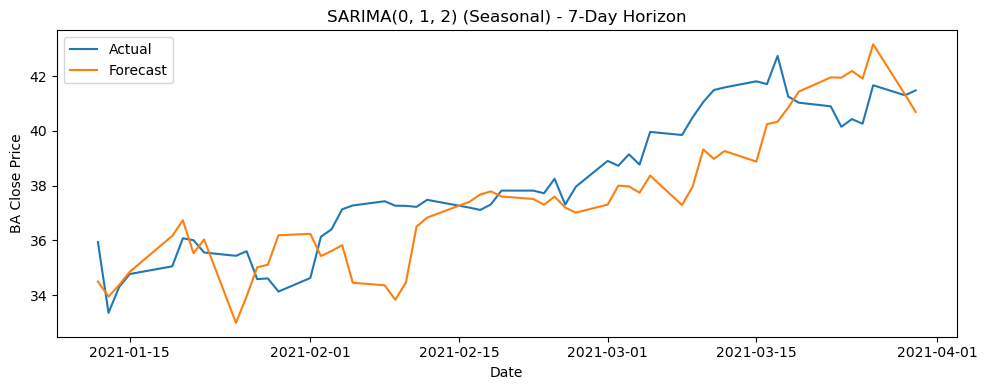


 Saved metrics to baseline_metrics_dell.csv


In [34]:
#running baseline functions
forecast_horizons = [1, 3, 7]
train_end = "2020-12-31"
test_start = "2021-01-01"

# ARIMA(0,1,2) - baseline non-seasonal
baseline_arima_012 = rolling_forecast_baseline_model(
    df=df,
    model_order=(0, 1, 2),
    forecast_horizons=forecast_horizons,
    train_end_date=train_end,
    test_start_date=test_start,
    output_csv_path="baseline_metrics_dell.csv",
    seasonal_order=None
)
# ARIMA(1,1,1) - baseline non-seasonal
baseline_arima_111 = rolling_forecast_baseline_model(
    df=df,
    model_order=(1, 1, 1),
    forecast_horizons=forecast_horizons,
    train_end_date=train_end,
    test_start_date=test_start,
    output_csv_path="baseline_metrics_dell.csv",
    seasonal_order=None
)
 
# Seasonal ARIMA(0,1,2)(1,0,0)[7] - baseline seasonal
baseline_seasonal = rolling_forecast_baseline_model(
    df=df,
    model_order=(0, 1, 2),
    forecast_horizons=forecast_horizons,
    train_end_date=train_end,
    test_start_date=test_start,
    output_csv_path="baseline_metrics_dell.csv",
    seasonal_order=(1, 0, 0, 7)
)

### Using exo variables with ARIMA
| Variable | Best Lag (days) | Sensible Lag (days) | Notes |
|----------|------------------|----------------------|-------|
| DX-Y.NYB | 5                | 5                    | Consistently low p-values across early lags |
| CL=F     | 1                | 8                    | Short-term effect best, but possible delayed cost impact |
| HG=F     | 1                | 1                    | Clear immediate impact from copper prices |


In [36]:
# Define sensible lag choices
exog_lags_sensible = {
    'DX-Y.NYB': 5,
    'CL=F': 8, #sensible to check incase longer lag (Also good metric) has diff efffect
    'HG=F': 1
}
exog_lags_best = {
    'DX-Y.NYB': 5,
    'CL=F': 1,
    'HG=F': 1
}

# CHOOSE which to use in this cell
exog_vars = exog_lags_sensible  # or exog_lags_best

### Testing grouped variable's impact on ARIMAX model

In [38]:
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    mask = y_true != 0
    return np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100

def rolling_forecast_sarimax_with_metrics(
    target_df,
    exog_df,
    exog_lags,
    model_order,
    forecast_horizons,
    train_end_date,
    test_start_date,
    output_csv_path,
    seasonal_order=None,
    plot=True,
    append_csv=True
):
    # alining index
    target_df = target_df.copy()
    target_df.index = pd.to_datetime(target_df.index)
    target_df = target_df.asfreq('B')

    exog_df = exog_df.copy()
    exog_df.index = pd.to_datetime(exog_df.index)
    exog_df = exog_df.asfreq('B')

    # getting lagged exogenous variables
    for var, lag in exog_lags.items():
        exog_df[f'{var}_lag{lag}'] = exog_df[var].shift(lag)

    exog_df.dropna(inplace=True)

    exog_cols = [f'{var}_lag{lag}' for var, lag in exog_lags.items()]

    # aligning target to the lagged exog index
    target = target_df.loc[exog_df.index]
    exog = exog_df[exog_cols]

    train_y = target[target.index <= train_end_date]
    test_y = target[target.index >= test_start_date]
    train_X = exog[exog.index <= train_end_date]
    test_X = exog[exog.index >= test_start_date]

    all_metrics = []

    for h in forecast_horizons:
        preds, actuals, dates = [], [], []

        for i in range(0, len(test_y) - h + 1):
            y_train = pd.concat([train_y, test_y.iloc[:i]])
            X_train = pd.concat([train_X, test_X.iloc[:i]])
            X_forecast = test_X.iloc[i:i + h]

            try:
                model = SARIMAX(
                    y_train,
                    exog=X_train,
                    order=model_order,
                    seasonal_order=seasonal_order,
                    enforce_stationarity=False,
                    enforce_invertibility=False
                )
                results = model.fit(disp=False)
                forecast = results.get_forecast(steps=h, exog=X_forecast)

                pred = forecast.predicted_mean.iloc[-1]
                actual = test_y.iloc[i + h - 1]

                if not np.isnan(pred) and not np.isnan(actual):
                    preds.append(pred)
                    actuals.append(actual)
                    dates.append(test_y.index[i + h - 1])
            except:
                continue

        if preds:
            rmse = np.sqrt(mean_squared_error(actuals, preds))
            mae = mean_absolute_error(actuals, preds)
            mape = mean_absolute_percentage_error(actuals, preds)
            all_metrics.append({
                'model': f"SARIMAX{model_order}" + (f" + Season{seasonal_order}" if seasonal_order else ""),
                'horizon': h,
                'rmse': rmse,
                'mae': mae,
                'mape': mape,
                'exog_vars': ','.join(exog_cols)
            })

            if plot:
                plt.figure(figsize=(10, 4))
                plt.plot(dates, actuals, label='Actual')
                plt.plot(dates, preds, label='Forecast')
                plt.title(f"SARIMAX{model_order}{' + Seasonal' if seasonal_order else ''} Horizon={h}")
                plt.xlabel('Date')
                plt.ylabel('DELL Price')
                plt.legend()
                plt.tight_layout()
                plt.show()

            print(f"Horizon {h}: RMSE={rmse:.2f}, MAE={mae:.2f}, MAPE={mape:.2f}")

    df_metrics = pd.DataFrame(all_metrics)
    if append_csv and os.path.exists(output_csv_path):
        df_existing = pd.read_csv(output_csv_path)
        df_combined = pd.concat([df_existing, df_metrics], ignore_index=True)
        df_combined.to_csv(output_csv_path, index=False)
    else:
        df_metrics.to_csv(output_csv_path, index=False)

    print(f"\n Metrics saved to: {output_csv_path}")
    return df_metrics

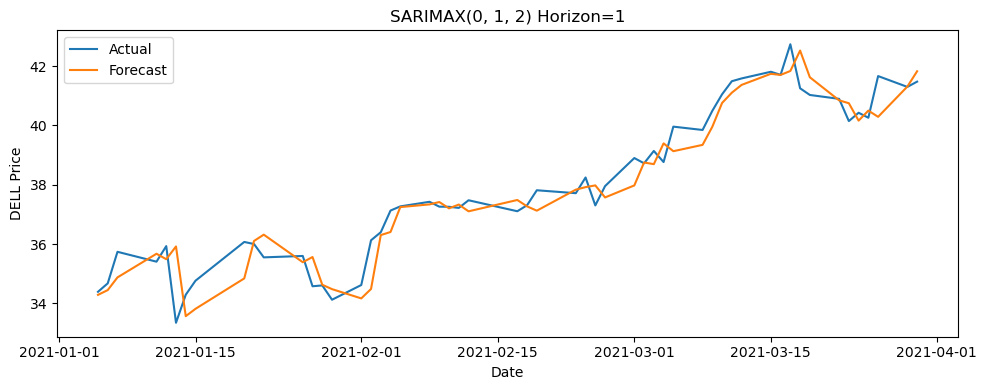

Horizon 1: RMSE=0.69, MAE=0.49, MAPE=1.32


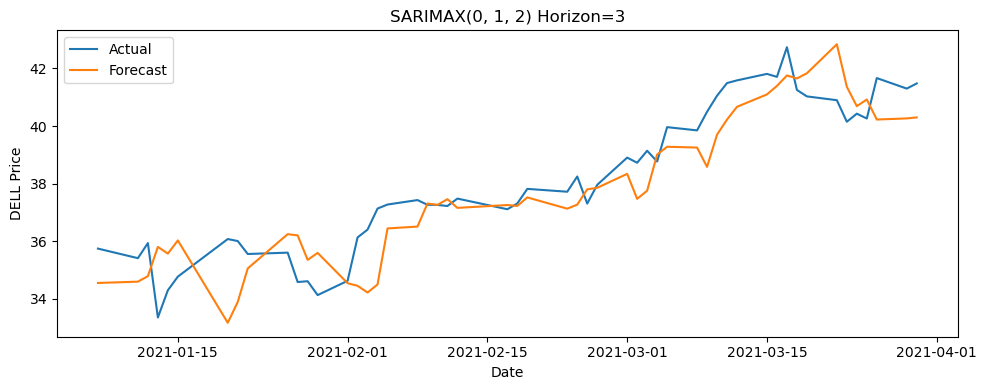

Horizon 3: RMSE=1.20, MAE=0.98, MAPE=2.60


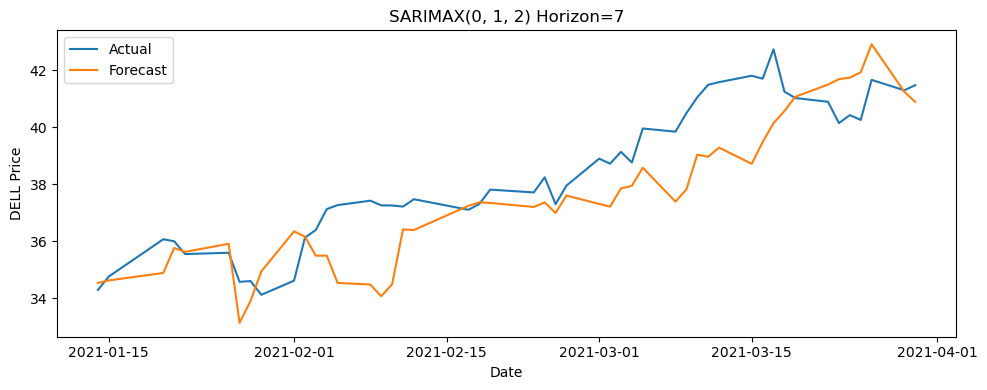

Horizon 7: RMSE=1.56, MAE=1.25, MAPE=3.21

 Metrics saved to: grouped_sarimax_best_dell.csv


,model,horizon,rmse,mae,mape,exog_vars
0,"SARIMAX(0, 1, 2)",1,0.688071,0.493786,1.320837,"DX-Y.NYB_lag5,CL=F_lag1,HG=F_lag1"
1,"SARIMAX(0, 1, 2)",3,1.199132,0.978605,2.598092,"DX-Y.NYB_lag5,CL=F_lag1,HG=F_lag1"
2,"SARIMAX(0, 1, 2)",7,1.562385,1.246436,3.205788,"DX-Y.NYB_lag5,CL=F_lag1,HG=F_lag1"


In [39]:
# grouped exo variables non-seasonal (best lags)
rolling_forecast_sarimax_with_metrics(
    target_df=df['DELL'],           # original, non-differenced target
    exog_df=df_diff,              # differenced/stationary exogenous inputs
    exog_lags=exog_lags_best,     # best lags configuration
    model_order=(0, 1, 2),
    forecast_horizons=[1, 3, 7],
    train_end_date="2020-12-31",
    test_start_date="2021-01-01",
    seasonal_order=None,
    output_csv_path="grouped_sarimax_best_dell.csv",
    plot=True,
    append_csv=False
)

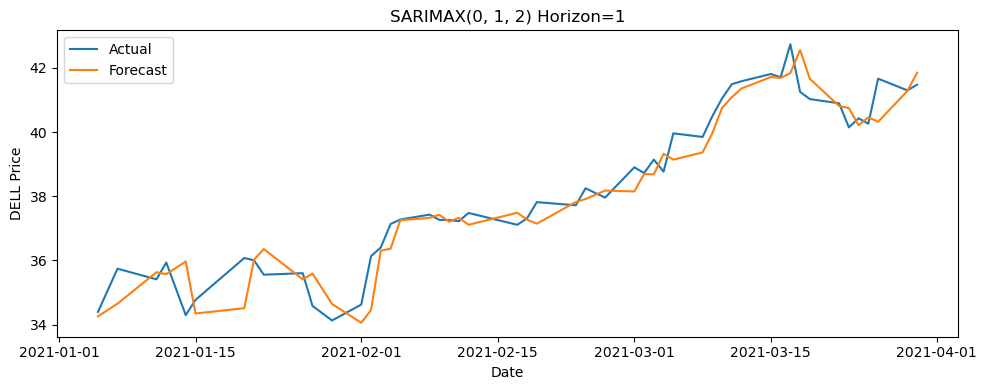

Horizon 1: RMSE=0.65, MAE=0.48, MAPE=1.27


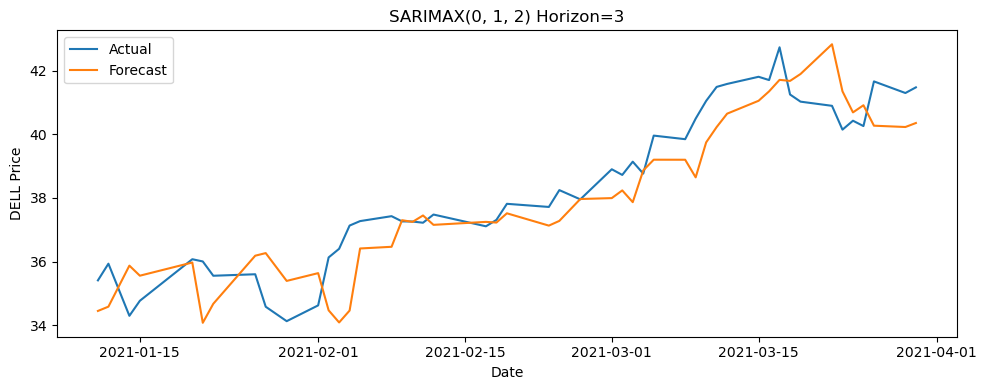

Horizon 3: RMSE=1.11, MAE=0.91, MAPE=2.40


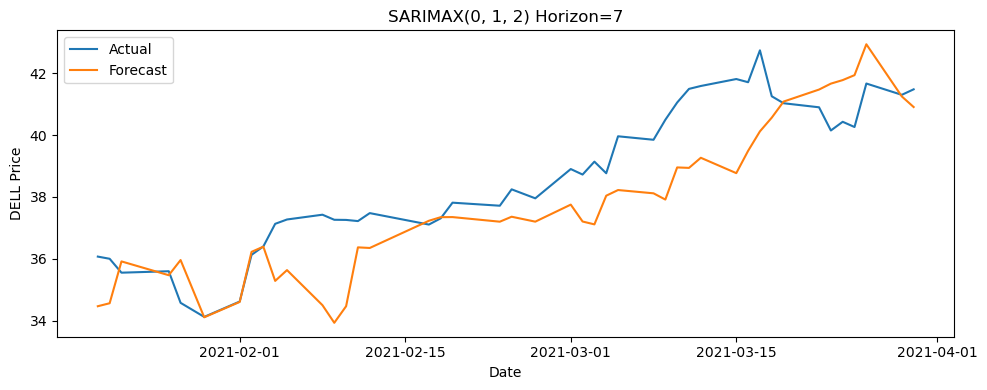

Horizon 7: RMSE=1.59, MAE=1.28, MAPE=3.27

 Metrics saved to: grouped_sarimax_sensible_dell.csv


,model,horizon,rmse,mae,mape,exog_vars
0,"SARIMAX(0, 1, 2)",1,0.653425,0.480065,1.271447,"DX-Y.NYB_lag5,CL=F_lag8,HG=F_lag1"
1,"SARIMAX(0, 1, 2)",3,1.105304,0.914346,2.401146,"DX-Y.NYB_lag5,CL=F_lag8,HG=F_lag1"
2,"SARIMAX(0, 1, 2)",7,1.594279,1.280884,3.270103,"DX-Y.NYB_lag5,CL=F_lag8,HG=F_lag1"


In [40]:
# grouped exo variables non-seasonal (sensible lags)
rolling_forecast_sarimax_with_metrics(
    target_df=df['DELL'],           # original data, with raw DELL values
    exog_df=df_diff,        # differenced exogenous variables.. if stationary, not diff-ed 
    exog_lags=exog_lags_sensible,
    model_order=(0, 1, 2),
    forecast_horizons=[1, 3, 7],
    train_end_date="2020-12-31",
    test_start_date="2021-01-01",
    seasonal_order=None,
    output_csv_path="grouped_sarimax_sensible_dell.csv",
    plot=True,
    append_csv=False
)

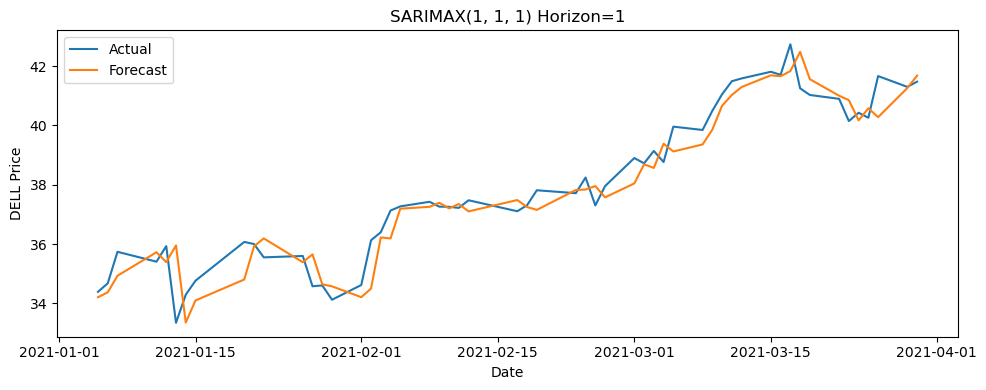

Horizon 1: RMSE=0.70, MAE=0.52, MAPE=1.38


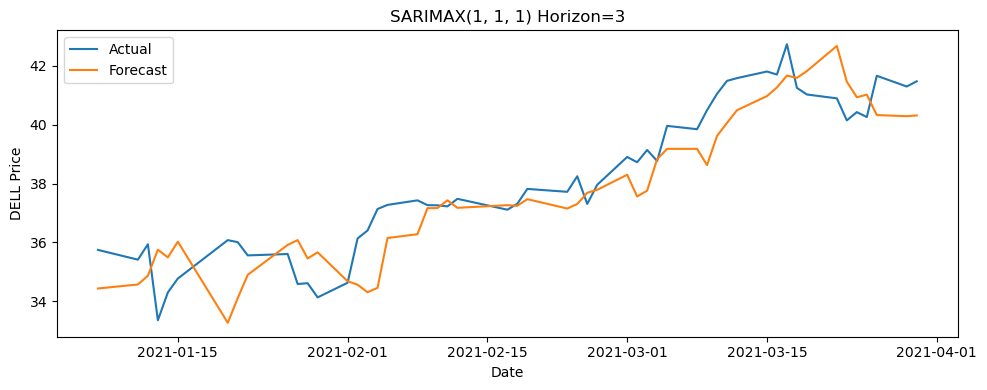

Horizon 3: RMSE=1.19, MAE=0.99, MAPE=2.62


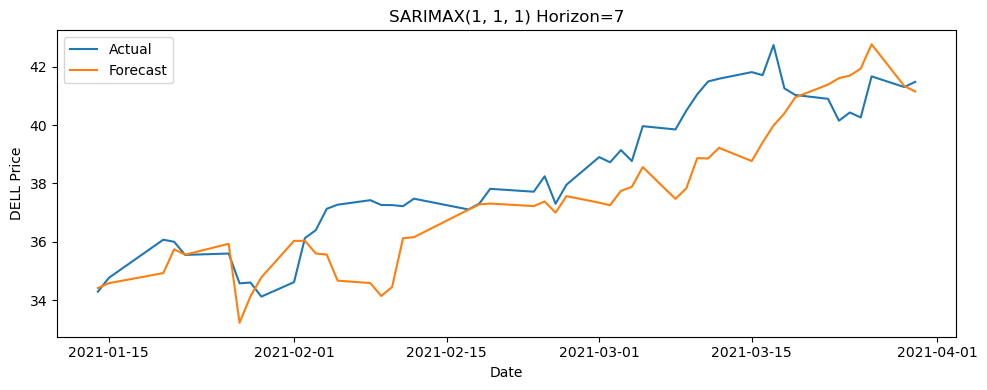

Horizon 7: RMSE=1.56, MAE=1.23, MAPE=3.16

 Metrics saved to: grouped_sarimax_best_dell.csv


,model,horizon,rmse,mae,mape,exog_vars
0,"SARIMAX(1, 1, 1)",1,0.700278,0.516169,1.380214,"DX-Y.NYB_lag5,CL=F_lag1,HG=F_lag1"
1,"SARIMAX(1, 1, 1)",3,1.194399,0.990142,2.623366,"DX-Y.NYB_lag5,CL=F_lag1,HG=F_lag1"
2,"SARIMAX(1, 1, 1)",7,1.555493,1.230358,3.157488,"DX-Y.NYB_lag5,CL=F_lag1,HG=F_lag1"


In [41]:
# grouped exo variables non-seasonal (best lags)
rolling_forecast_sarimax_with_metrics(
    target_df=df['DELL'],           # original, non-differenced target
    exog_df=df_diff,              # differenced/stationary exogenous inputs
    exog_lags=exog_lags_best,     # best lags configuration
    model_order=(1, 1, 1),
    forecast_horizons=[1, 3, 7],
    train_end_date="2020-12-31",
    test_start_date="2021-01-01",
    seasonal_order=None,
    output_csv_path="grouped_sarimax_best_dell.csv",
    plot=True,
    append_csv=True
)

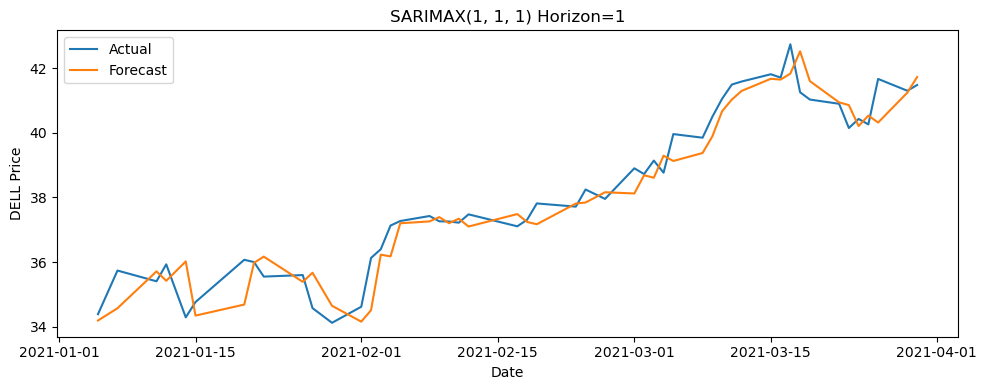

Horizon 1: RMSE=0.66, MAE=0.50, MAPE=1.32


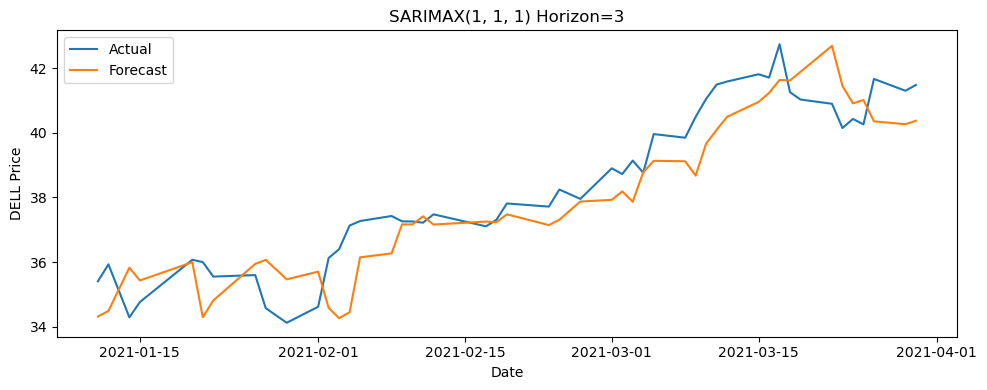

Horizon 3: RMSE=1.10, MAE=0.93, MAPE=2.43


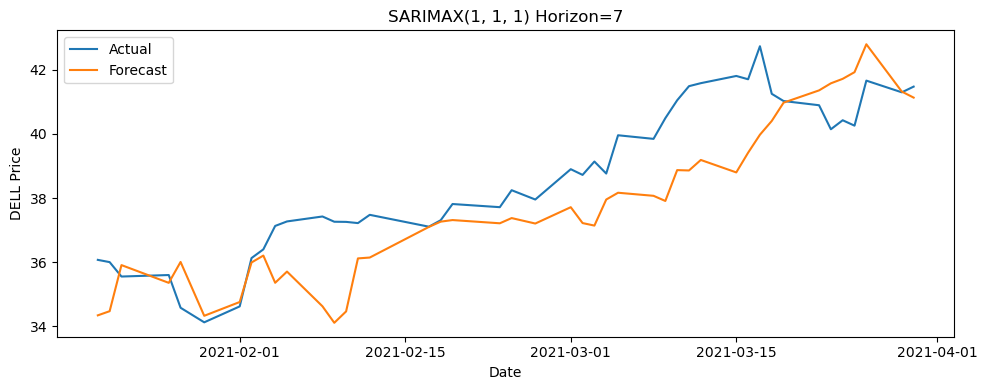

Horizon 7: RMSE=1.60, MAE=1.30, MAPE=3.33

 Metrics saved to: grouped_sarimax_sensible_dell.csv


,model,horizon,rmse,mae,mape,exog_vars
0,"SARIMAX(1, 1, 1)",1,0.657903,0.496859,1.315160,"DX-Y.NYB_lag5,CL=F_lag8,HG=F_lag1"
1,"SARIMAX(1, 1, 1)",3,1.101408,0.926284,2.426508,"DX-Y.NYB_lag5,CL=F_lag8,HG=F_lag1"
2,"SARIMAX(1, 1, 1)",7,1.603443,1.302357,3.330032,"DX-Y.NYB_lag5,CL=F_lag8,HG=F_lag1"


In [42]:
# grouped exo variables non-seasonal (sensible lags)
rolling_forecast_sarimax_with_metrics(
    target_df=df['DELL'],           # original data, with raw DELL values
    exog_df=df_diff,        # differenced exogenous variables.. if stationary, not diff-ed 
    exog_lags=exog_lags_sensible,
    model_order=(1, 1, 1),
    forecast_horizons=[1, 3, 7],
    train_end_date="2020-12-31",
    test_start_date="2021-01-01",
    seasonal_order=None,
    output_csv_path="grouped_sarimax_sensible_dell.csv",
    plot=True,
    append_csv=True
)

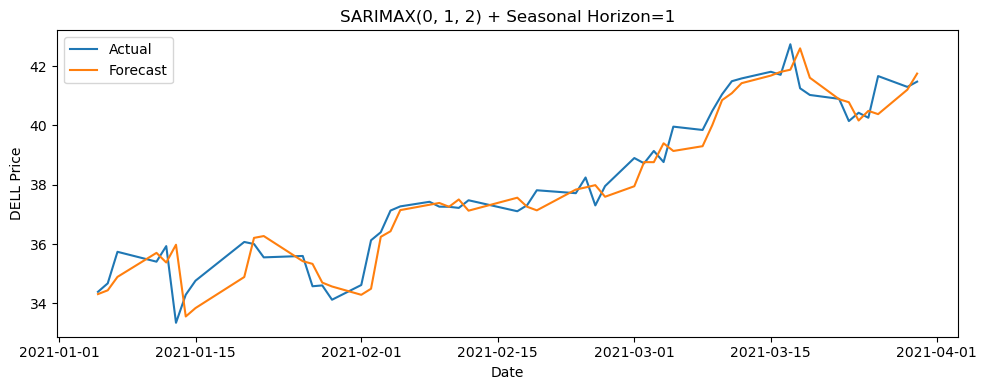

Horizon 1: RMSE=0.68, MAE=0.50, MAPE=1.33


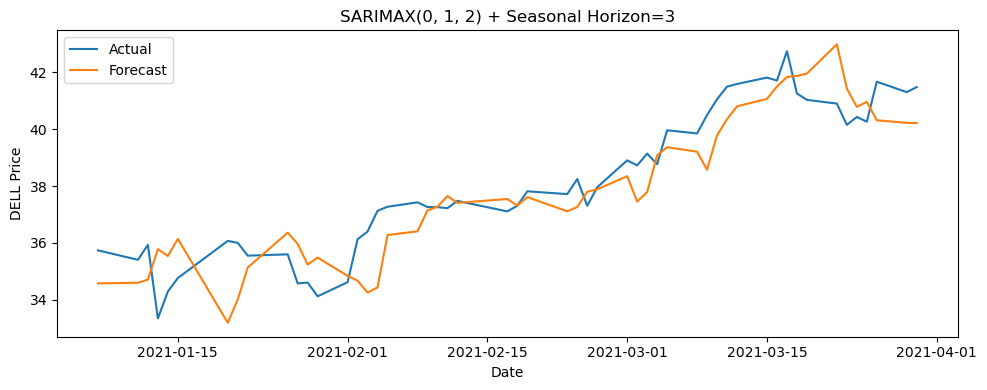

Horizon 3: RMSE=1.19, MAE=0.98, MAPE=2.60


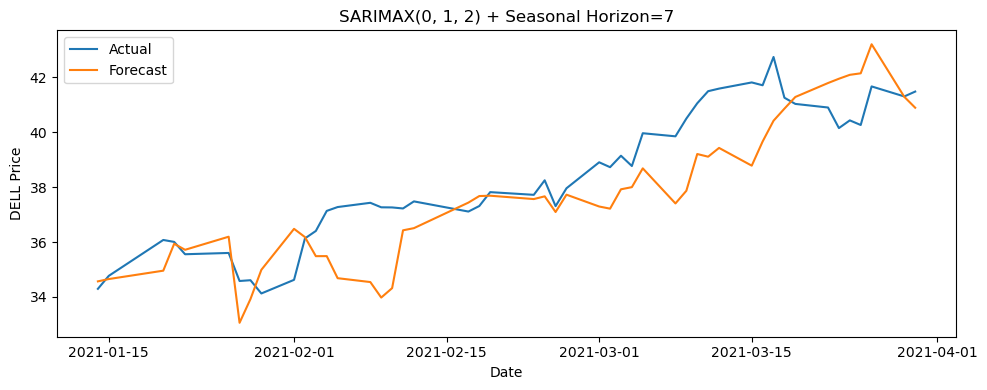

Horizon 7: RMSE=1.56, MAE=1.24, MAPE=3.20

 Metrics saved to: grouped_sarimax_best_seasonal_dell.csv


,model,horizon,rmse,mae,mape,exog_vars
0,"SARIMAX(0, 1, 2) + Season(1, 0, 0, 7)",1,0.683306,0.495702,1.326334,"DX-Y.NYB_lag5,CL=F_lag1,HG=F_lag1"
1,"SARIMAX(0, 1, 2) + Season(1, 0, 0, 7)",3,1.190648,0.980104,2.600125,"DX-Y.NYB_lag5,CL=F_lag1,HG=F_lag1"
2,"SARIMAX(0, 1, 2) + Season(1, 0, 0, 7)",7,1.556202,1.241782,3.196773,"DX-Y.NYB_lag5,CL=F_lag1,HG=F_lag1"


In [43]:
# grouped exo variables seasonal (best lags)
rolling_forecast_sarimax_with_metrics(
    target_df=df['DELL'],                      # original (non-differenced) target
    exog_df=df_diff,                         # differenced/stationary exogenous inputs
    exog_lags=exog_lags_best,
    model_order=(0, 1, 2),
    forecast_horizons=[1, 3, 7],
    train_end_date="2020-12-31",
    test_start_date="2021-01-01",
    seasonal_order=(1, 0, 0, 7),
    output_csv_path="grouped_sarimax_best_seasonal_dell.csv",
    plot=True,
    append_csv=False
)

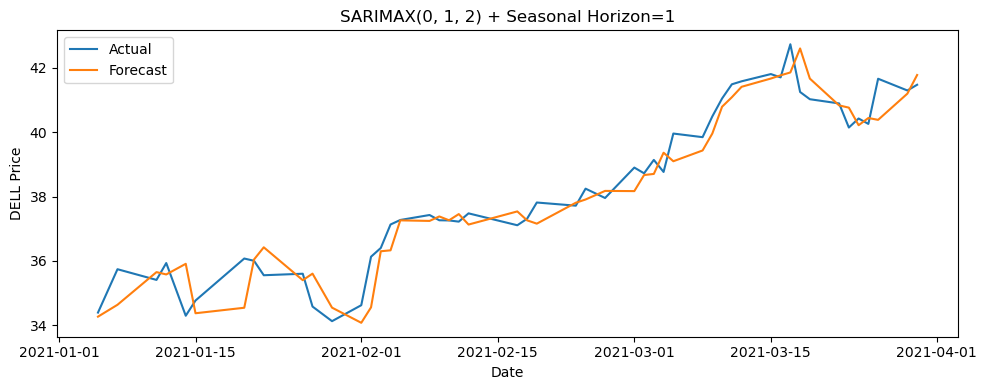

Horizon 1: RMSE=0.64, MAE=0.48, MAPE=1.27


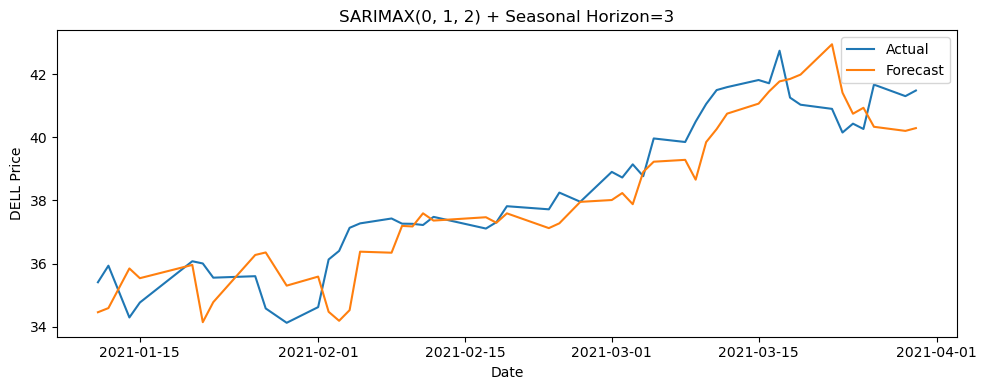

Horizon 3: RMSE=1.10, MAE=0.91, MAPE=2.40


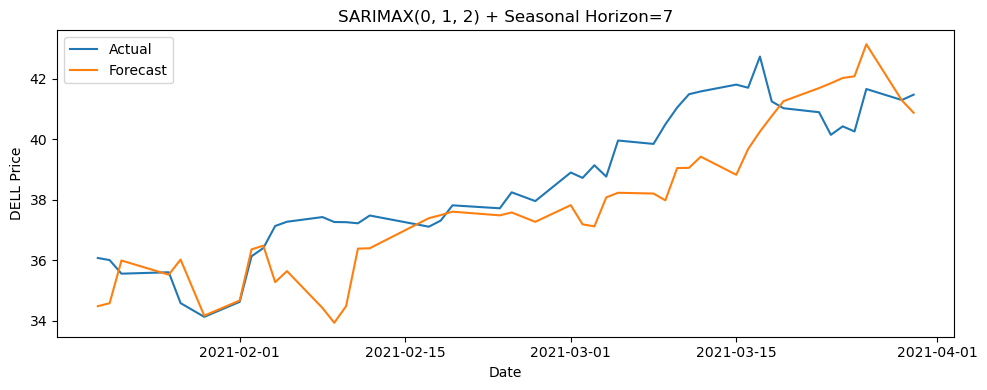

Horizon 7: RMSE=1.58, MAE=1.28, MAPE=3.26

 Metrics saved to: grouped_sarimax_sensible_seasonal_dell.csv


,model,horizon,rmse,mae,mape,exog_vars
0,"SARIMAX(0, 1, 2) + Season(1, 0, 0, 7)",1,0.644578,0.478418,1.266625,"DX-Y.NYB_lag5,CL=F_lag8,HG=F_lag1"
1,"SARIMAX(0, 1, 2) + Season(1, 0, 0, 7)",3,1.097627,0.913421,2.397951,"DX-Y.NYB_lag5,CL=F_lag8,HG=F_lag1"
2,"SARIMAX(0, 1, 2) + Season(1, 0, 0, 7)",7,1.581574,1.277269,3.263040,"DX-Y.NYB_lag5,CL=F_lag8,HG=F_lag1"


In [44]:
# grouped exo variables seasonal (sensible lags)
rolling_forecast_sarimax_with_metrics(
    target_df=df['DELL'],                      # original target, not differenced
    exog_df=df_diff,                         # pre-stationarised exogenous variables
    exog_lags=exog_lags_sensible,
    model_order=(0, 1, 2),
    forecast_horizons=[1, 3, 7],
    train_end_date="2020-12-31",
    test_start_date="2021-01-01",
    seasonal_order=(1, 0, 0, 7),            # 30-day seasonality
    output_csv_path="grouped_sarimax_sensible_seasonal_dell.csv",
    plot=True,
    append_csv=False
)

### Evaluation exo variables individually

In [46]:
# One-by-one exogenous variable SARIMAX evaluation with metrics + seasonal + plots + CSV
def evaluate_single_exog_var_with_metrics(
    target_df,                  # original data, raw DELL
    exog_df,                    # differenced/stationary exogenous input
    var_name,
    lag,
    model_order,
    forecast_horizons,
    train_end_date,
    test_start_date,
    output_csv_path,
    seasonal_order=None,
    append_csv=True,
    plot=True
):
    target_df = target_df.copy()
    target_df.index = pd.to_datetime(target_df.index)
    target_df = target_df.asfreq('B')

    exog_df = exog_df.copy()
    exog_df.index = pd.to_datetime(exog_df.index)
    exog_df = exog_df.asfreq('B')

    lagged_col = f'{var_name}_lag{lag}'
    exog_df[lagged_col] = exog_df[var_name].shift(lag)
    exog_df.dropna(inplace=True)

    exog = exog_df[[lagged_col]]
    target = target_df['DELL'].loc[exog_df.index]  # align with lagged exog

    train_y = target[target.index <= train_end_date]
    test_y = target[target.index >= test_start_date]
    train_X = exog[exog.index <= train_end_date]
    test_X = exog[exog.index >= test_start_date]

    all_metrics = []

    for h in forecast_horizons:
        preds, actuals, dates = [], [], []

        for i in range(0, len(test_y) - h + 1):
            y_train = pd.concat([train_y, test_y.iloc[:i]])
            X_train = pd.concat([train_X, test_X.iloc[:i]])
            X_forecast = test_X.iloc[i:i + h]

            try:
                model = SARIMAX(
                    y_train,
                    exog=X_train,
                    order=model_order,
                    seasonal_order=seasonal_order,
                    enforce_stationarity=False,
                    enforce_invertibility=False
                )
                results = model.fit(disp=False)
                forecast = results.get_forecast(steps=h, exog=X_forecast)
                pred = forecast.predicted_mean.iloc[-1]
                actual = test_y.iloc[i + h - 1]

                if not np.isnan(pred) and not np.isnan(actual):
                    preds.append(pred)
                    actuals.append(actual)
                    dates.append(test_y.index[i + h - 1])
            except:
                continue

        if preds:
            rmse = np.sqrt(mean_squared_error(actuals, preds))
            mae = mean_absolute_error(actuals, preds)
            mape = mean_absolute_percentage_error(actuals, preds)
            print(f"{var_name} (lag={lag}) - Horizon {h} | RMSE: {rmse:.2f}, MAE: {mae:.2f}, MAPE: {mape:.2f}%")

            all_metrics.append({
                'model': f"SARIMAX{model_order}" + (f" + Season{seasonal_order}" if seasonal_order else ""),
                'exog_var': var_name,
                'lag': lag,
                'horizon': h,
                'rmse': rmse,
                'mae': mae,
                'mape': mape
            })

            if plot:
                plt.figure(figsize=(10, 4))
                plt.plot(dates, actuals, label='Actual')
                plt.plot(dates, preds, label='Forecast')
                plt.title(f"{var_name} (lag={lag}) Horizon={h}{' + Seasonal' if seasonal_order else ''}")
                plt.xlabel("Date")
                plt.ylabel("BA Price")
                plt.legend()
                plt.tight_layout()
                plt.show()

    df_metrics = pd.DataFrame(all_metrics)
    if append_csv and os.path.exists(output_csv_path):
        df_existing = pd.read_csv(output_csv_path)
        df_combined = pd.concat([df_existing, df_metrics], ignore_index=True)
        df_combined.to_csv(output_csv_path, index=False)
    else:
        df_metrics.to_csv(output_csv_path, index=False)

    print(f"\n Metrics for {var_name} saved to: {output_csv_path}")
    return df_metrics

DX-Y.NYB (lag=5) - Horizon 1 | RMSE: 0.68, MAE: 0.49, MAPE: 1.32%


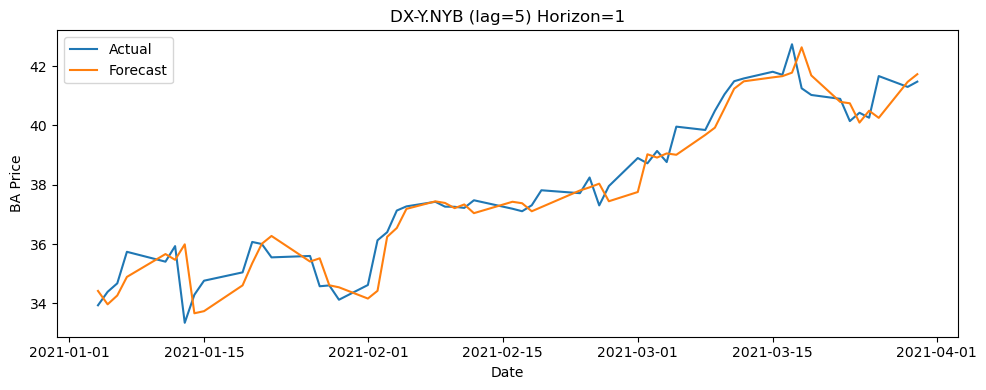

DX-Y.NYB (lag=5) - Horizon 3 | RMSE: 1.16, MAE: 0.95, MAPE: 2.53%


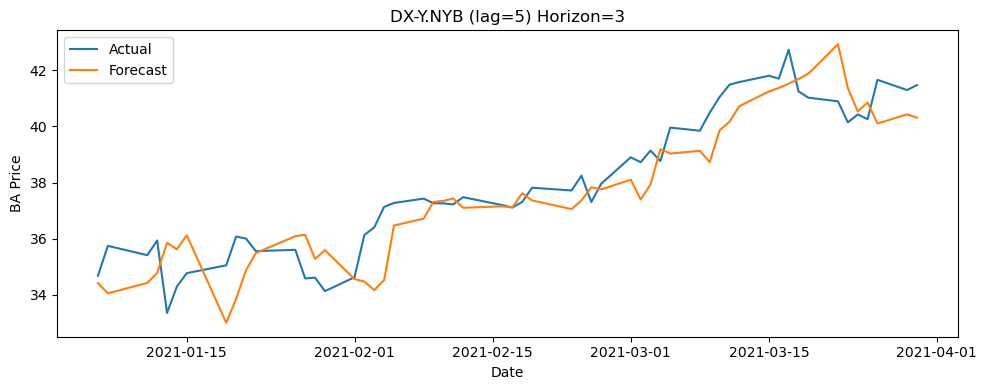

DX-Y.NYB (lag=5) - Horizon 7 | RMSE: 1.54, MAE: 1.24, MAPE: 3.20%


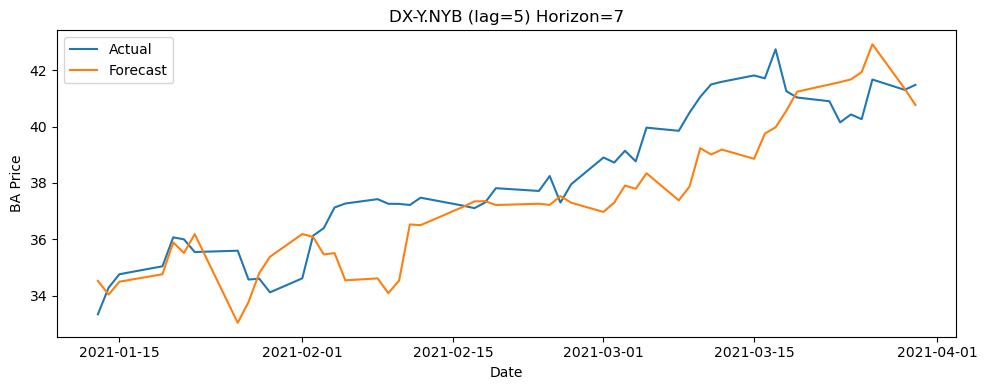


 Metrics for DX-Y.NYB saved to: exo_eval_best_dell.csv
CL=F (lag=1) - Horizon 1 | RMSE: 0.69, MAE: 0.50, MAPE: 1.33%


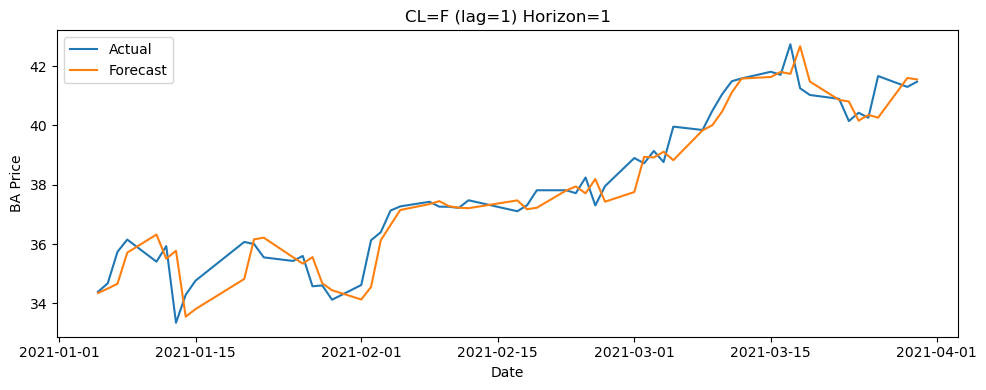

CL=F (lag=1) - Horizon 3 | RMSE: 1.19, MAE: 0.95, MAPE: 2.53%


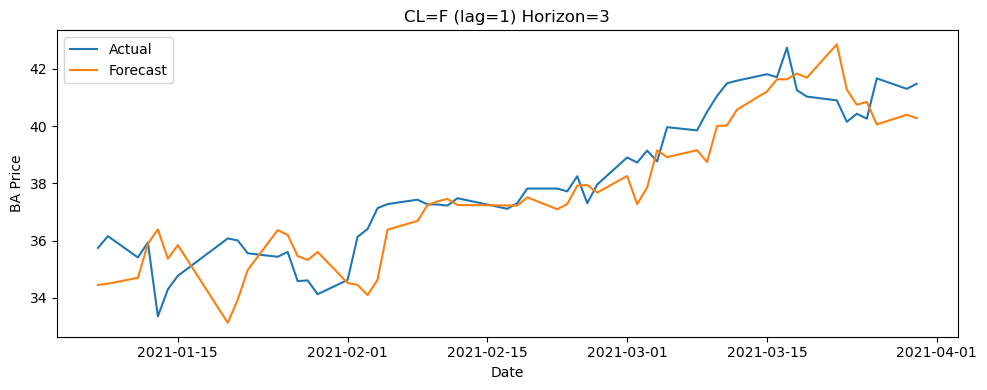

CL=F (lag=1) - Horizon 7 | RMSE: 1.56, MAE: 1.25, MAPE: 3.24%


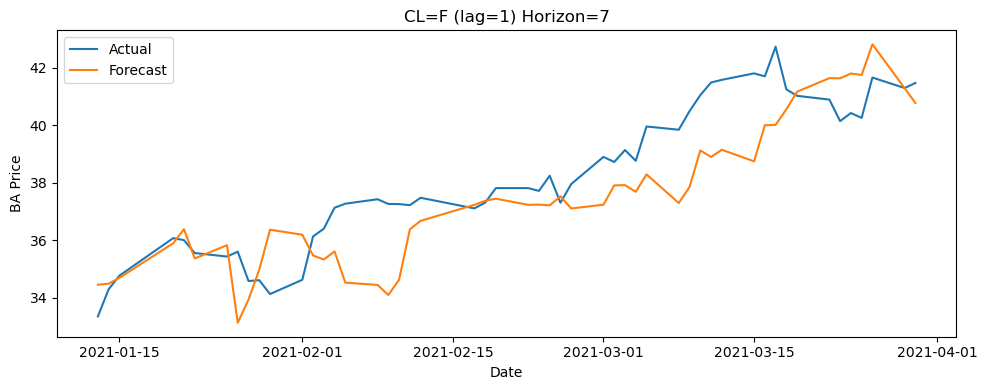


 Metrics for CL=F saved to: exo_eval_best_dell.csv
HG=F (lag=1) - Horizon 1 | RMSE: 0.66, MAE: 0.49, MAPE: 1.31%


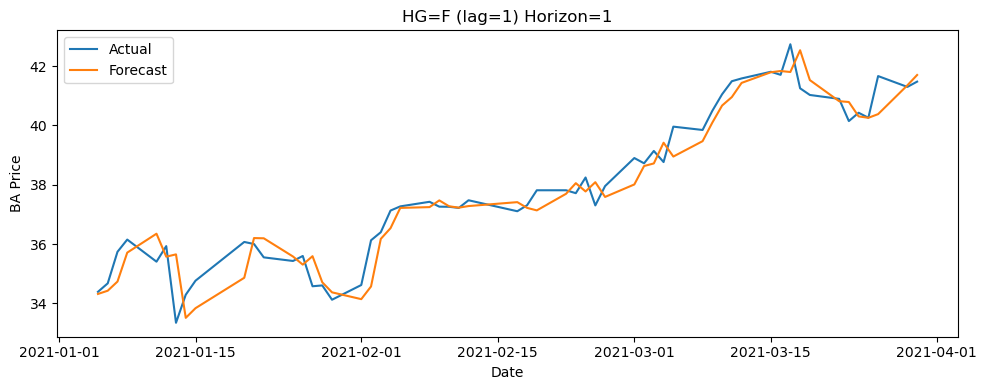

HG=F (lag=1) - Horizon 3 | RMSE: 1.18, MAE: 0.94, MAPE: 2.50%


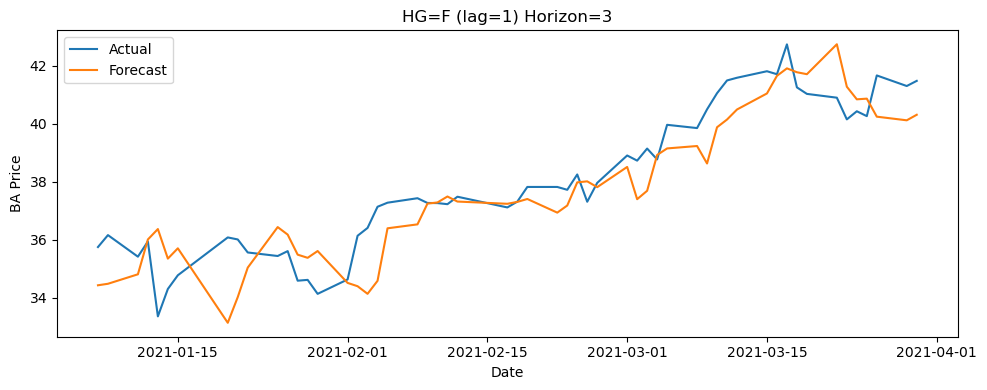

HG=F (lag=1) - Horizon 7 | RMSE: 1.57, MAE: 1.25, MAPE: 3.24%


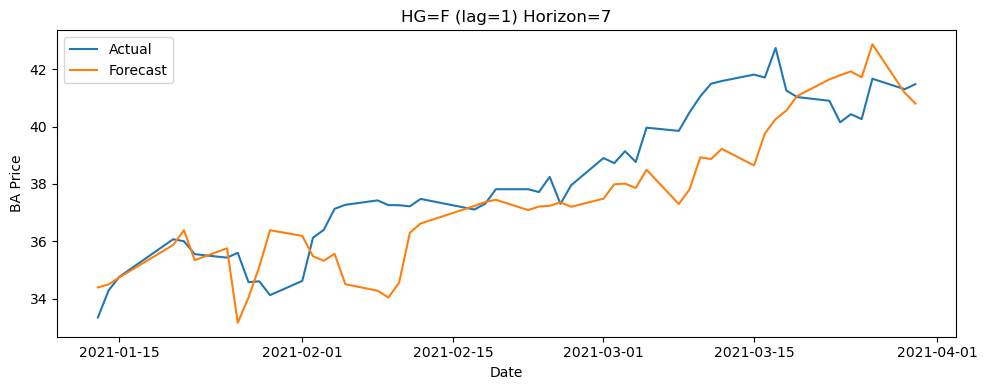


 Metrics for HG=F saved to: exo_eval_best_dell.csv


In [47]:
# with "best" lags
for var, lag in exog_lags_best.items():
    evaluate_single_exog_var_with_metrics(
        target_df=df,                   # original target (non-differenced)
        exog_df=df_diff,                # stationary/differenced exogenous inputs
        var_name=var,
        lag=lag,
        model_order=(0, 1, 2),
        forecast_horizons=[1, 3, 7],
        train_end_date="2020-12-31",
        test_start_date="2021-01-01",
        output_csv_path="exo_eval_best_dell.csv",
        seasonal_order=None,
        append_csv=False,
        plot=True
    )

DX-Y.NYB (lag=5) - Horizon 1 | RMSE: 0.68, MAE: 0.49, MAPE: 1.32%


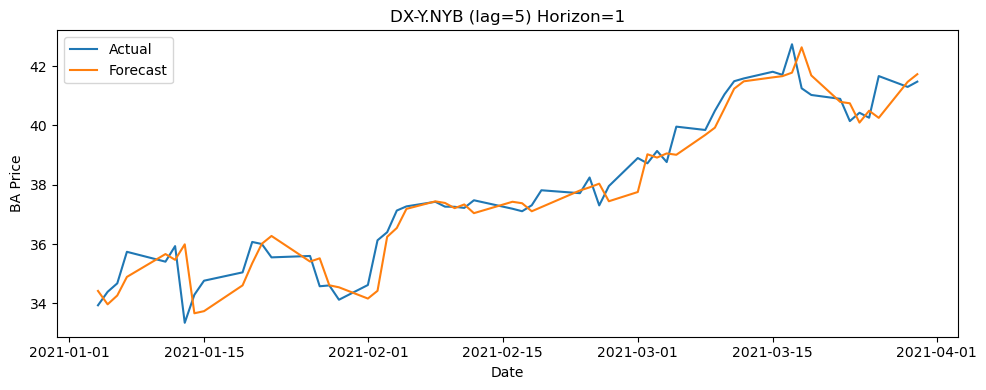

DX-Y.NYB (lag=5) - Horizon 3 | RMSE: 1.16, MAE: 0.95, MAPE: 2.53%


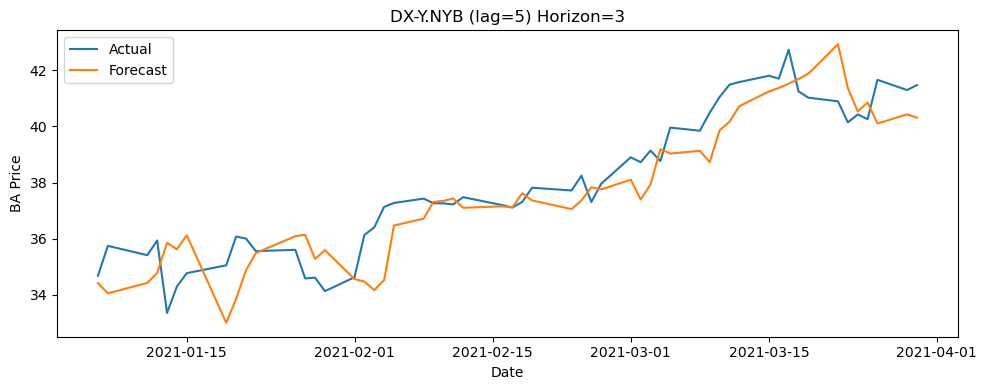

DX-Y.NYB (lag=5) - Horizon 7 | RMSE: 1.54, MAE: 1.24, MAPE: 3.20%


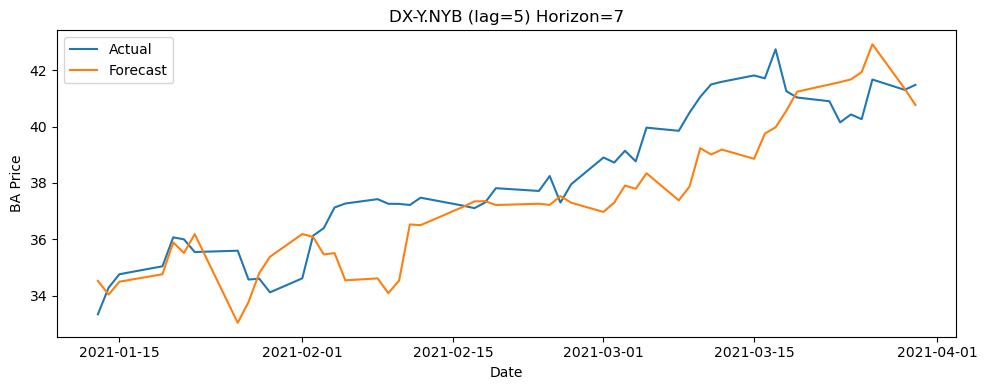


 Metrics for DX-Y.NYB saved to: exo_eval_sensible_dell.csv
CL=F (lag=8) - Horizon 1 | RMSE: 0.63, MAE: 0.46, MAPE: 1.23%


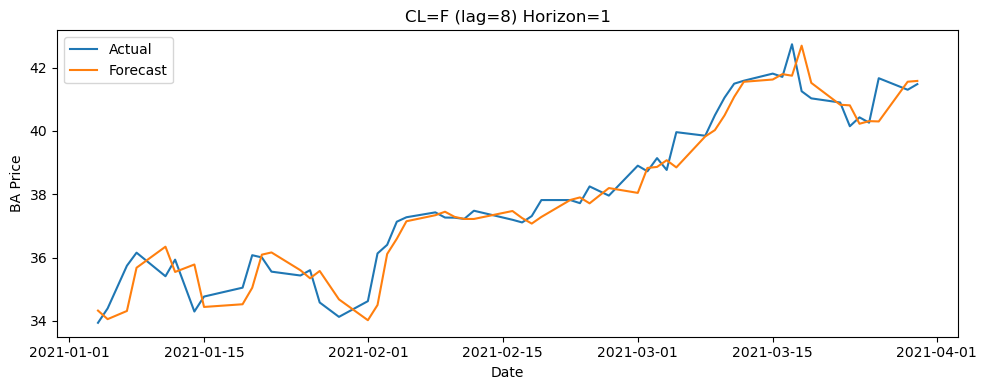

CL=F (lag=8) - Horizon 3 | RMSE: 1.10, MAE: 0.90, MAPE: 2.38%


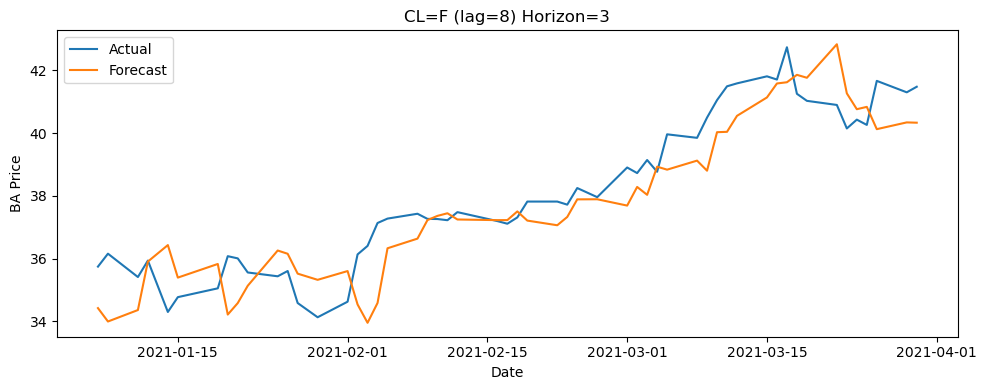

CL=F (lag=8) - Horizon 7 | RMSE: 1.49, MAE: 1.19, MAPE: 3.06%


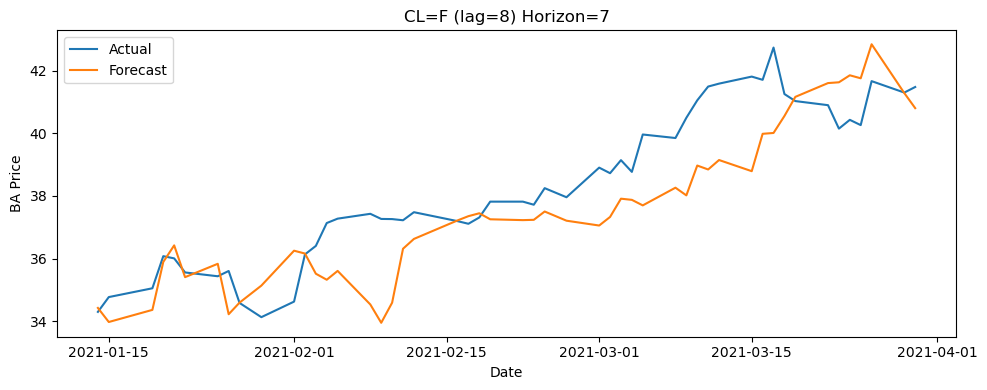


 Metrics for CL=F saved to: exo_eval_sensible_dell.csv
HG=F (lag=1) - Horizon 1 | RMSE: 0.66, MAE: 0.49, MAPE: 1.31%


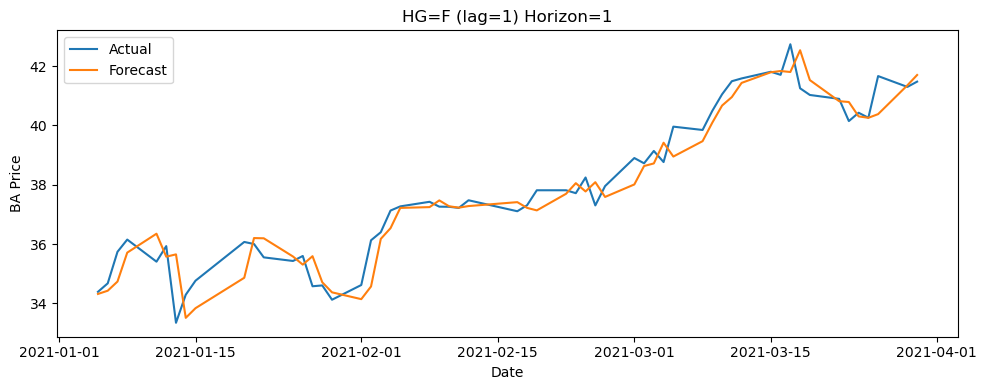

HG=F (lag=1) - Horizon 3 | RMSE: 1.18, MAE: 0.94, MAPE: 2.50%


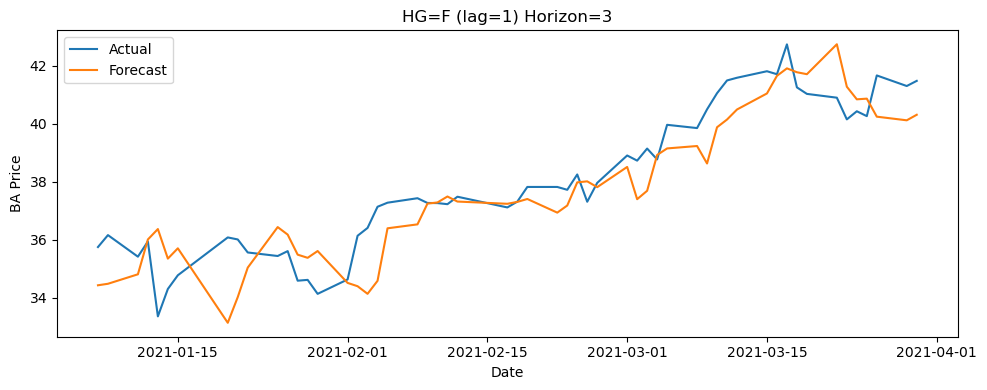

HG=F (lag=1) - Horizon 7 | RMSE: 1.57, MAE: 1.25, MAPE: 3.24%


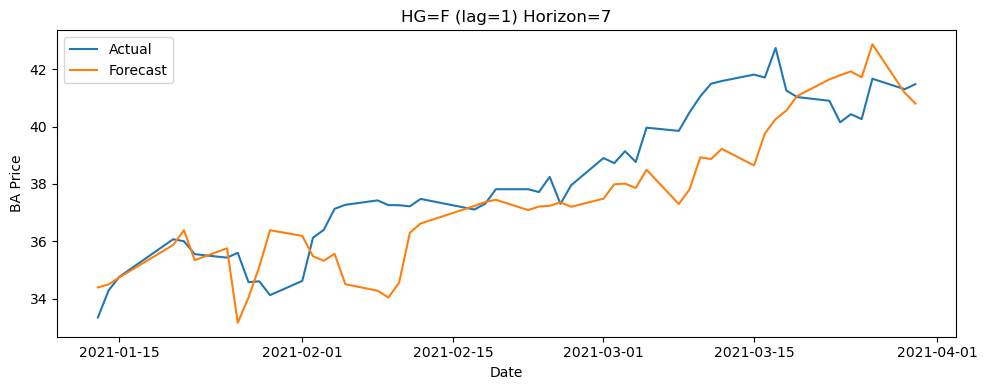


 Metrics for HG=F saved to: exo_eval_sensible_dell.csv


In [48]:
for var, lag in exog_lags_sensible.items():
    evaluate_single_exog_var_with_metrics(
        target_df=df,                   # original BA data
        exog_df=df_diff,                # stationary exog inputs
        var_name=var,
        lag=lag,
        model_order=(0, 1, 2),
        forecast_horizons=[1, 3, 7],
        train_end_date="2020-12-31",
        test_start_date="2021-01-01",
        output_csv_path="exo_eval_sensible_dell.csv",
        seasonal_order=None,
        append_csv=False,
        plot=True
    )

DX-Y.NYB (lag=5) - Horizon 1 | RMSE: 0.69, MAE: 0.51, MAPE: 1.36%


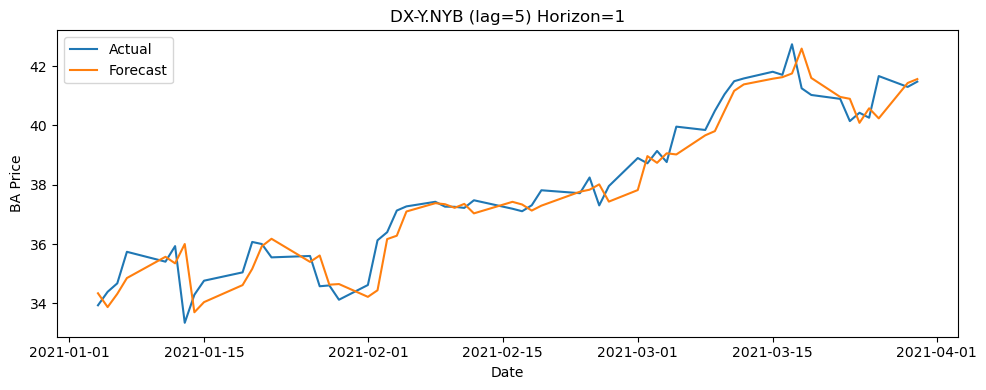

DX-Y.NYB (lag=5) - Horizon 3 | RMSE: 1.15, MAE: 0.96, MAPE: 2.55%


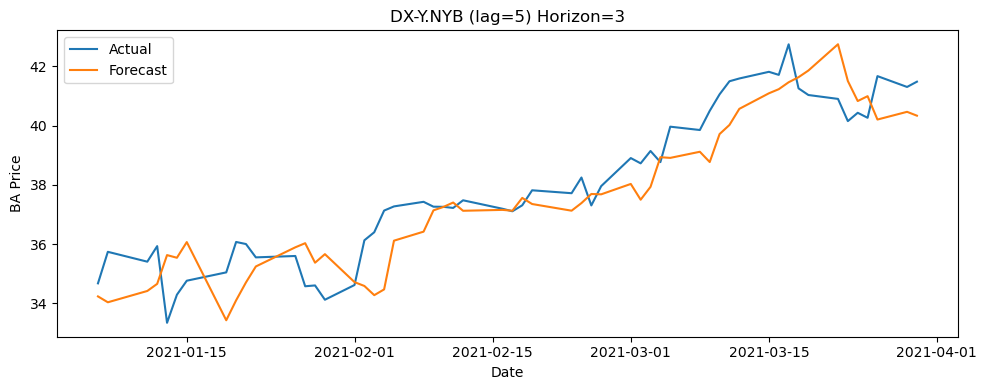

DX-Y.NYB (lag=5) - Horizon 7 | RMSE: 1.53, MAE: 1.22, MAPE: 3.15%


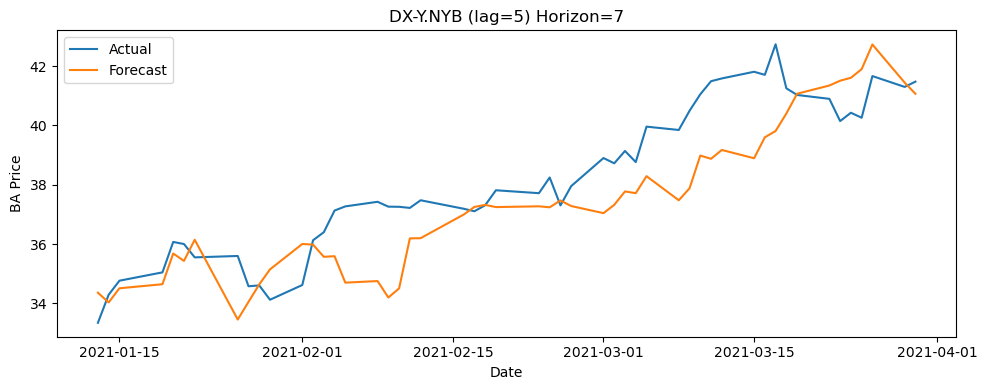


 Metrics for DX-Y.NYB saved to: exo_eval_best_dell.csv
CL=F (lag=1) - Horizon 1 | RMSE: 0.70, MAE: 0.51, MAPE: 1.36%


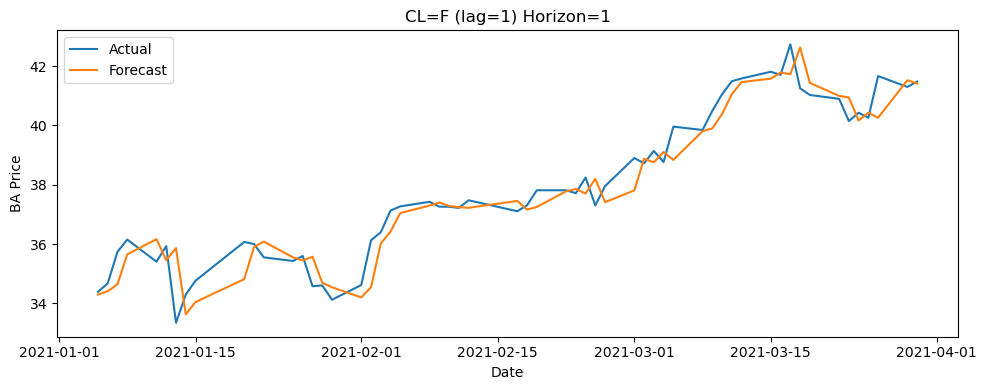

CL=F (lag=1) - Horizon 3 | RMSE: 1.17, MAE: 0.97, MAPE: 2.56%


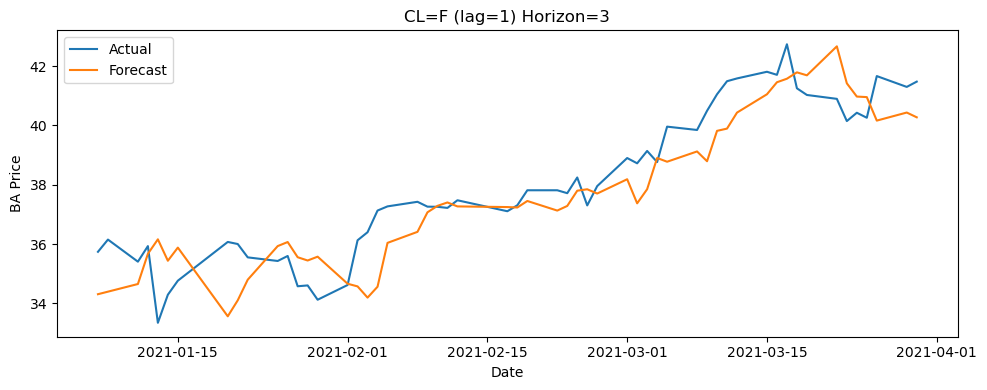

CL=F (lag=1) - Horizon 7 | RMSE: 1.54, MAE: 1.22, MAPE: 3.16%


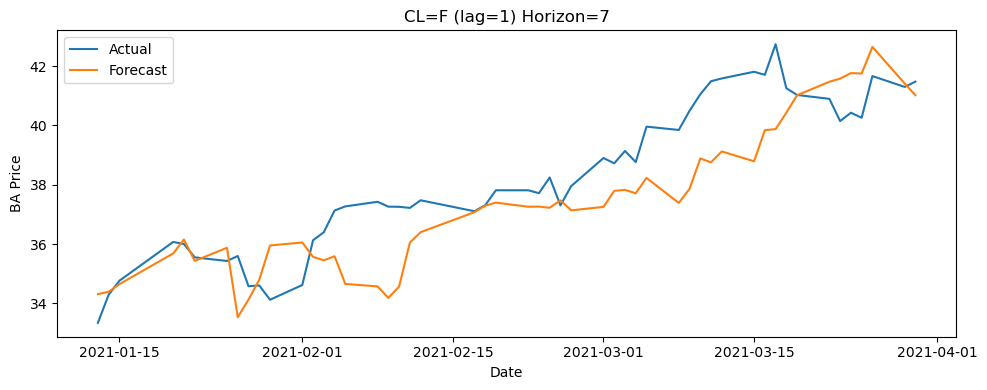


 Metrics for CL=F saved to: exo_eval_best_dell.csv
HG=F (lag=1) - Horizon 1 | RMSE: 0.67, MAE: 0.49, MAPE: 1.32%


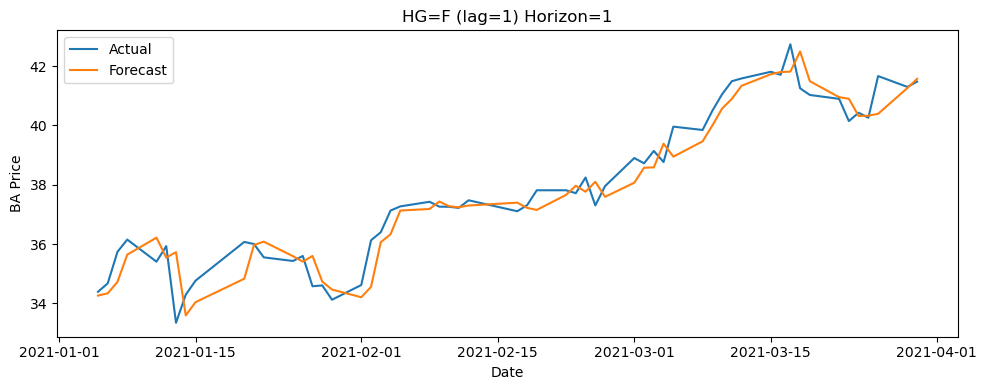

HG=F (lag=1) - Horizon 3 | RMSE: 1.17, MAE: 0.96, MAPE: 2.54%


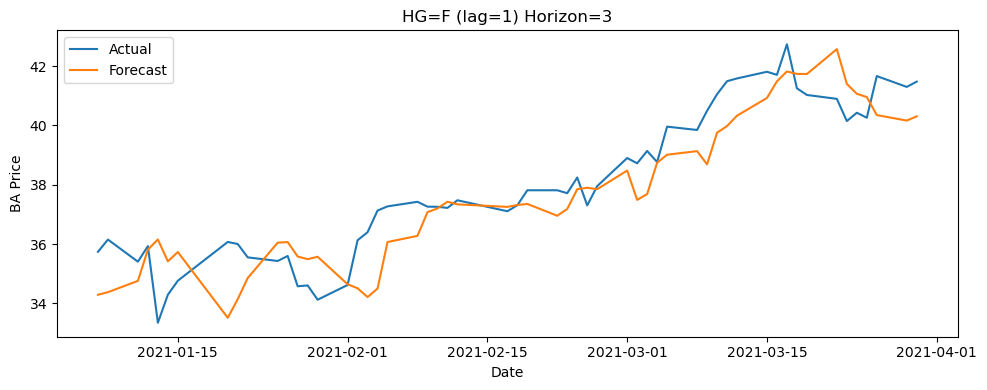

HG=F (lag=1) - Horizon 7 | RMSE: 1.55, MAE: 1.23, MAPE: 3.16%


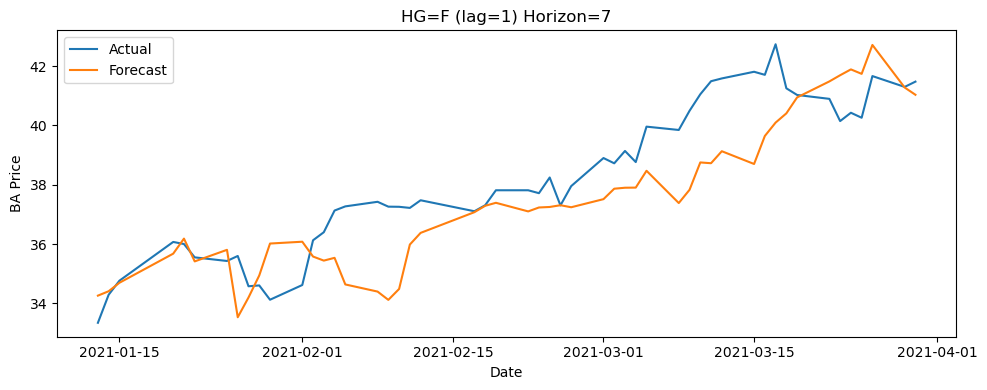


 Metrics for HG=F saved to: exo_eval_best_dell.csv


In [49]:
# with "best" lags
for var, lag in exog_lags_best.items():
    evaluate_single_exog_var_with_metrics(
        target_df=df,                   # original target (non-differenced)
        exog_df=df_diff,                # stationary/differenced exogenous inputs
        var_name=var,
        lag=lag,
        model_order=(1, 1, 1),
        forecast_horizons=[1, 3, 7],
        train_end_date="2020-12-31",
        test_start_date="2021-01-01",
        output_csv_path="exo_eval_best_dell.csv",
        seasonal_order=None,
        append_csv=True,
        plot=True
    )

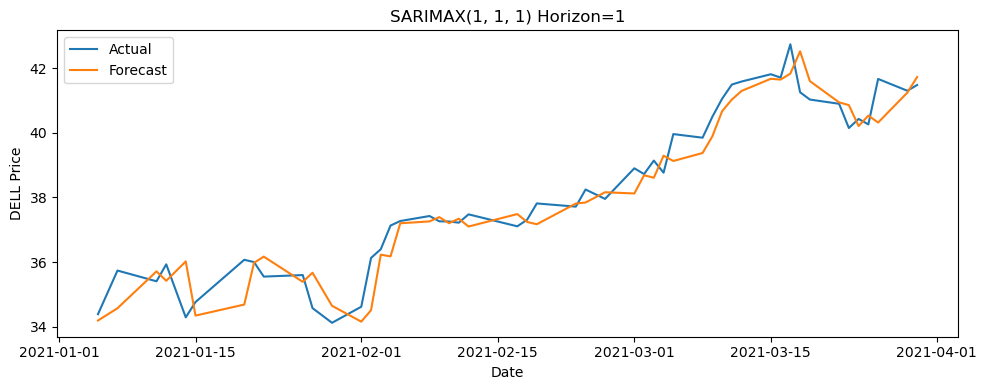

Horizon 1: RMSE=0.66, MAE=0.50, MAPE=1.32


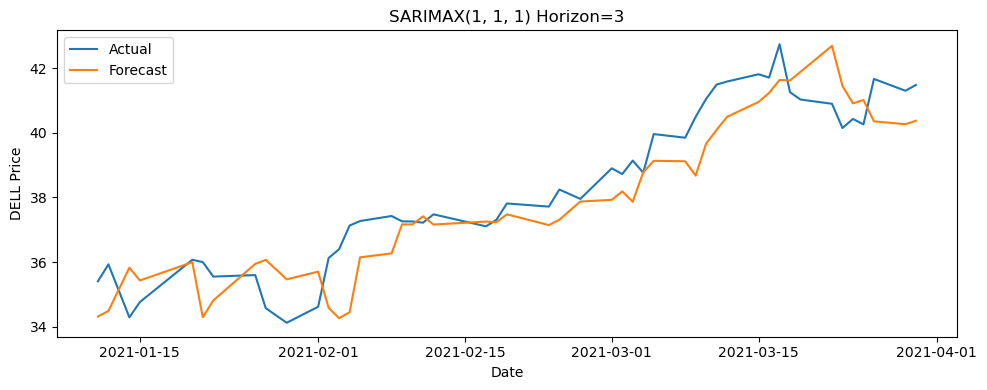

Horizon 3: RMSE=1.10, MAE=0.93, MAPE=2.43


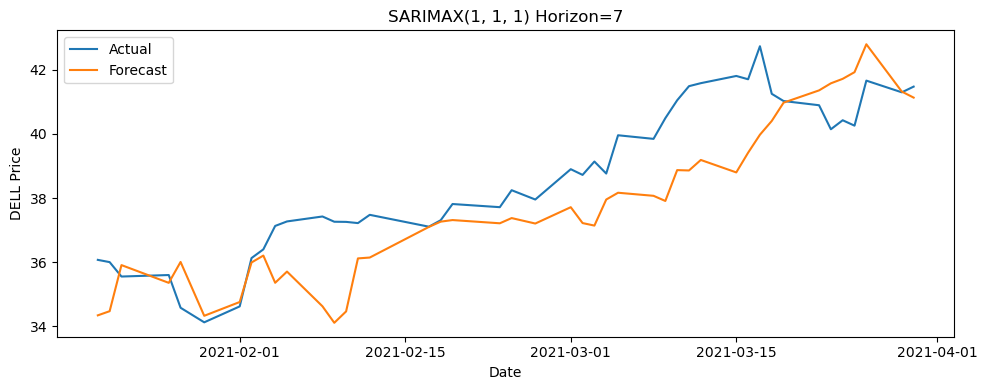

Horizon 7: RMSE=1.60, MAE=1.30, MAPE=3.33

 Metrics saved to: grouped_sarimax_sensible_dell.csv


,model,horizon,rmse,mae,mape,exog_vars
0,"SARIMAX(1, 1, 1)",1,0.657903,0.496859,1.315160,"DX-Y.NYB_lag5,CL=F_lag8,HG=F_lag1"
1,"SARIMAX(1, 1, 1)",3,1.101408,0.926284,2.426508,"DX-Y.NYB_lag5,CL=F_lag8,HG=F_lag1"
2,"SARIMAX(1, 1, 1)",7,1.603443,1.302357,3.330032,"DX-Y.NYB_lag5,CL=F_lag8,HG=F_lag1"


In [50]:
# grouped exo variables non-seasonal (sensible lags)
rolling_forecast_sarimax_with_metrics(
    target_df=df['DELL'],           # original data, with raw DELL values
    exog_df=df_diff,        # differenced exogenous variables.. if stationary, not diff-ed 
    exog_lags=exog_lags_sensible,
    model_order=(1, 1, 1),
    forecast_horizons=[1, 3, 7],
    train_end_date="2020-12-31",
    test_start_date="2021-01-01",
    seasonal_order=None,
    output_csv_path="grouped_sarimax_sensible_dell.csv",
    plot=True,
    append_csv=True
)

### Evaluating individual exo variables SARIMAX

DX-Y.NYB (lag=5) - Horizon 1 | RMSE: 0.69, MAE: 0.50, MAPE: 1.34%


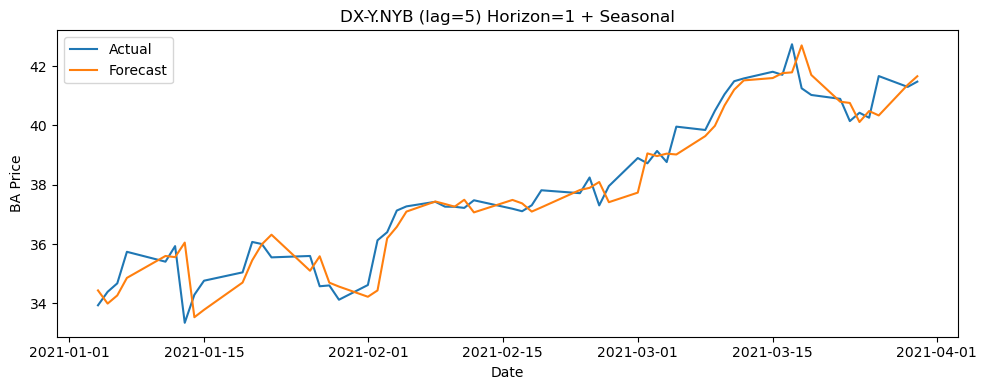

DX-Y.NYB (lag=5) - Horizon 3 | RMSE: 1.17, MAE: 0.96, MAPE: 2.55%


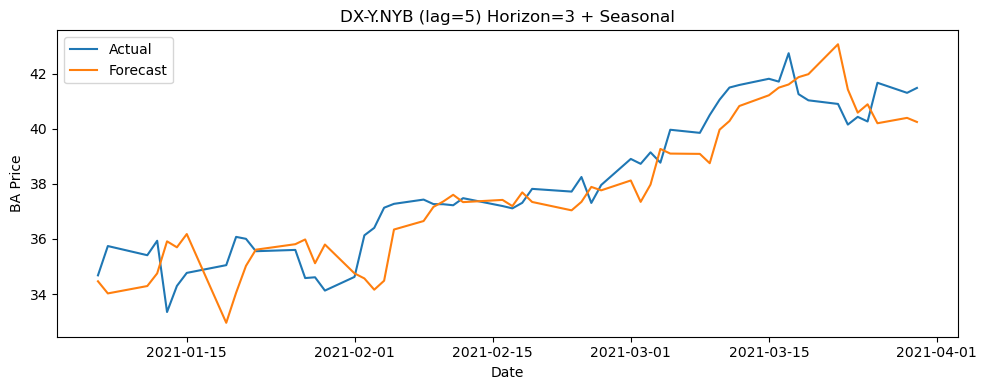

DX-Y.NYB (lag=5) - Horizon 7 | RMSE: 1.55, MAE: 1.24, MAPE: 3.22%


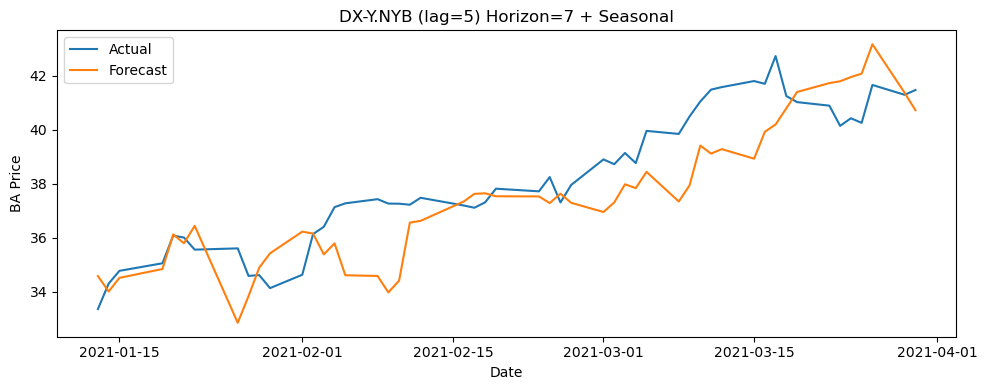


 Metrics for DX-Y.NYB saved to: exo_eval_sensible_seasonal_dell.csv
CL=F (lag=8) - Horizon 1 | RMSE: 0.62, MAE: 0.47, MAPE: 1.25%


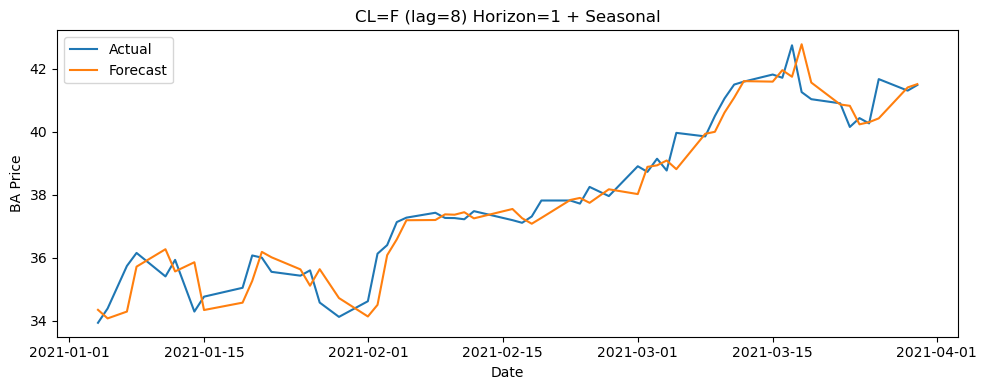

CL=F (lag=8) - Horizon 3 | RMSE: 1.10, MAE: 0.91, MAPE: 2.39%


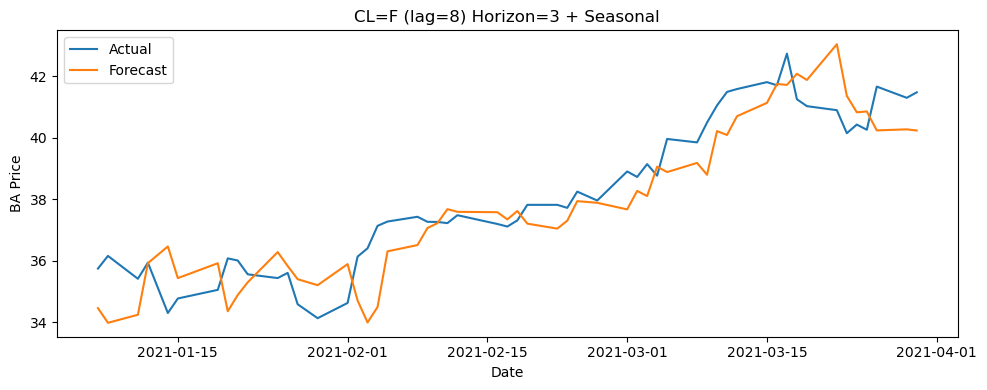

CL=F (lag=8) - Horizon 7 | RMSE: 1.50, MAE: 1.21, MAPE: 3.11%


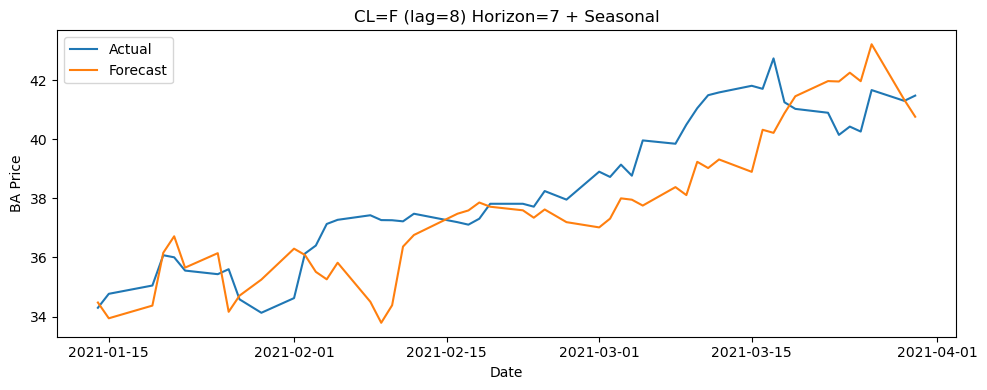


 Metrics for CL=F saved to: exo_eval_sensible_seasonal_dell.csv
HG=F (lag=1) - Horizon 1 | RMSE: 0.67, MAE: 0.49, MAPE: 1.32%


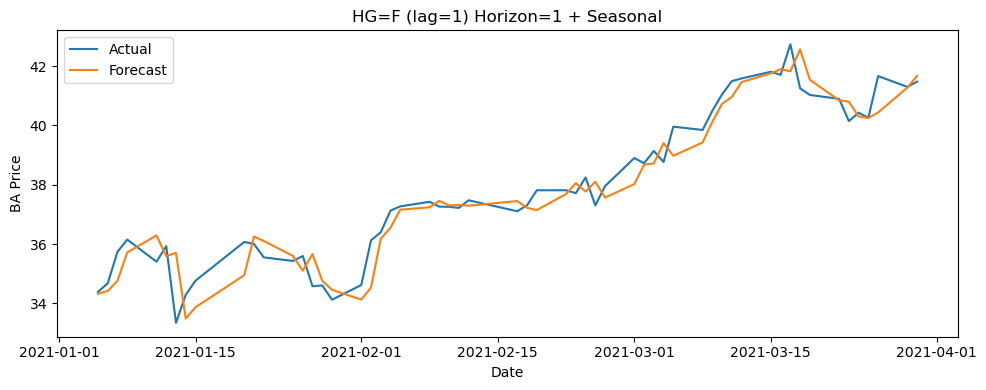

HG=F (lag=1) - Horizon 3 | RMSE: 1.19, MAE: 0.94, MAPE: 2.51%


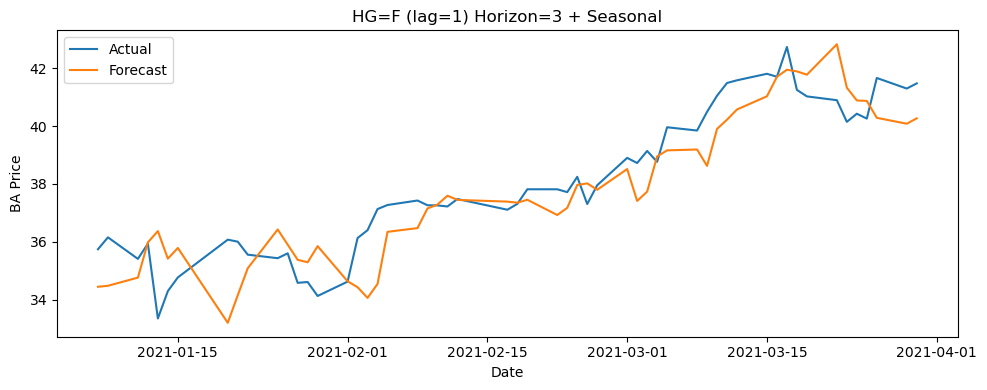

HG=F (lag=1) - Horizon 7 | RMSE: 1.58, MAE: 1.25, MAPE: 3.24%


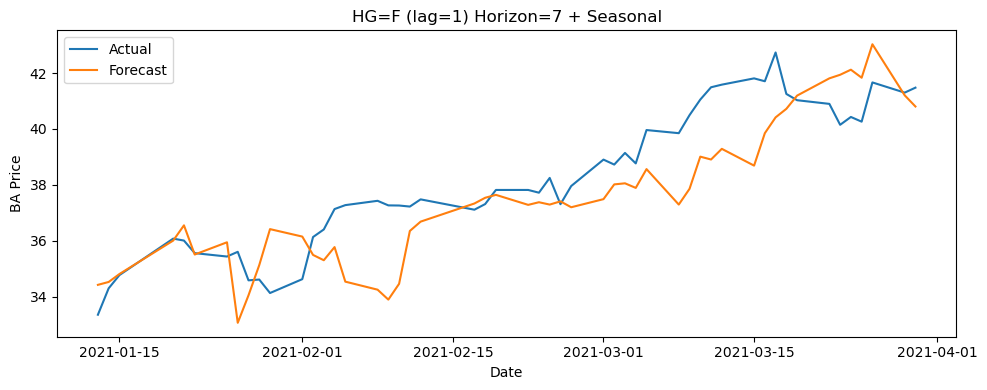


 Metrics for HG=F saved to: exo_eval_sensible_seasonal_dell.csv


In [52]:
#sesonal version
for var, lag in exog_lags_sensible.items():
    evaluate_single_exog_var_with_metrics(
        target_df=df,                   # original (non-differenced) DELL series
        exog_df=df_diff,                # differenced/stationary exogenous inputs
        var_name=var,
        lag=lag,
        model_order=(0, 1, 2),
        forecast_horizons=[1, 3, 7],
        train_end_date="2020-12-31",
        test_start_date="2021-01-01",
        output_csv_path="exo_eval_sensible_seasonal_dell.csv",
        seasonal_order=(1, 0, 0, 7),
        append_csv=True,
        plot=True
    )

DX-Y.NYB (lag=5) - Horizon 1 | RMSE: 0.69, MAE: 0.50, MAPE: 1.34%


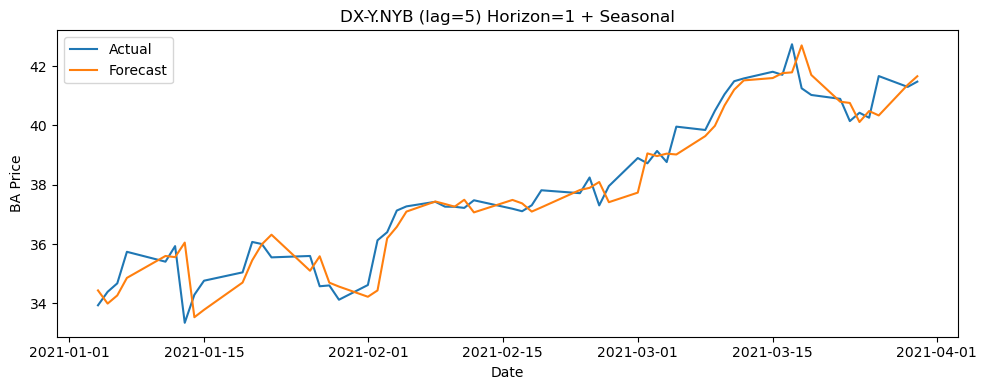

DX-Y.NYB (lag=5) - Horizon 3 | RMSE: 1.17, MAE: 0.96, MAPE: 2.55%


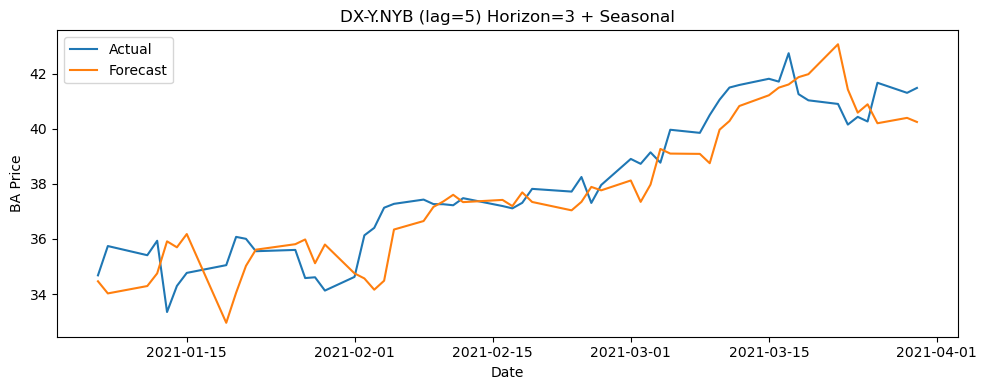

DX-Y.NYB (lag=5) - Horizon 7 | RMSE: 1.55, MAE: 1.24, MAPE: 3.22%


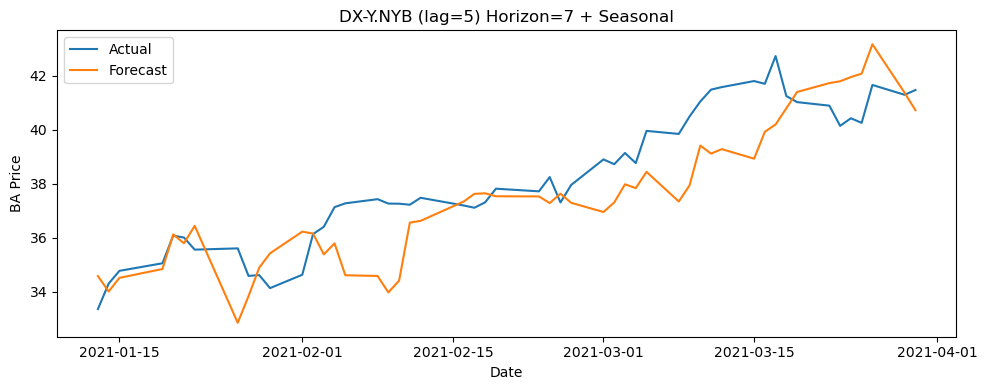


 Metrics for DX-Y.NYB saved to: exo_eval_best_seasonal_dell.csv
CL=F (lag=1) - Horizon 1 | RMSE: 0.70, MAE: 0.51, MAPE: 1.36%


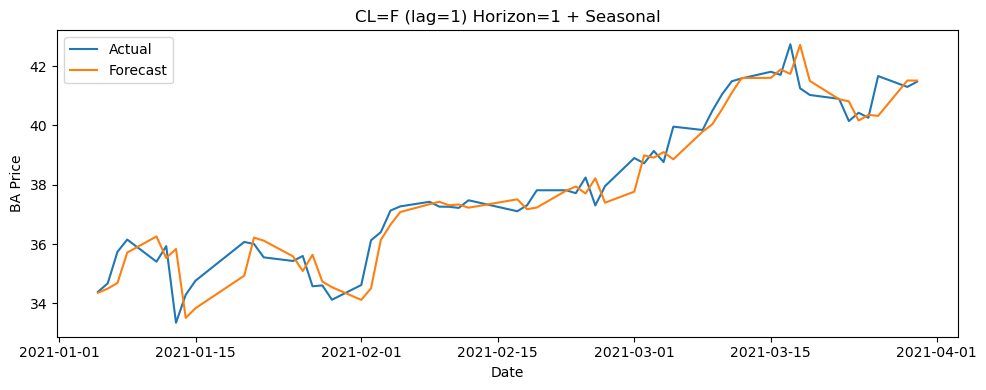

CL=F (lag=1) - Horizon 3 | RMSE: 1.19, MAE: 0.95, MAPE: 2.53%


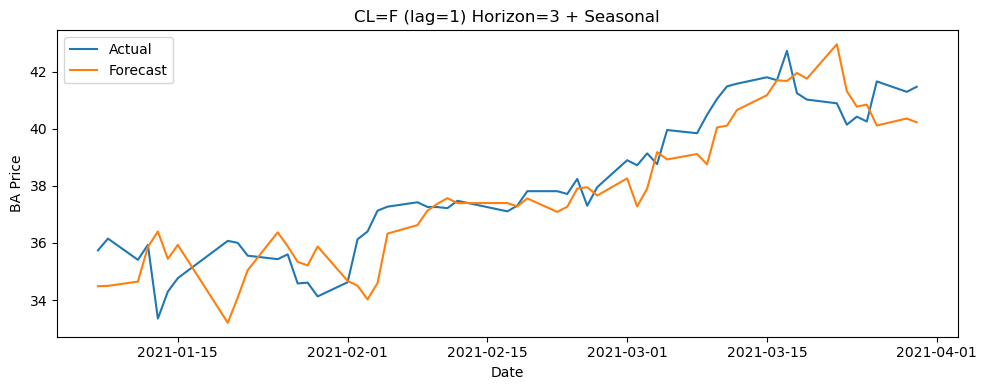

CL=F (lag=1) - Horizon 7 | RMSE: 1.57, MAE: 1.25, MAPE: 3.24%


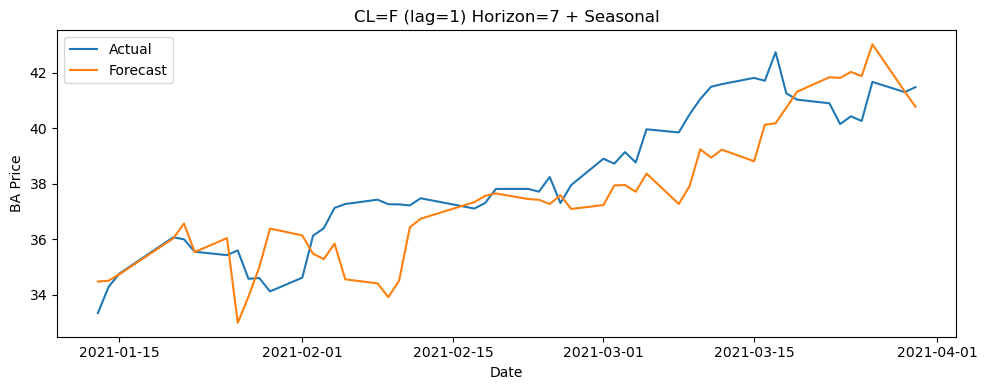


 Metrics for CL=F saved to: exo_eval_best_seasonal_dell.csv
HG=F (lag=1) - Horizon 1 | RMSE: 0.67, MAE: 0.49, MAPE: 1.32%


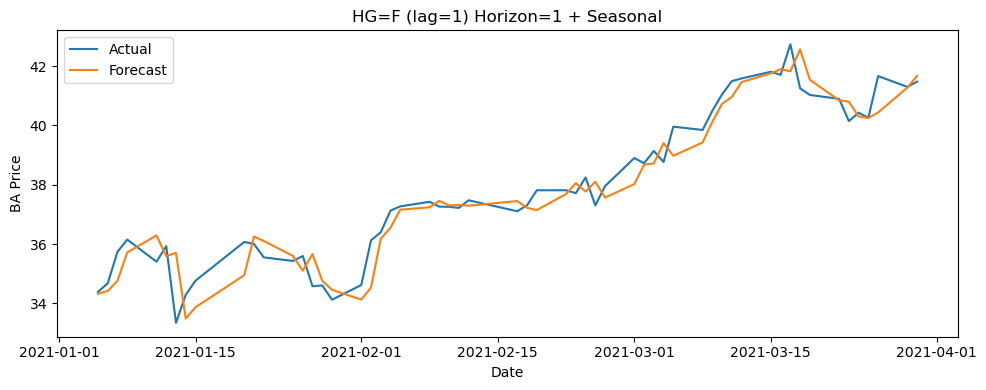

HG=F (lag=1) - Horizon 3 | RMSE: 1.19, MAE: 0.94, MAPE: 2.51%


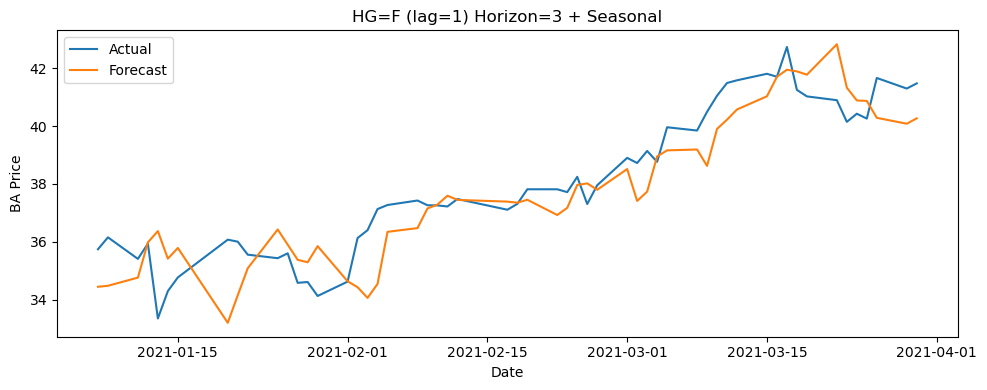

HG=F (lag=1) - Horizon 7 | RMSE: 1.58, MAE: 1.25, MAPE: 3.24%


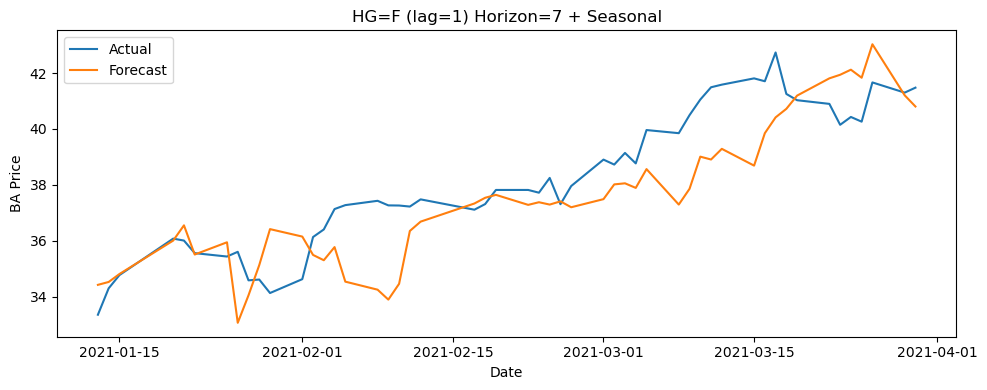


 Metrics for HG=F saved to: exo_eval_best_seasonal_dell.csv


In [53]:
for var, lag in exog_lags_best.items():
    evaluate_single_exog_var_with_metrics(
        target_df=df,                   # original, non-differenced BA prices
        exog_df=df_diff,                # differenced/stationary exogenous input
        var_name=var,
        lag=lag,
        model_order=(0, 1, 2),
        forecast_horizons=[1, 3, 7],
        train_end_date="2020-12-31",
        test_start_date="2021-01-01",
        output_csv_path="exo_eval_best_seasonal_dell.csv",
        seasonal_order=(1, 0, 0, 7),
        append_csv=True,
        plot=True
    )

### Building LSTM baseline model for BA

Very simple architechture first...
- no dropout, 1 layer
- relu, adam, mse loss 

In [56]:
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    mask = y_true != 0
    return np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100
#initial simple basline model
def create_lstm_baseline_model(input_shape):
    model = Sequential()
    model.add(LSTM(50, activation='relu', input_shape=input_shape))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    return model

def evaluate_lstm_baseline(
    df,
    forecast_horizons=[1, 3, 7],
    train_end="2020-12-31",
    test_start="2021-01-01",
    window_size=30,
    epochs=20,
    output_csv_path="lstm_baseline_metrics_dell.csv",
    plot=True
):
    df = df.copy()
    df.index = pd.to_datetime(df.index)
    df = df.asfreq('B')
    series = df['DELL'].dropna().to_frame()

    # Scale data
    scaler = MinMaxScaler()
    series_scaled = scaler.fit_transform(series)

    # Split into train/test
    split_train = series.index <= train_end
    split_test = series.index >= test_start

    all_metrics = []

    for h in forecast_horizons:
        preds, actuals, dates = [], [], []

        for i in range(window_size, len(series_scaled) - h):
            if not split_test[i + h]:
                continue

            X = series_scaled[i - window_size:i].reshape(1, window_size, 1)
            y = series_scaled[i + h][0]

            # Rebuild model each time to prevent data leakage
            X_train_full = []
            y_train_full = []
            for j in range(window_size, i):
                X_train_full.append(series_scaled[j - window_size:j])
                y_train_full.append(series_scaled[j][0])
            X_train_full = np.array(X_train_full)
            y_train_full = np.array(y_train_full)

            model = create_lstm_baseline_model((window_size, 1))
            model.fit(X_train_full, y_train_full, epochs=epochs, verbose=0)

            pred_scaled = model.predict(X)[0][0]
            pred = scaler.inverse_transform([[pred_scaled]])[0][0]
            actual = series.iloc[i + h][0]

            preds.append(pred)
            actuals.append(actual)
            dates.append(series.index[i + h])

        if preds:
            rmse = np.sqrt(mean_squared_error(actuals, preds))
            mae = mean_absolute_error(actuals, preds)
            mape = mean_absolute_percentage_error(actuals, preds)
            print(f"Horizon {h}: RMSE={rmse:.2f}, MAE={mae:.2f}, MAPE={mape:.2f}")
            
            all_metrics.append({
                "model": "LSTM (baseline)",
                "horizon": h,
                "rmse": rmse,
                "mae": mae,
                "mape": mape
            })

            if plot:
                plt.figure(figsize=(10, 4))
                plt.plot(dates, actuals, label="Actual")
                plt.plot(dates, preds, label="Forecast")
                plt.title(f"LSTM Baseline Forecast - {h}-Day Horizon")
                plt.xlabel("Date")
                plt.ylabel("DELL Price")
                plt.legend()
                plt.tight_layout()
                plt.show()

    df_metrics = pd.DataFrame(all_metrics)
    df_metrics.to_csv(output_csv_path, index=False)
    print(f" Saved baseline LSTM metrics to {output_csv_path}")
    return df_metrics

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

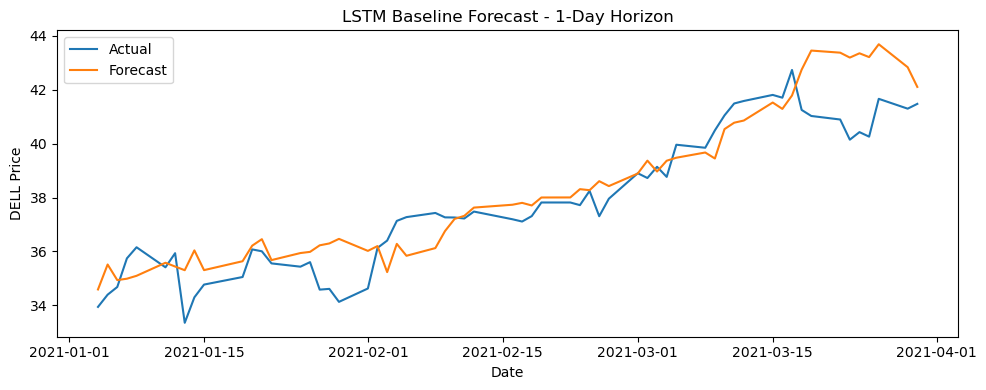

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

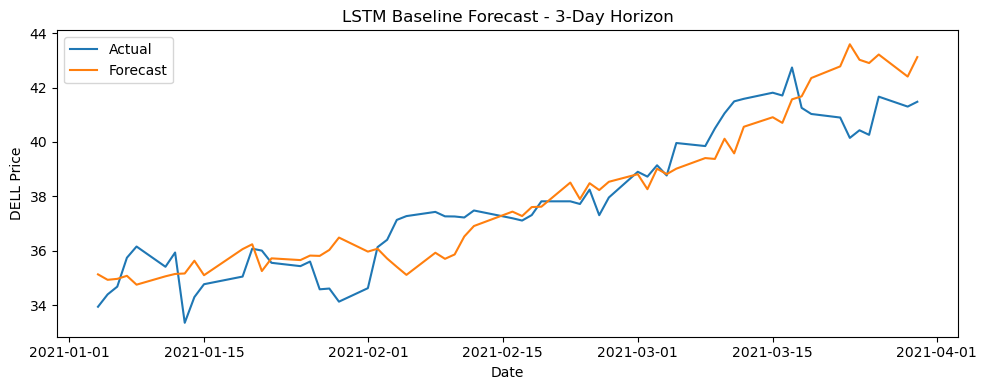

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

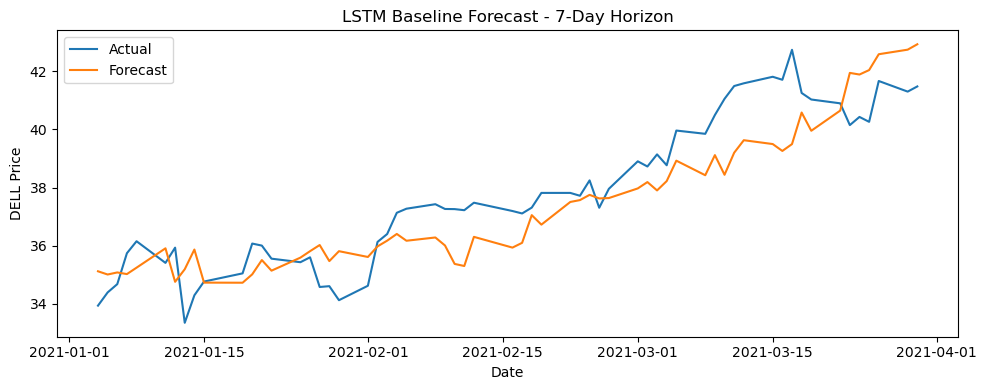

 Saved baseline LSTM metrics to lstm_baseline_metrics_dell.csv


In [57]:
lstm_baseline_results = evaluate_lstm_baseline(
    df=df,
    forecast_horizons=[1, 3, 7],
    train_end="2020-12-31",
    test_start="2021-01-01",
    window_size=30,
    epochs=20,
    output_csv_path="lstm_baseline_metrics_dell.csv",
    plot=True
)


Function to evealuate more complex models and model tweaks

In [59]:
def evaluate_lstm_model(
    df,
    model_fn,
    forecast_horizons=[1, 3, 7],
    train_end="2020-12-31",
    test_start="2021-01-01",
    window_size=30,
    epochs=20,
    output_csv_path="lstm_metrics_dell.csv",
    plot=True,
    callbacks=None
):
    df = df.copy()
    df.index = pd.to_datetime(df.index)
    df = df.asfreq('B')
    series = df['DELL'].dropna().to_frame()

    scaler = MinMaxScaler()
    series_scaled = scaler.fit_transform(series)

    split_train = series.index <= train_end
    split_test = series.index >= test_start

    all_metrics = []

    for h in forecast_horizons:
        preds, actuals, dates = [], [], []

        for i in range(window_size, len(series_scaled) - h):
            if not split_test[i + h]:
                continue

            X = series_scaled[i - window_size:i].reshape(1, window_size, 1)
            y = series_scaled[i + h][0]

            X_train_full, y_train_full = [], []
            for j in range(window_size, i):
                X_train_full.append(series_scaled[j - window_size:j])
                y_train_full.append(series_scaled[j][0])
            X_train_full = np.array(X_train_full)
            y_train_full = np.array(y_train_full)

            model = model_fn((window_size, 1))
            model.fit(X_train_full, y_train_full, epochs=epochs, verbose=0, callbacks=callbacks)

            pred_scaled = model.predict(X)[0][0]
            pred = scaler.inverse_transform([[pred_scaled]])[0][0]
            actual = series.iloc[i + h][0]

            preds.append(pred)
            actuals.append(actual)
            dates.append(series.index[i + h])

        if preds:
            rmse = np.sqrt(mean_squared_error(actuals, preds))
            mae = mean_absolute_error(actuals, preds)
            mape = mean_absolute_percentage_error(actuals, preds)
            print(f"Horizon {h}: RMSE={rmse:.2f}, MAE={mae:.2f}, MAPE={mape:.2f}")

            all_metrics.append({
                "model": model_fn.__name__,
                "horizon": h,
                "rmse": rmse,
                "mae": mae,
                "mape": mape
            })

            if plot:
                plt.figure(figsize=(10, 4))
                plt.plot(dates, actuals, label="Actual")
                plt.plot(dates, preds, label="Forecast")
                plt.title(f"{model_fn.__name__} - {h}-Day Horizon")
                plt.xlabel("Date")
                plt.ylabel("DELL Price")
                plt.legend()
                plt.tight_layout()
                plt.show()

    df_metrics = pd.DataFrame(all_metrics)
    df_metrics.to_csv(output_csv_path, index=False)
    print(f"\n Saved metrics to {output_csv_path}")
    return df_metrics

Slightly more complex model for baseline
- using tanh instead of relu
- adding in dropout
- adding in early stopping

In [61]:
def create_lstm_tanh_dropout_model(input_shape):
    model = Sequential()
    model.add(LSTM(64, activation='tanh', input_shape=input_shape))
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    return model

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

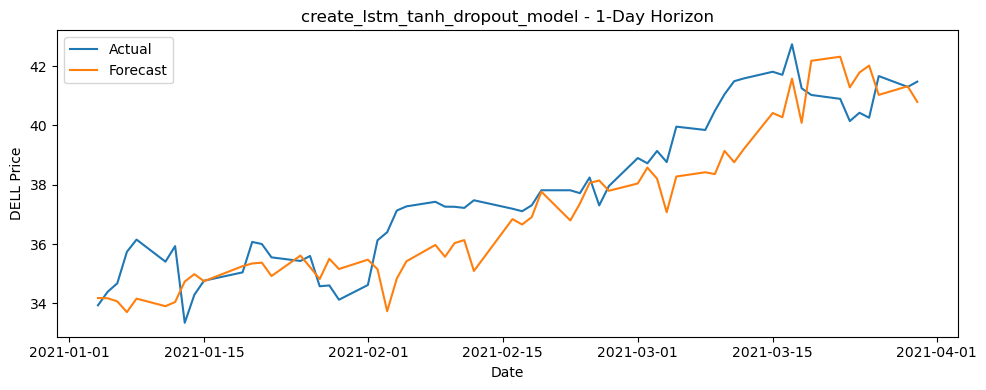

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

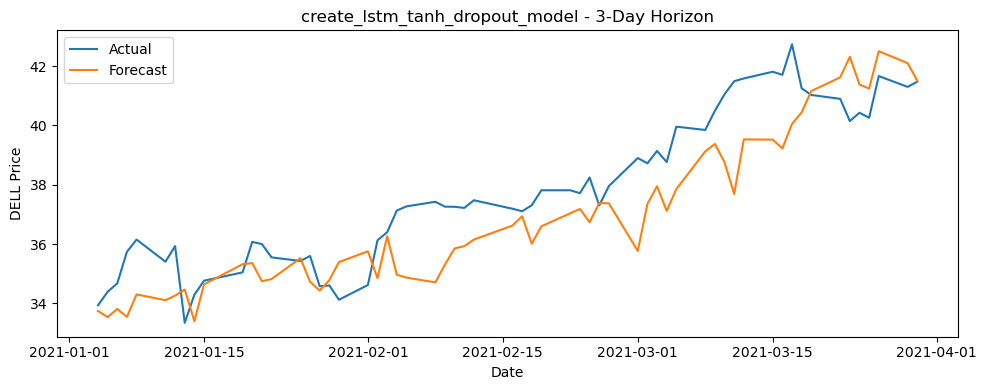

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

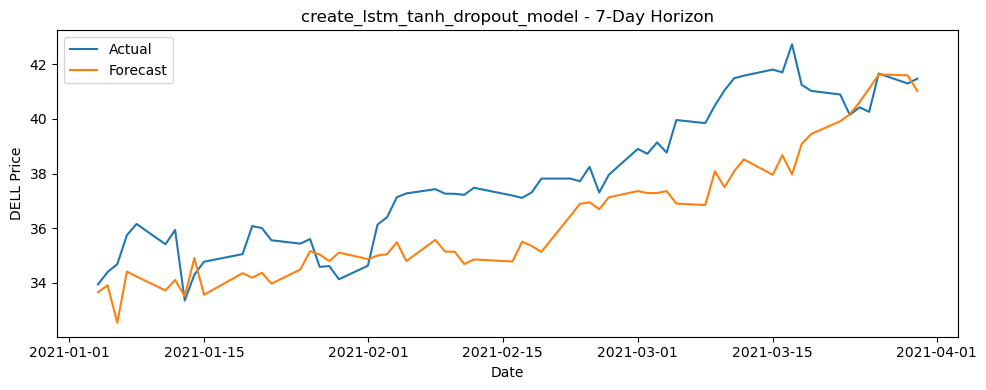


 Saved metrics to lstm_tanh_dropout_dell.csv


,model,horizon,rmse,mae,mape
0,create_lstm_tanh_dropout_model,1,1.298722,1.082571,2.840085
1,create_lstm_tanh_dropout_model,3,1.483450,1.223797,3.199798
2,create_lstm_tanh_dropout_model,7,1.899149,1.586678,4.135692


In [62]:
#call this model with early stopping
early_stop = EarlyStopping(monitor='loss', patience=3, restore_best_weights=True)

evaluate_lstm_model(
    df=df,
    model_fn=create_lstm_tanh_dropout_model,
    forecast_horizons=[1, 3, 7],
    output_csv_path="lstm_tanh_dropout_dell.csv",
    callbacks=[early_stop]
)

This model proving worse that prvious despite dropout etc. Going to try same model architecture again...but just swap back in relu for tanh

In [64]:
def create_lstm_relu_dropout_model(input_shape):
    model = Sequential()
    model.add(LSTM(64, activation='relu', input_shape=input_shape))
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    return model

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

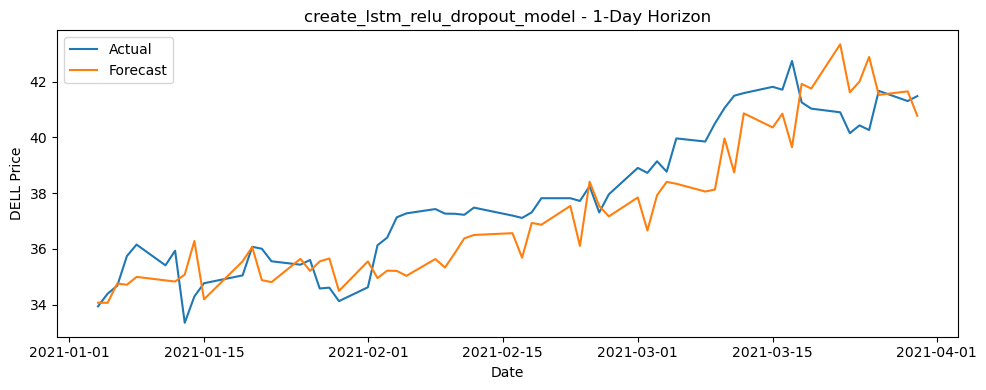

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

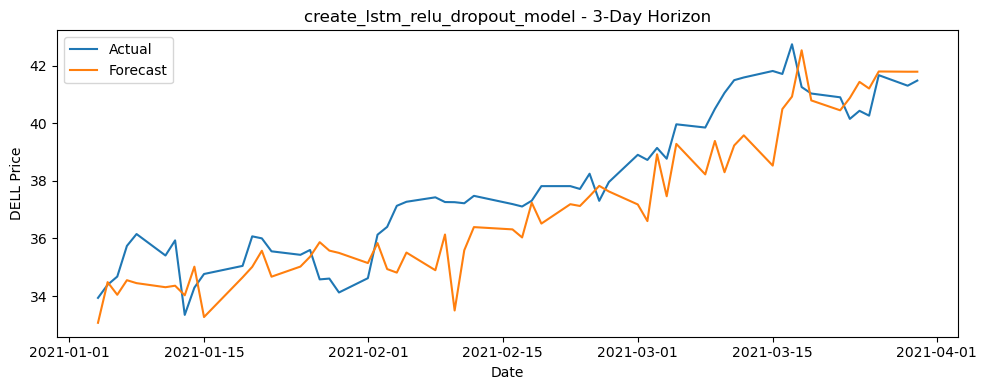

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

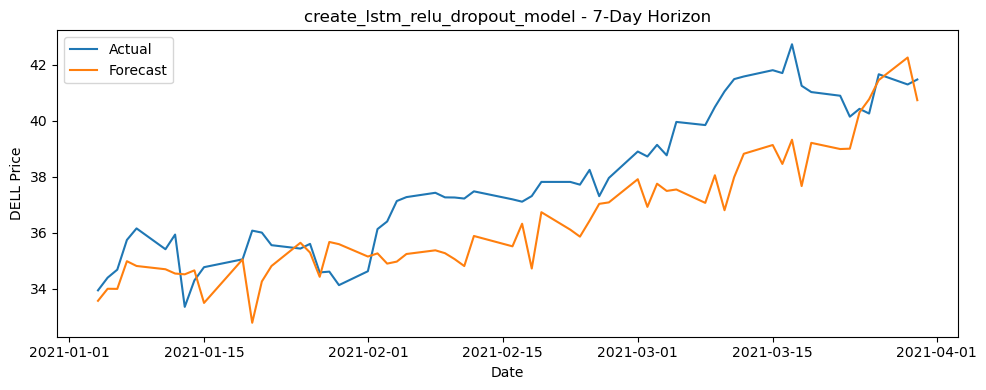


 Saved metrics to lstm_relu_dropout_dell.csv


,model,horizon,rmse,mae,mape
0,create_lstm_relu_dropout_model,1,1.321747,1.100937,2.883466
1,create_lstm_relu_dropout_model,3,1.364695,1.123720,2.959000
2,create_lstm_relu_dropout_model,7,1.823408,1.523818,3.959409


In [65]:
#call this model with early stopping
early_stop = EarlyStopping(monitor='loss', patience=3, restore_best_weights=True)

evaluate_lstm_model(
    df=df,
    model_fn=create_lstm_relu_dropout_model,
    forecast_horizons=[1, 3, 7],
    output_csv_path="lstm_relu_dropout_dell.csv",
    callbacks=[early_stop]
)

Relu appears to be the better activation function choice... Removing dropout and just swapping out relu for tanh in baseline to compare and test this theorey
- trying without early stopping, then with (commenting out)

Without early stopping metrics:
- Horizon 1: RMSE=1.10, MAE=0.92, MAPE=2.43
- Horizon 3: RMSE=1.18, MAE=0.99, MAPE=2.61
- Horizon 7: RMSE=1.47, MAE=1.24, MAPE=3.21

In [67]:
def create_lstm_baseline_model_tanh(input_shape):
    model = Sequential()
    model.add(LSTM(50, activation='tanh', input_shape=input_shape))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    return model

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

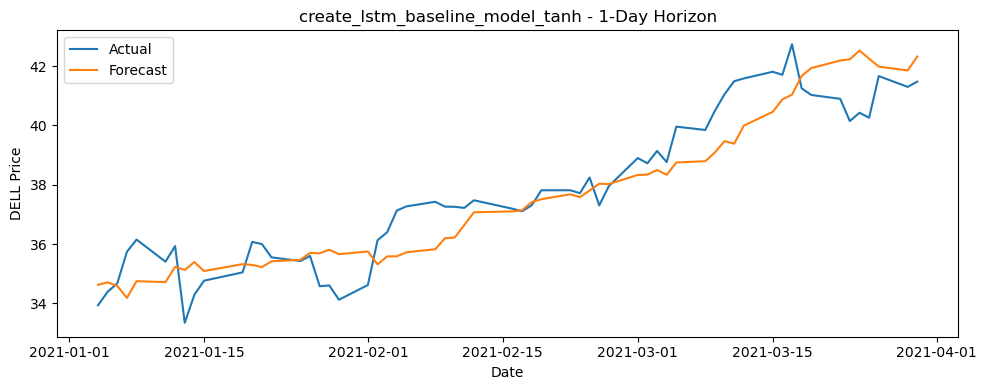

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

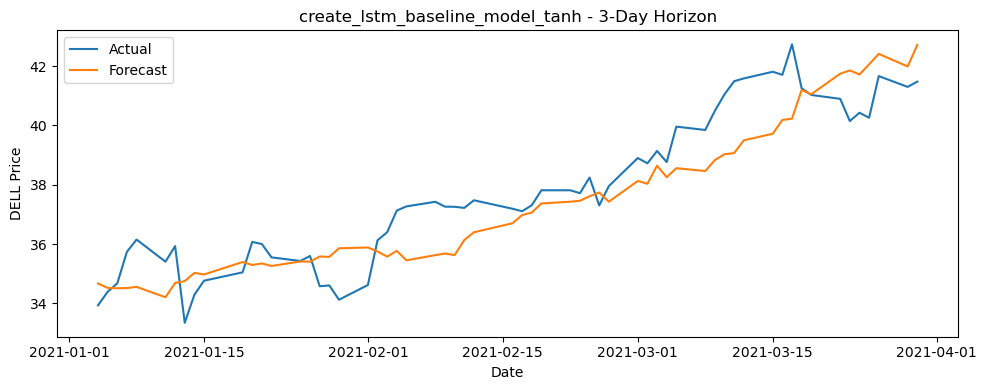

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

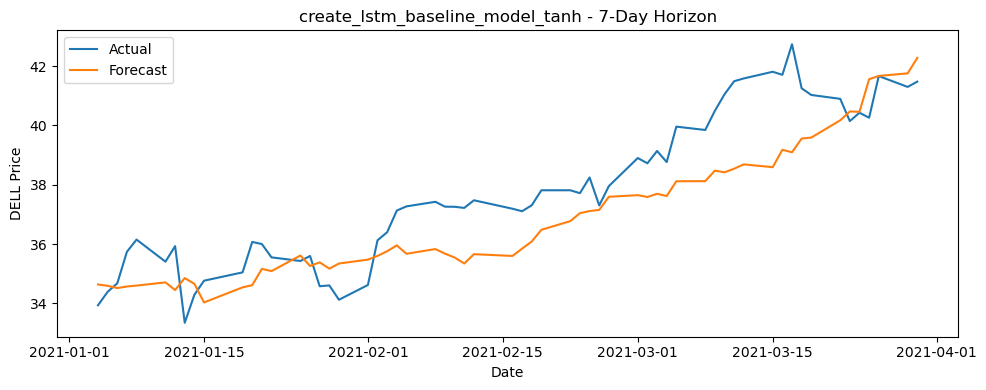


 Saved metrics to lstm_tanh_dell.csv


,model,horizon,rmse,mae,mape
0,create_lstm_baseline_model_tanh,1,1.058521,0.875280,2.300111
1,create_lstm_baseline_model_tanh,3,1.174930,0.982124,2.570379
2,create_lstm_baseline_model_tanh,7,1.443835,1.204288,3.133051


In [68]:
#call this model with early stopping
early_stop = EarlyStopping(monitor='loss', patience=5, restore_best_weights=True)
#early stopping had better metrics for 7 day forecast but worse for others
evaluate_lstm_model(
    df=df,
    model_fn=create_lstm_baseline_model_tanh,
    forecast_horizons=[1, 3, 7],
    output_csv_path="lstm_tanh_dell.csv",
    callbacks=[early_stop]
)

Trying a deeper model - earlystopping seems to be helping

In [70]:
def create_lstm_deep_model_tanh(input_shape):
    model = Sequential()
    model.add(LSTM(64, activation='tanh', return_sequences=True, input_shape=input_shape))
    model.add(Dropout(0.2))
    model.add(LSTM(32, activation='tanh'))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    return model

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

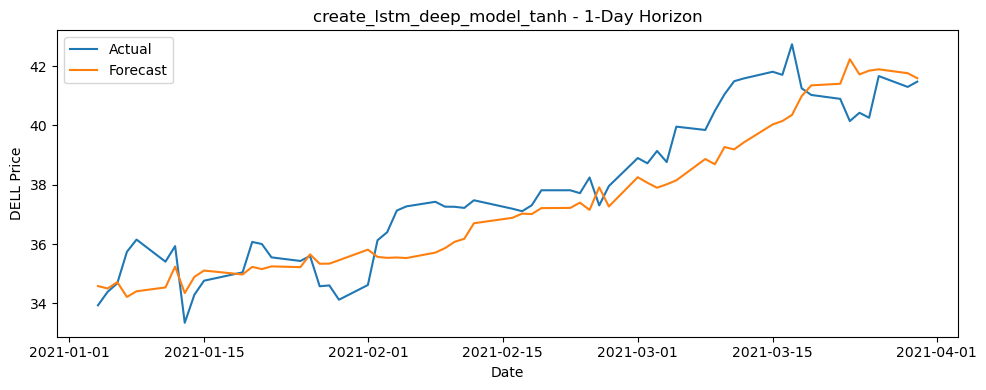

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 546ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

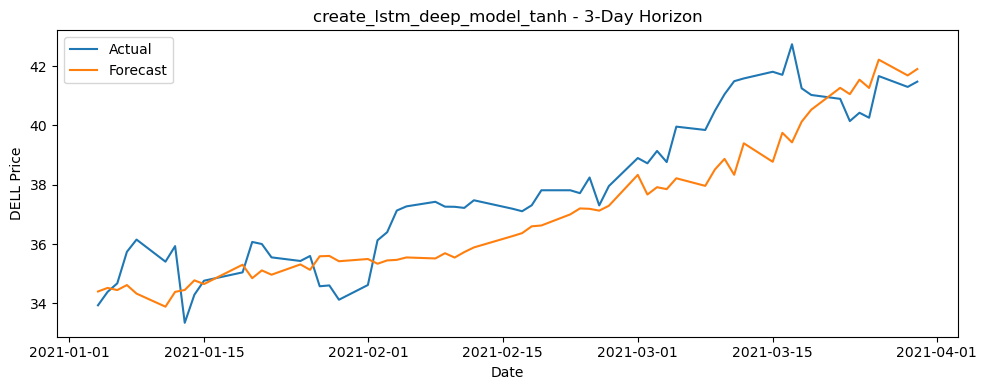

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

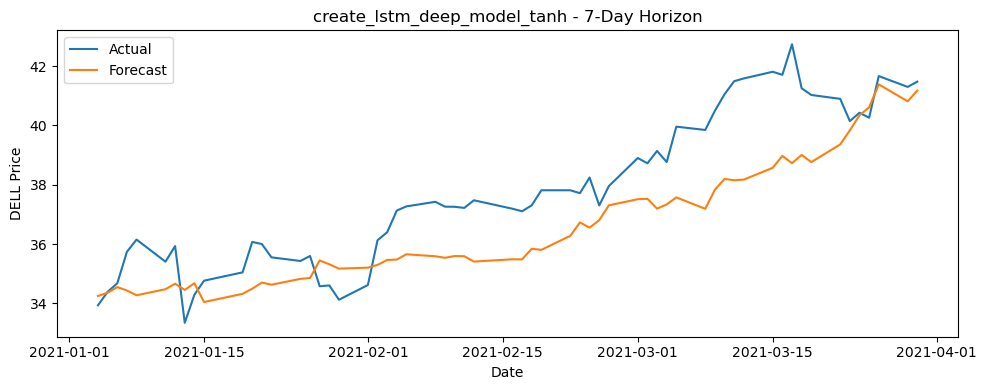


 Saved metrics to lstm_deep_tanh_dell.csv


,model,horizon,rmse,mae,mape
0,create_lstm_deep_model_tanh,1,1.125437,0.934129,2.441571
1,create_lstm_deep_model_tanh,3,1.343284,1.132759,2.955949
2,create_lstm_deep_model_tanh,7,1.670312,1.405583,3.649958


In [71]:
early_stop = EarlyStopping(monitor='loss', patience=5, restore_best_weights=True)

evaluate_lstm_model(
    df=df,
    model_fn=create_lstm_deep_model_tanh,  
    forecast_horizons=[1, 3, 7],
    output_csv_path="lstm_deep_tanh_dell.csv",
    callbacks=[early_stop]
)

This deeper model in underperfoming compared to the simpler ones i've worked with so far...
I'm going to reduce complexity slightly to see if that helps.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 588ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

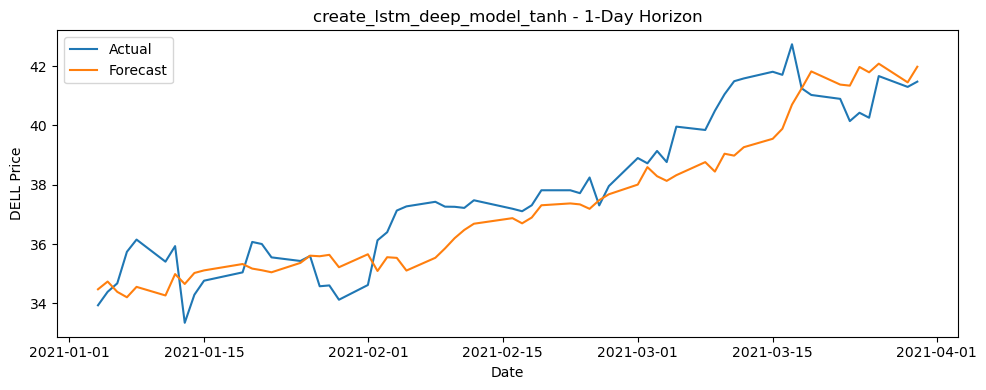

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

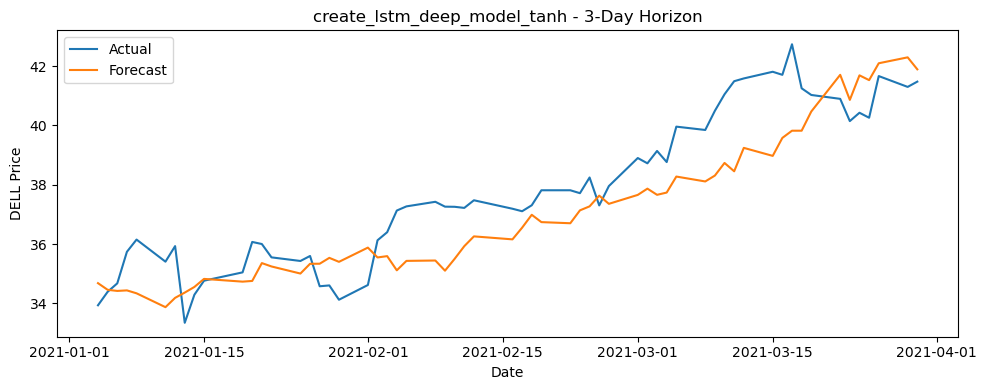

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 538ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

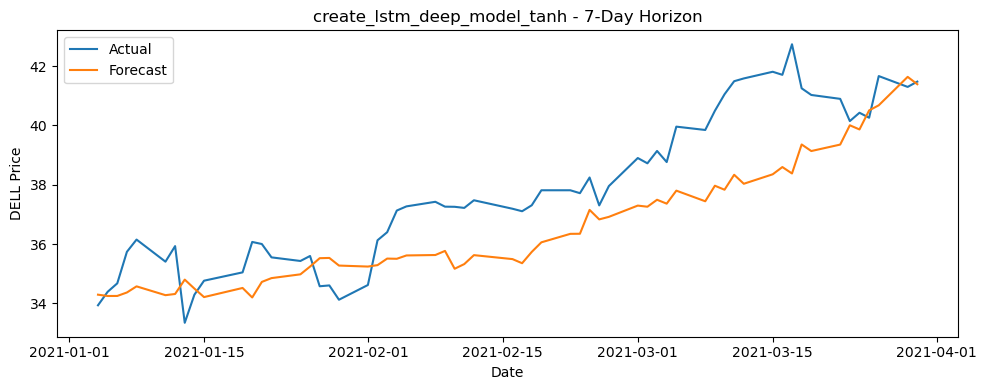


 Saved metrics to lstm_deep_tanh_dell_smaller.csv


,model,horizon,rmse,mae,mape
0,create_lstm_deep_model_tanh,1,1.161876,0.965287,2.528432
1,create_lstm_deep_model_tanh,3,1.375058,1.169074,3.046807
2,create_lstm_deep_model_tanh,7,1.698451,1.428507,3.710736


In [73]:
early_stop = EarlyStopping(monitor='loss', patience=5, restore_best_weights=True)

evaluate_lstm_model(
    df=df,
    model_fn=create_lstm_deep_model_tanh,  
    forecast_horizons=[1, 3, 7],
    output_csv_path="lstm_deep_tanh_dell_smaller.csv",
    callbacks=[early_stop]
)

In [74]:
def create_lstm_deep_model_small_tanh(input_shape):
    model = Sequential()
    model.add(LSTM(32, activation='tanh', return_sequences=True, input_shape=input_shape))
    model.add(Dropout(0.1))
    model.add(LSTM(16, activation='tanh'))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    return model

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

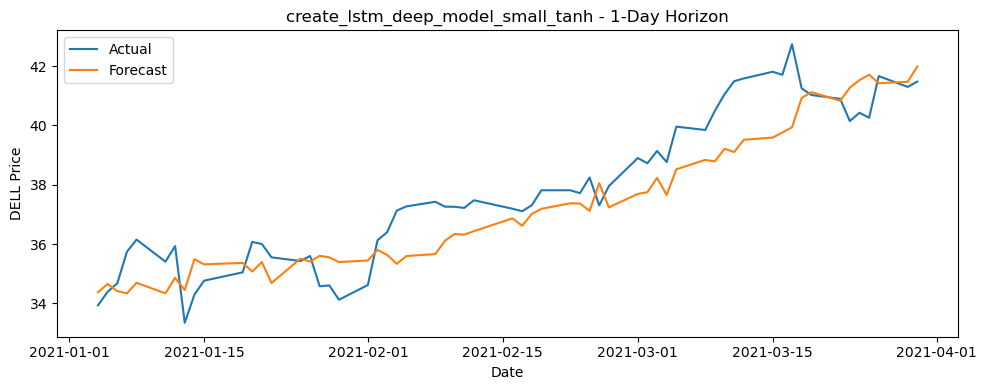

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

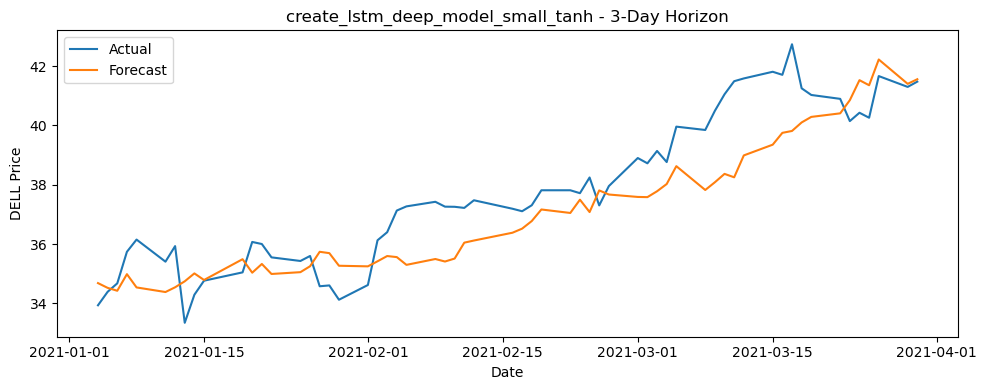

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

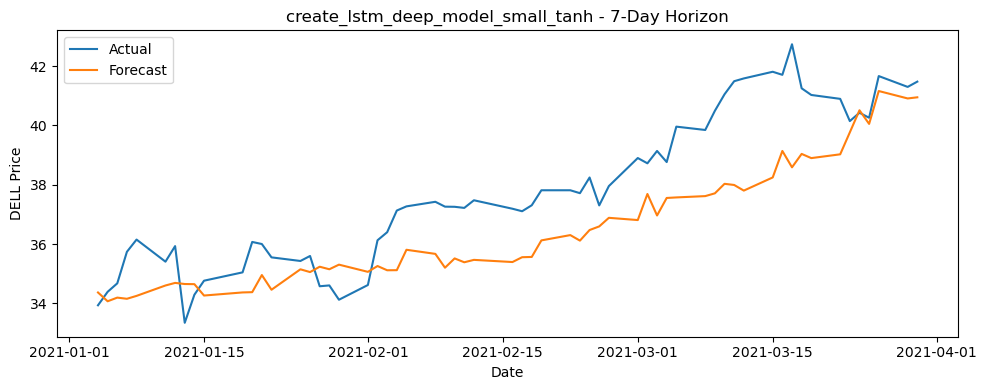


 Saved metrics to lstm_deep_model_small_tanh_dell.csv


,model,horizon,rmse,mae,mape
0,create_lstm_deep_model_small_tanh,1,1.146626,0.967626,2.536639
1,create_lstm_deep_model_small_tanh,3,1.328773,1.105095,2.882806
2,create_lstm_deep_model_small_tanh,7,1.744293,1.471710,3.821093


In [75]:
early_stop = EarlyStopping(monitor='loss', patience=7, restore_best_weights=True)

evaluate_lstm_model(
    df=df,
    model_fn=create_lstm_deep_model_small_tanh,  
    forecast_horizons=[1, 3, 7],
    output_csv_path="lstm_deep_model_small_tanh_dell.csv",
    callbacks=[early_stop]
)

trying to use keras tuner to speed up process...

In [80]:
#defining tunable model
class LSTMHyperModel(HyperModel):
    def __init__(self, input_shape):
        self.input_shape = input_shape

    def build(self, hp):
        model = Sequential()
        model.add(
            LSTM(
                units=hp.Int("units_1", min_value=16, max_value=128, step=16),
                activation=hp.Choice("activation_1", ["relu", "tanh"]),
                return_sequences=hp.Boolean("return_seq"),
                input_shape=self.input_shape
            )
        )
        if hp.Boolean("add_second_layer"):
            model.add(Dropout(hp.Float("dropout_1", 0.0, 0.4, step=0.1)))
            model.add(
                LSTM(
                    units=hp.Int("units_2", min_value=16, max_value=64, step=16),
                    activation=hp.Choice("activation_2", ["relu", "tanh"]),
                )
            )
        model.add(Dense(1))
        model.compile(
            optimizer="adam",
            loss="mse",
            metrics=["mae"]
        )
        return model

In [82]:
#wrappper for keras tuning

def tune_lstm_model(input_shape):
    tuner = RandomSearch(
        LSTMHyperModel(input_shape),
        objective='val_loss',
        max_trials=10,
        executions_per_trial=1,
        directory='tuning',
        project_name='lstm_tuning',
        seed=seed
    )

    # Dummy data to tune on (required)
    X_dummy = np.random.rand(100, input_shape[0], input_shape[1])
    y_dummy = np.random.rand(100)

    tuner.search(X_dummy, y_dummy, epochs=5, validation_split=0.2, verbose=1)
    
    best_hp = tuner.get_best_hyperparameters(num_trials=1)[0]
    best_model = tuner.hypermodel.build(best_hp)
    return best_model, best_hp

Reloading Tuner from tuning\lstm_tuning\tuner0.json
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/st

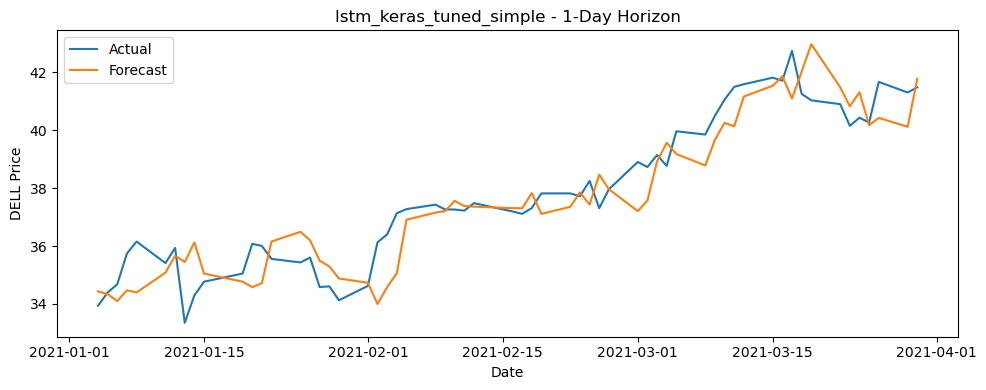

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━

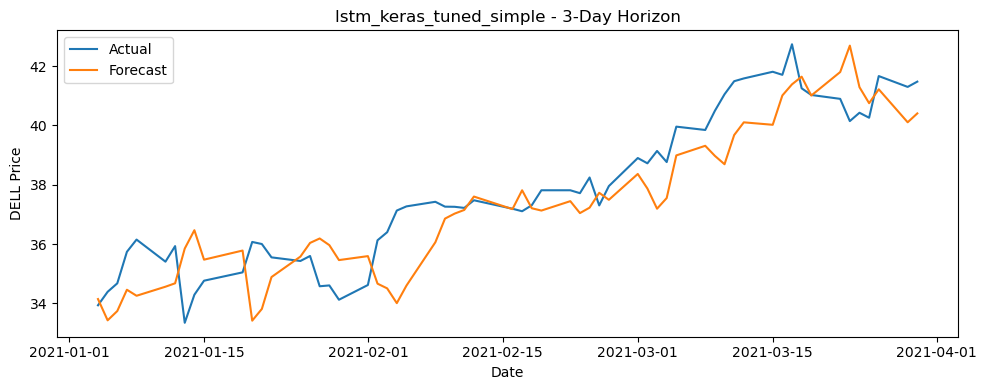

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━

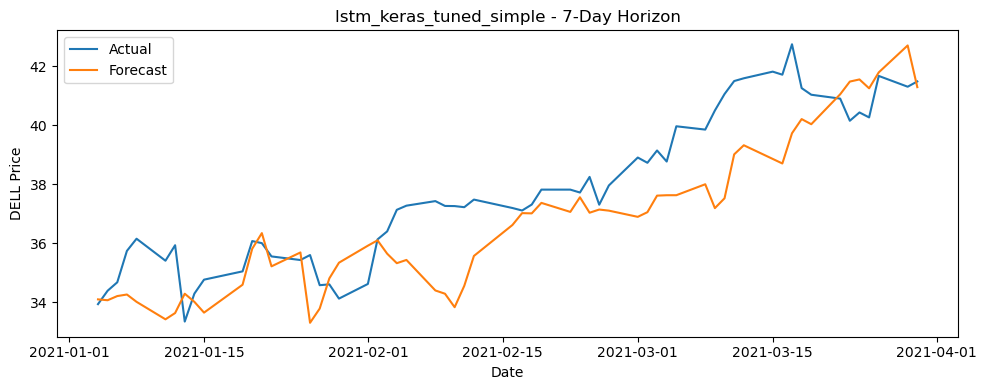


 Saved metrics to lstm_keras_tuned_simple_metrics_dell.csv


,model,horizon,rmse,mae,mape
0,lstm_keras_tuned_simple,1,0.985847,0.783532,2.084364
1,lstm_keras_tuned_simple,3,1.330640,1.093693,2.914837
2,lstm_keras_tuned_simple,7,1.674283,1.333612,3.477886


In [107]:
   #adapting evaluating function to accept a pre built model
input_shape = (30, 1)  
best_model_simple, best_hp_simple = tune_lstm_model(input_shape)

# Wrapper to pass to evaluator
def lstm_keras_tuned_simple(input_shape):
    return best_model_simple  # built from simple tuner

#evaluate model
evaluate_lstm_model(
    df=df,
    model_fn=lstm_keras_tuned_simple,
    forecast_horizons=[1, 3, 7],
    output_csv_path="lstm_keras_tuned_simple_metrics_dell.csv",
    callbacks=[EarlyStopping(monitor='loss', patience=3, restore_best_weights=True)]
)

### Tuner with more combinations to test

In [109]:
#defining hypermodel for keras tuner

class LSTMHyperModel(HyperModel):
    def __init__(self, input_shape):
        self.input_shape = input_shape

    def build(self, hp):
        model = Sequential()

        # First LSTM layer
        activation_1 = hp.Choice("activation_1", ["relu", "tanh", "leaky_relu"])
        units_1 = hp.Int("units_1", min_value=16, max_value=128, step=16)
        return_seq = hp.Boolean("return_seq_1")

        if activation_1 == "leaky_relu":
            model.add(LSTM(units_1, activation=None, return_sequences=return_seq, input_shape=self.input_shape))
            model.add(LeakyReLU(alpha=hp.Float("leaky_relu_alpha_1", 0.01, 0.3, step=0.05)))
        else:
            model.add(LSTM(units_1, activation=activation_1, return_sequences=return_seq, input_shape=self.input_shape))

        # Optional second LSTM layer — only if first returns sequences
        if return_seq and hp.Boolean("add_second_lstm"):
            model.add(Dropout(hp.Float("dropout_1", 0.0, 0.4, step=0.1)))
            units_2 = hp.Int("units_2", min_value=16, max_value=64, step=16)
            activation_2 = hp.Choice("activation_2", ["relu", "tanh", "leaky_relu"])
            if activation_2 == "leaky_relu":
                model.add(LSTM(units_2, activation=None))
                model.add(LeakyReLU(alpha=hp.Float("leaky_relu_alpha_2", 0.01, 0.3, step=0.05)))
            else:
                model.add(LSTM(units_2, activation=activation_2))

        # Optional final dropout
        if hp.Boolean("add_final_dropout"):
            model.add(Dropout(hp.Float("final_dropout", 0.0, 0.3, step=0.1)))

        # Output layer
        model.add(Dense(1))  # Avoided activation=None/linear choice to keep tuner stable

        # Optimizer
        optimizer_name = hp.Choice("optimizer", ["adam", "rmsprop"])
        learning_rate = hp.Float("learning_rate", 1e-5, 1e-2, sampling="log")
        optimizer = optimizers.Adam(learning_rate) if optimizer_name == "adam" else optimizers.RMSprop(learning_rate)

        model.compile(optimizer=optimizer, loss="mse", metrics=["mae"])
        return model

In [110]:
# window size
window_size = 30
input_shape = (window_size, 1)
# scaled DELL series
df = df.copy()
df.index = pd.to_datetime(df.index)
df = df.asfreq("B")
series = df["DELL"].dropna().to_frame()

scaler = MinMaxScaler()
series_scaled = scaler.fit_transform(series)

#training sequences
X_train, y_train = [], []
for i in range(window_size, int(len(series_scaled) * 0.8)):
    X_train.append(series_scaled[i - window_size:i])
    y_train.append(series_scaled[i][0])

X_train = np.array(X_train)
y_train = np.array(y_train)

In [111]:
# Setup tuner
tuner = RandomSearch(
    LSTMHyperModel(input_shape=(window_size, 1)),
    objective="val_loss",
    max_trials=20,
    executions_per_trial=1,
    directory="lstm_tuning",
    project_name="baseline_tune",
    seed=seed #setting random seed
)

# Run tuning
early_stop = EarlyStopping(monitor="val_loss", patience=3, restore_best_weights=True)
tuner.search(X_train, y_train, validation_split=0.2, epochs=20, callbacks=[early_stop])

# Get best model + hyperparameters
best_hp = tuner.get_best_hyperparameters(1)[0]
best_model_complex = tuner.hypermodel.build(best_hp)

# Display best config
print("\n Best Hyperparameter Configuration:")
for k, v in best_hp.values.items():
    print(f"{k}: {v}")

Reloading Tuner from lstm_tuning\baseline_tune\tuner0.json

 Best Hyperparameter Configuration:
activation_1: tanh
units_1: 64
return_seq_1: False
add_second_lstm: False
add_final_dropout: True
output_activation: linear
optimizer: adam
learning_rate: 0.006571970090025509
dropout_1: 0.4
units_2: 64
activation_2: relu
leaky_relu_alpha_1: 0.11
final_dropout: 0.2


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━

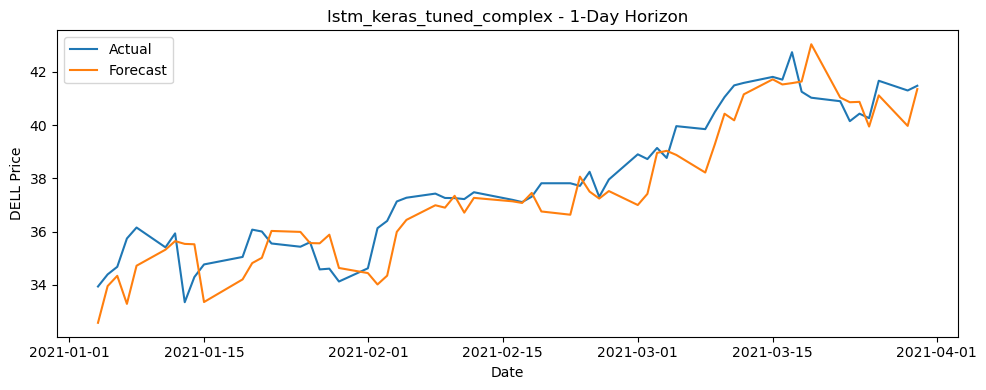

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━

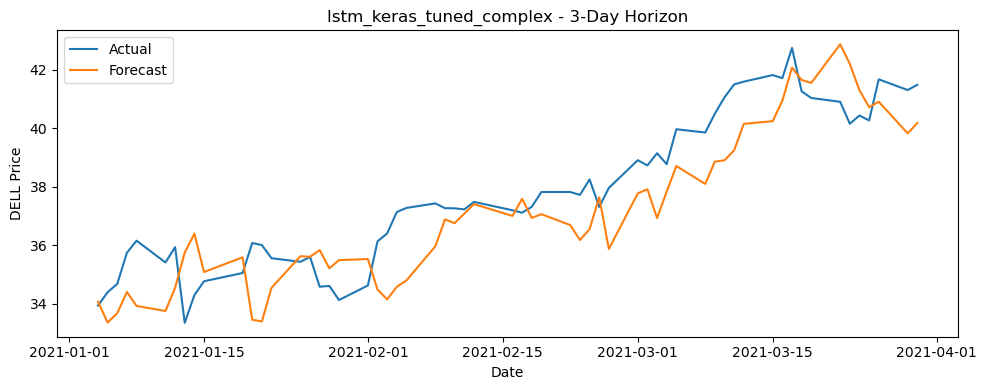

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━

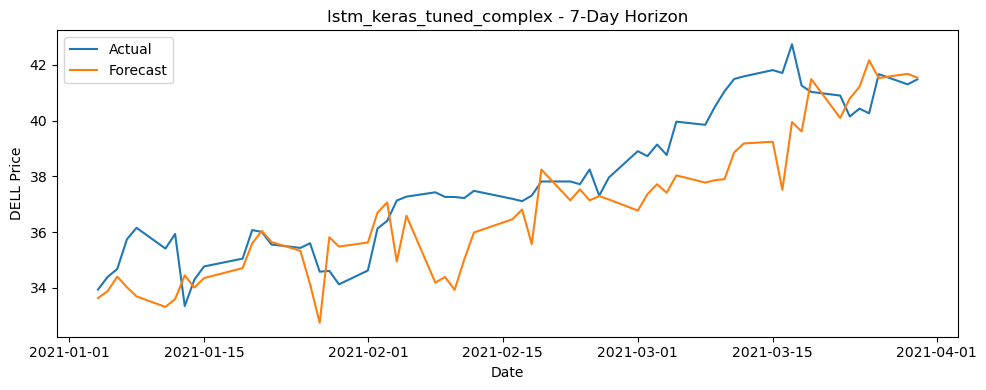


 Saved metrics to lstm_keras_tuned_metrics_dell.csv


,model,horizon,rmse,mae,mape
0,lstm_keras_tuned_complex,1,1.012692,0.792025,2.121487
1,lstm_keras_tuned_complex,3,1.429723,1.219458,3.235775
2,lstm_keras_tuned_complex,7,1.674203,1.334705,3.489053


In [112]:
#wrapper
def lstm_keras_tuned_complex(input_shape):
    return best_model_complex
#evaluate
evaluate_lstm_model(
    df=df,
    model_fn=lstm_keras_tuned_complex,
    forecast_horizons=[1, 3, 7],
    output_csv_path="lstm_keras_tuned_metrics_dell.csv",
    callbacks=[early_stop]
)

In [113]:
#saving best model for use with exo variables later
best_hp = tuner.get_best_hyperparameters(1)[0]

def best_model_fn(input_shape):
    model = LSTMHyperModel(input_shape).build(best_hp)
    return model

In [114]:
def evaluate_lstm_model_with_exo(
    df,
    exo_var=None,
    model_fn=None,
    forecast_horizons=[1, 3, 7],
    train_end="2020-12-31",
    test_start="2021-01-01",
    window_size=30,
    epochs=10,
    output_csv_path="metrics_dell.csv",
    plot=True,  
    callbacks=None
):
    df = df.copy()
    df.index = pd.to_datetime(df.index)
    df = df.asfreq("B")

    features = ["DELL"] + ([exo_var] if isinstance(exo_var, str) else exo_var or [])
    df = df[features].dropna()

    scaler = MinMaxScaler()
    data_scaled = scaler.fit_transform(df)

    split_train = df.index <= train_end
    split_test = df.index >= test_start

    all_metrics = []

    for h in forecast_horizons:
        preds, actuals, dates = [], [], []

        for i in range(window_size, len(data_scaled) - h):
            if not split_test[i + h]:
                continue

            # Build training set once per step
            X_train_full, y_train_full = [], []
            for j in range(window_size, i):
                X_train_full.append(data_scaled[j - window_size:j])
                y_train_full.append(data_scaled[j][0])

            X_train_full = np.array(X_train_full, dtype=np.float32)
            y_train_full = np.array(y_train_full, dtype=np.float32)

            X = data_scaled[i - window_size:i].reshape(1, window_size, len(features))

            # Create, fit, and predict
            model = model_fn((window_size, len(features)))
            model.fit(X_train_full, y_train_full, epochs=epochs, verbose=0, callbacks=callbacks)

            pred_scaled = model.predict(X)[0][0]
            pred = scaler.inverse_transform([[pred_scaled] + [0] * (len(features) - 1)])[0][0]
            actual = df.iloc[i + h]["DELL"]

            preds.append(pred)
            actuals.append(actual)
            dates.append(df.index[i + h])

            # CLEANUP
            del model, X_train_full, y_train_full, X
            K.clear_session()
            gc.collect()

        # Compute metrics
        if preds:
            rmse = np.sqrt(mean_squared_error(actuals, preds))
            mae = mean_absolute_error(actuals, preds)
            mape = mean_absolute_percentage_error(actuals, preds)
            print(f"Exo: {exo_var or 'None'} - Horizon {h} -> RMSE={rmse:.2f}, MAE={mae:.2f}, MAPE={mape:.2f}")

            all_metrics.append({
                "model": model_fn.__name__,
                "exo_var": exo_var or "None",
                "horizon": h,
                "rmse": rmse,
                "mae": mae,
                "mape": mape
            })

            if plot:
                plt.figure(figsize=(10, 4))
                plt.plot(dates, actuals, label="Actual")
                plt.plot(dates, preds, label="Forecast")
                plt.title(f"{exo_var or 'No Exo'} - {h}-Day Horizon")
                plt.xlabel("Date")
                plt.ylabel("DELL Price")
                plt.legend()
                plt.tight_layout()
                plt.show()

    # Save results
    df_metrics = pd.DataFrame(all_metrics)

    if os.path.exists(output_csv_path):
        existing = pd.read_csv(output_csv_path)
        df_metrics = pd.concat([existing, df_metrics], ignore_index=True)

    df_metrics.to_csv(output_csv_path, index=False)
    print(f"\nSaved metrics to {output_csv_path}")
    return df_metrics


 Evaluating with exogenous variable: SMH
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step
1/1 ━━━━━━━━━━━━━━━━━

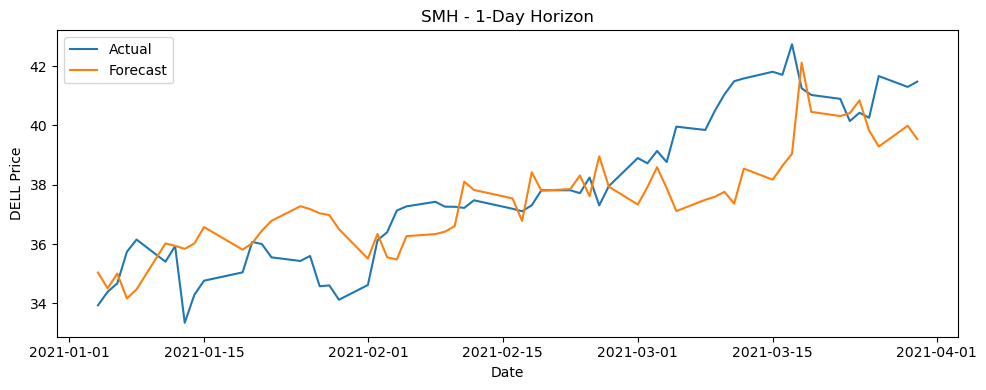

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

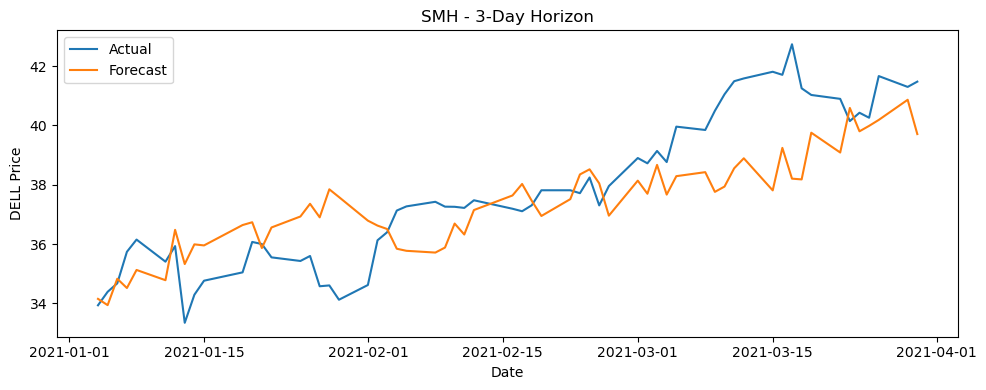

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

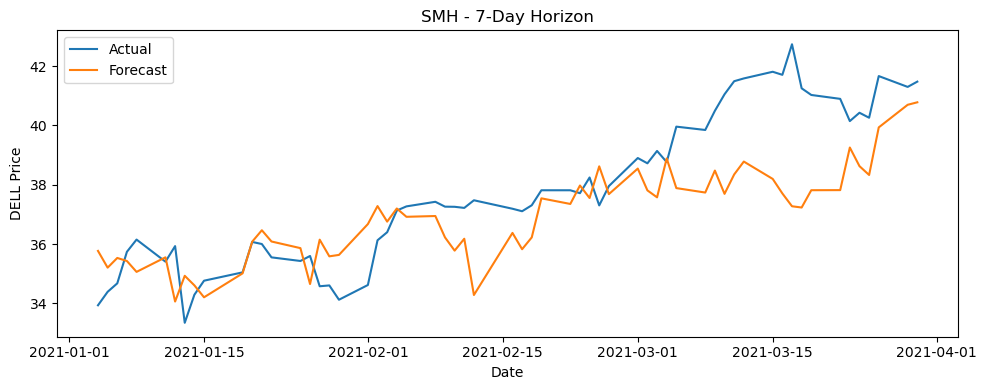


Saved metrics to metrics_lstm_exo_SMH_dell.csv

 Evaluating with exogenous variable: ^IXIC
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━

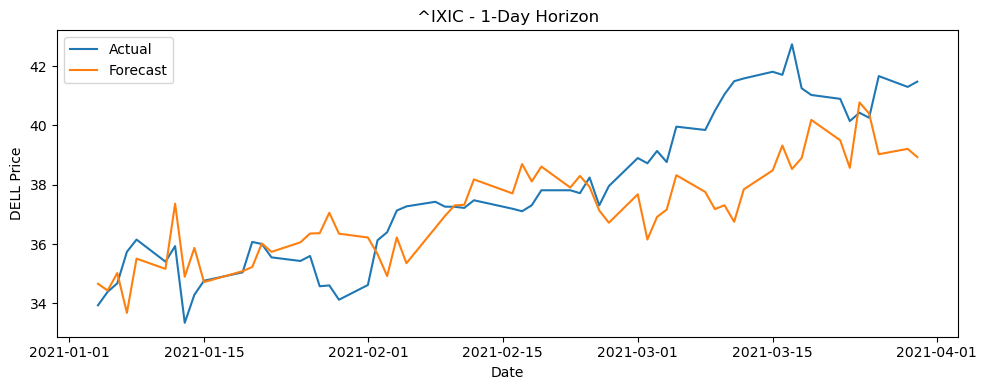

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

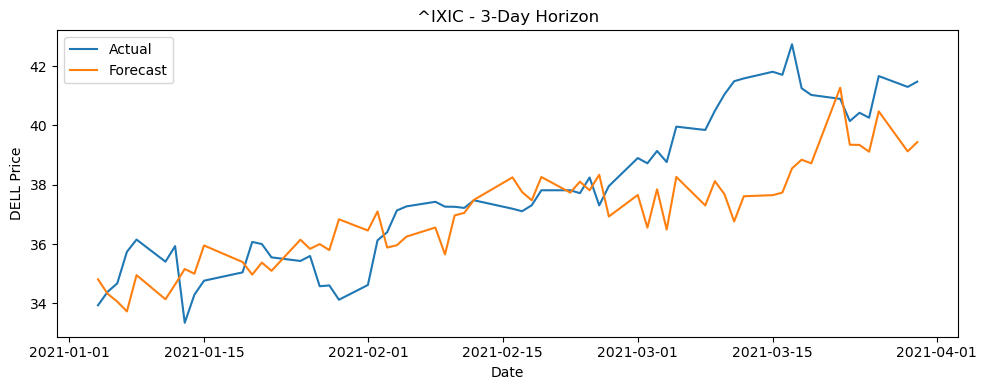

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

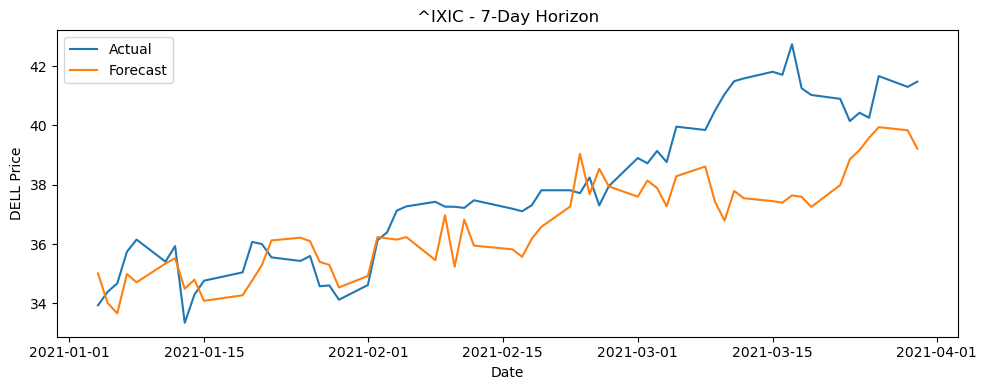


Saved metrics to metrics_lstm_exo_IXIC_dell.csv

 Evaluating with exogenous variable: XLK
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━

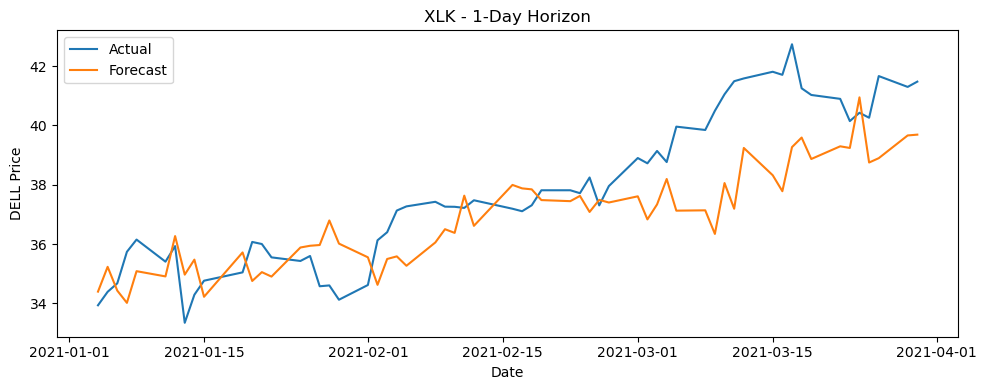

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

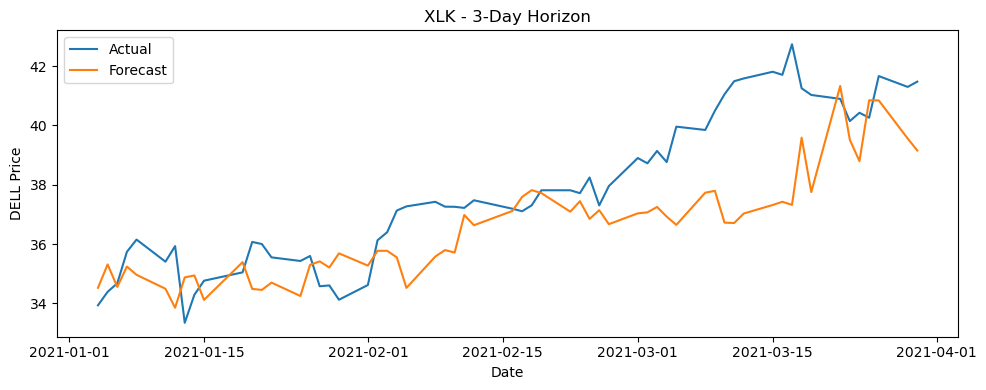

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

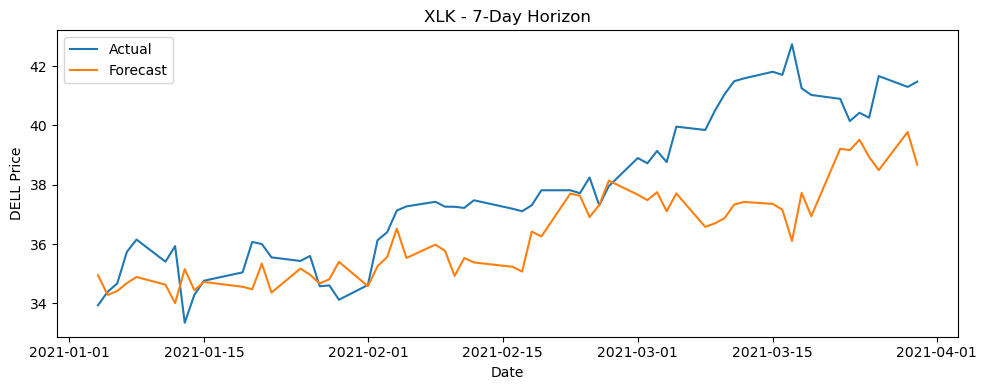


Saved metrics to metrics_lstm_exo_XLK_dell.csv

 Evaluating with exogenous variable: HG=F
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step
1/1 ━━━━━━━━

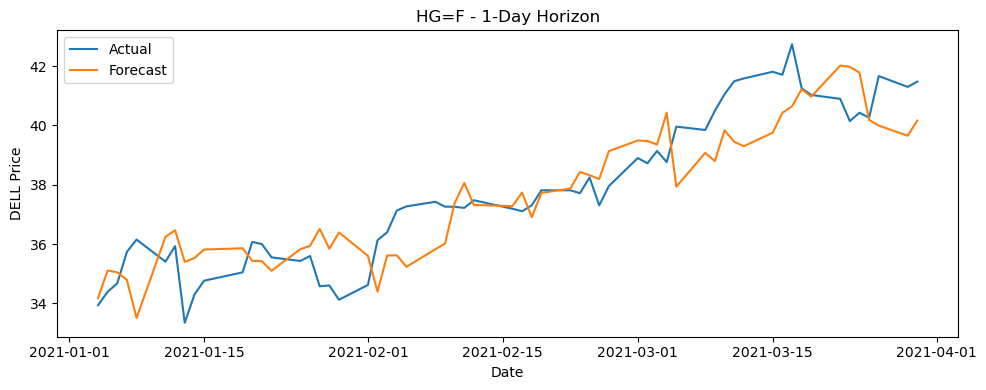

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

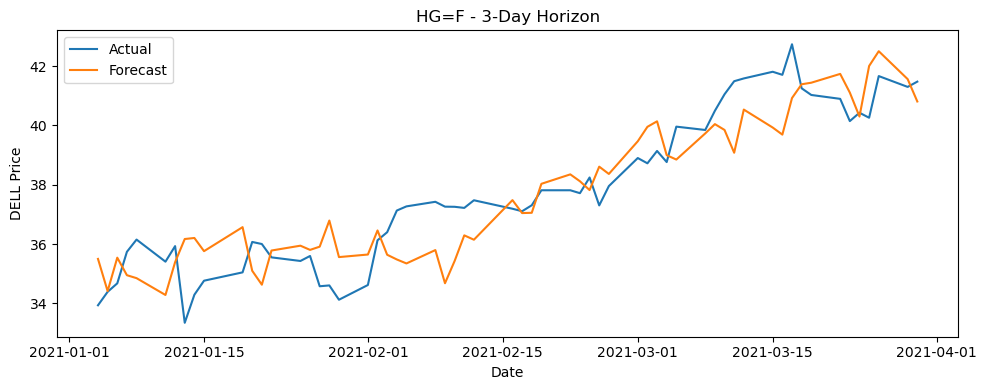

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

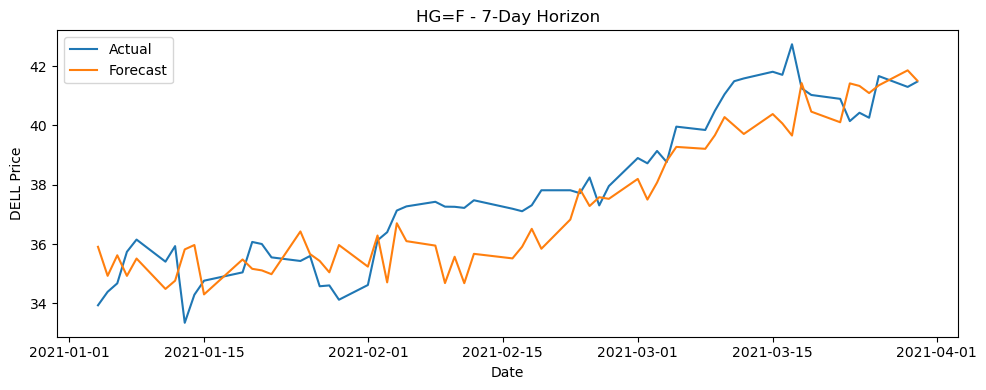


Saved metrics to metrics_lstm_exo_HGF_dell.csv

 Evaluating with exogenous variable: CL=F
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step
1/1 ━━━━━━━━

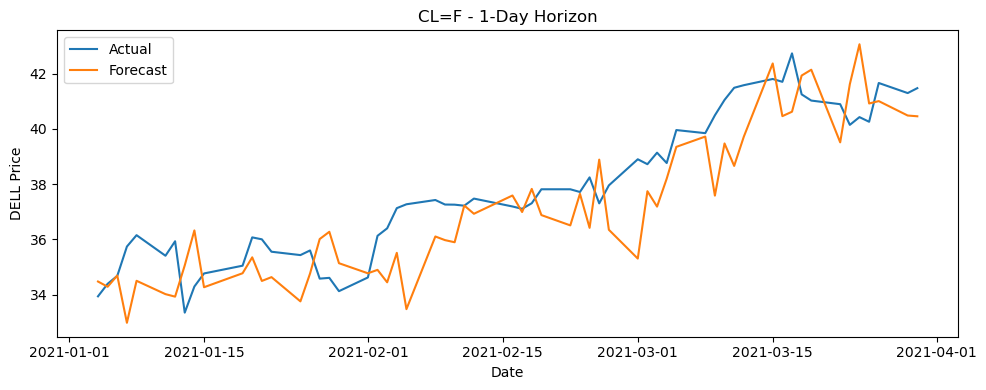

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

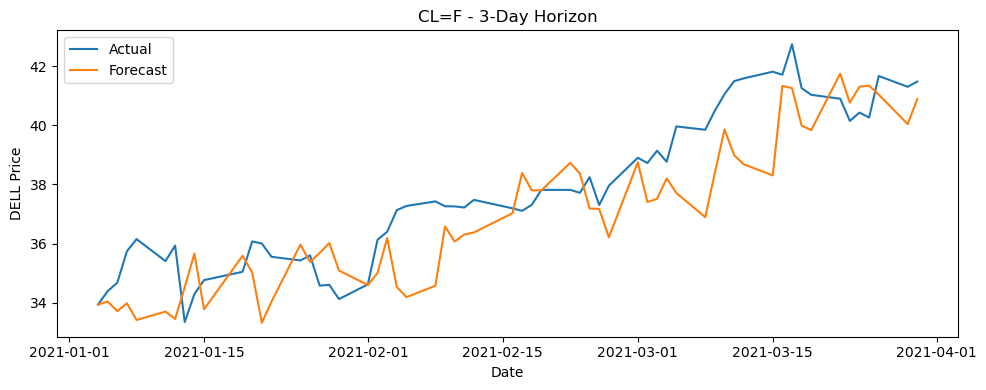

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

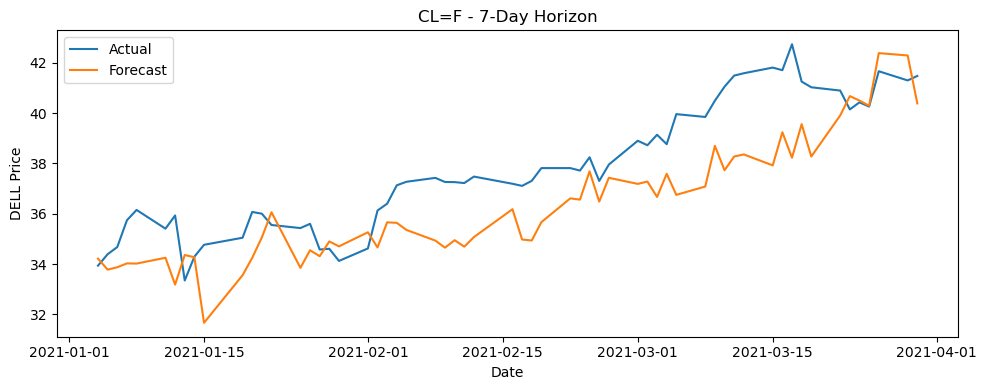


Saved metrics to metrics_lstm_exo_CLF_dell.csv

 Evaluating with exogenous variable: DX-Y.NYB
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
1/1 ━━━━

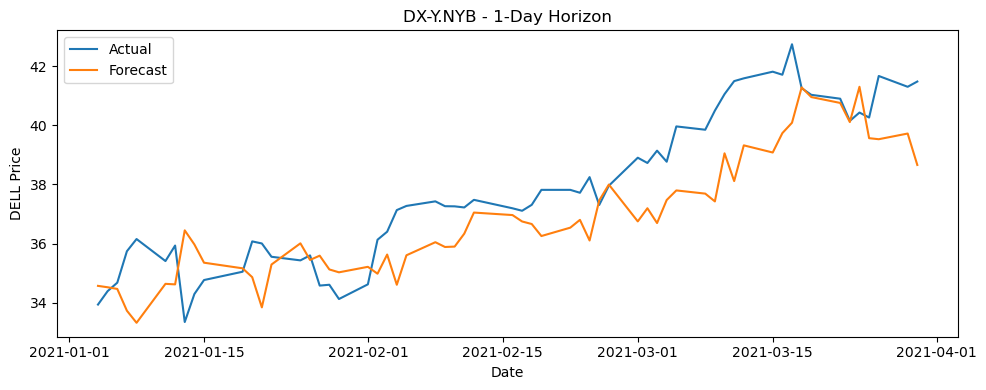

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

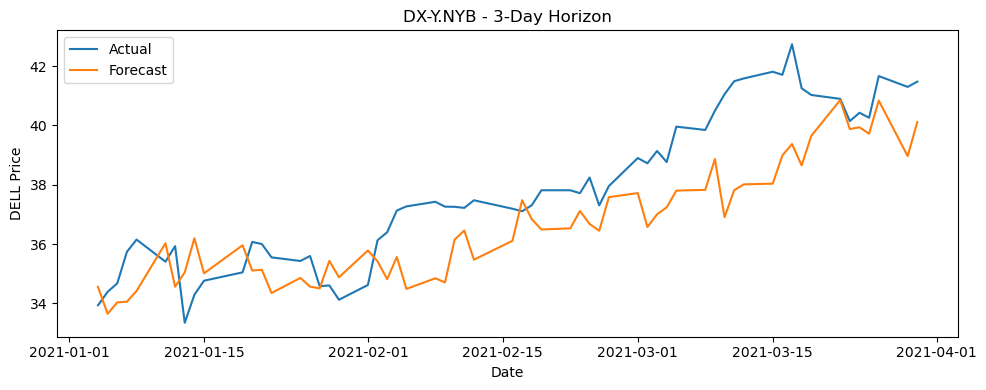

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

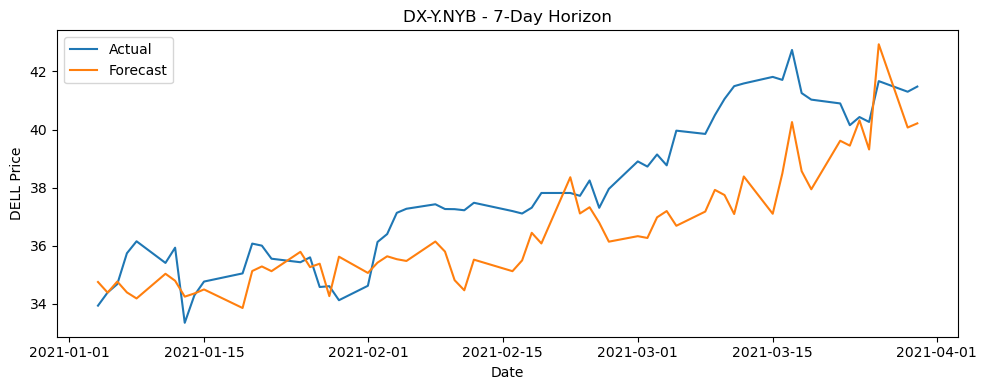


Saved metrics to metrics_lstm_exo_DXY.NYB_dell.csv

 Evaluating with exogenous variable: ^TNX
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step
1/1 ━━━━

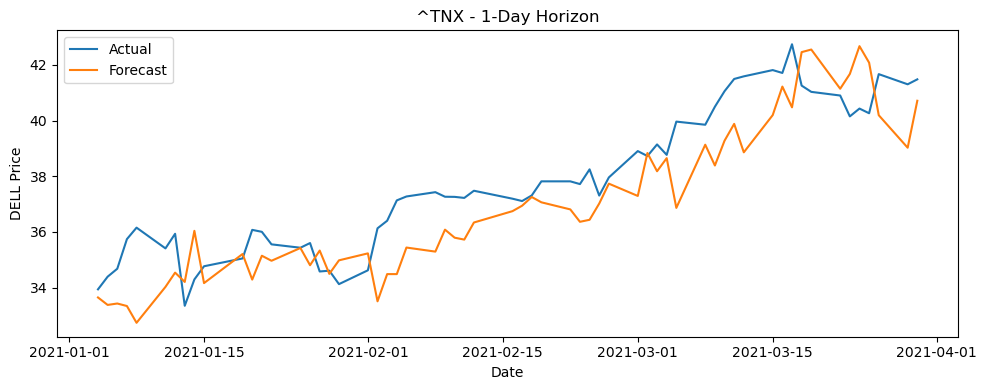

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

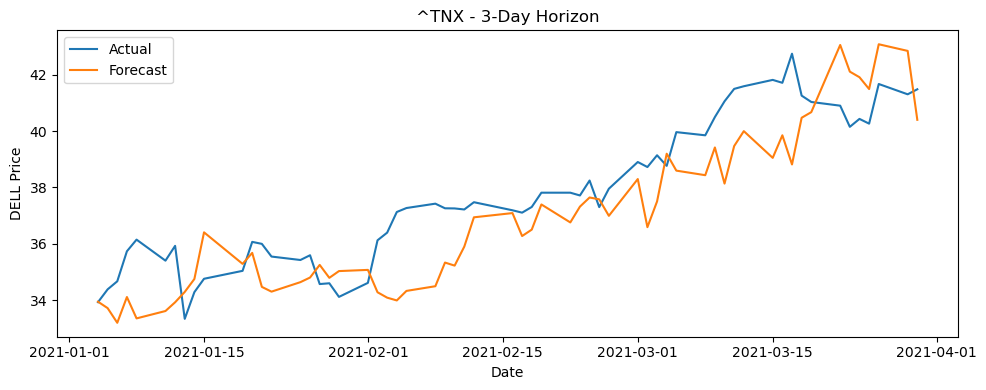

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 545ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

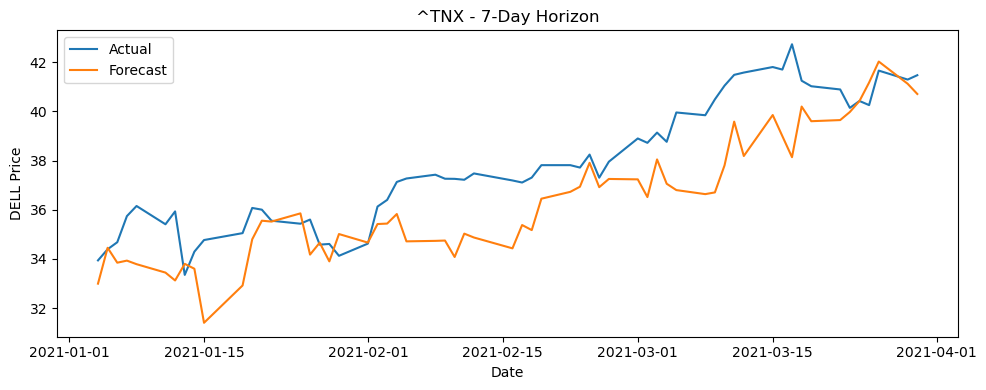


Saved metrics to metrics_lstm_exo_TNX_dell.csv

 Evaluating with exogenous variable: XLY
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step
1/1 ━━━━━━━━━

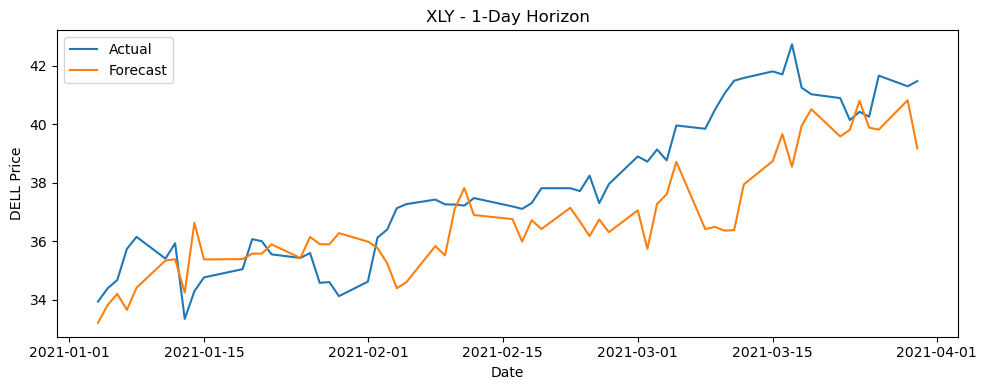

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 551ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

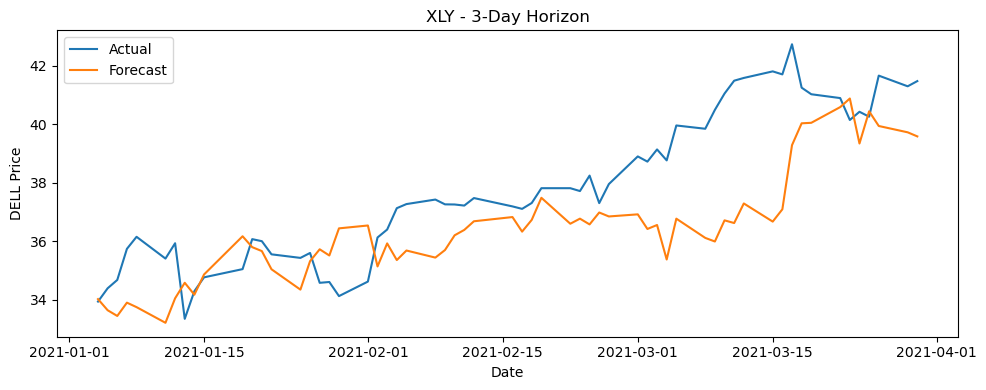

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 521ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

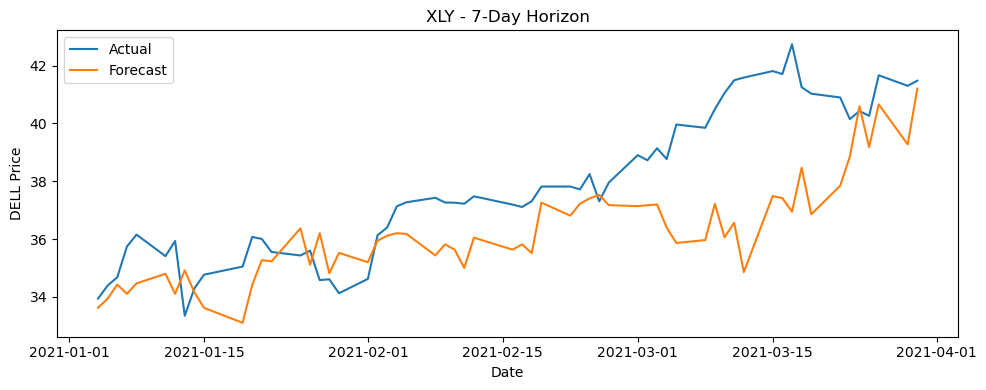


Saved metrics to metrics_lstm_exo_XLY_dell.csv

 Evaluating with exogenous variable: XLI
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 568ms/step
1/1 ━━━━━━━━━

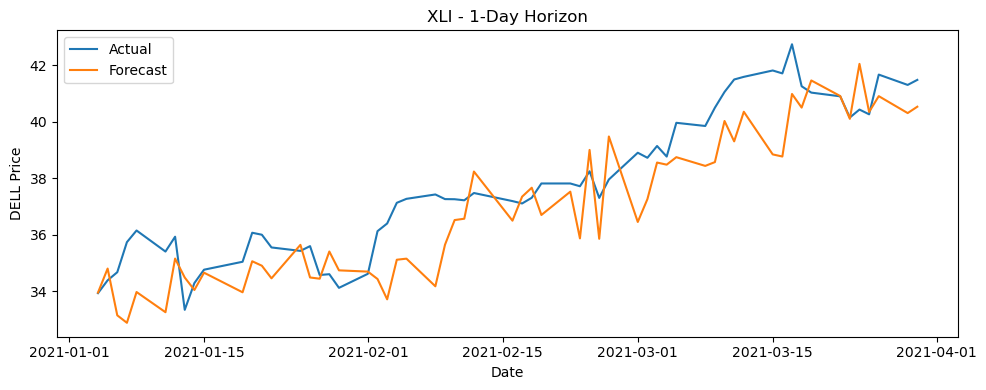

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 617ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 578ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

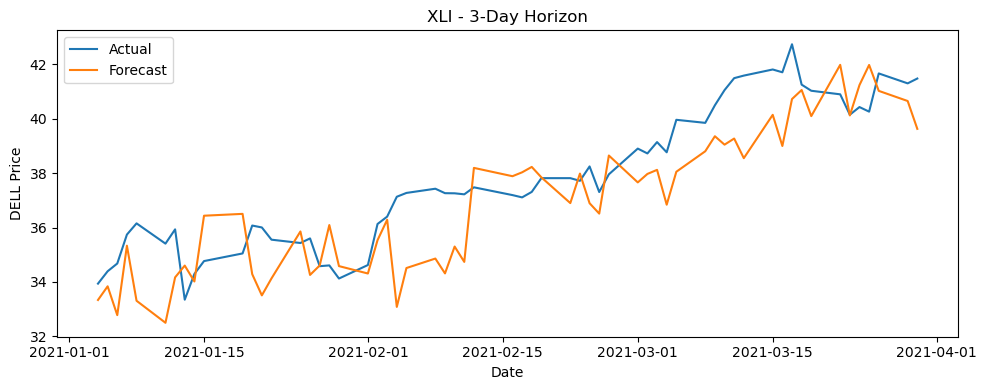

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 544ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 554ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 634ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 573ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 590ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

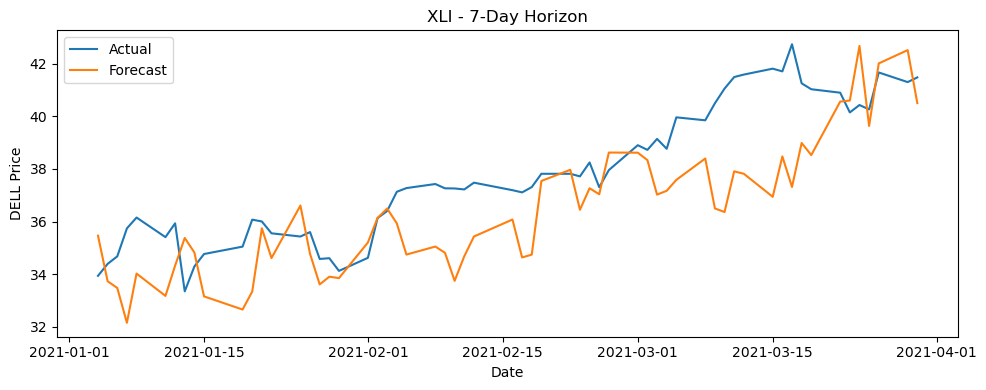


Saved metrics to metrics_lstm_exo_XLI_dell.csv

 Evaluating with exogenous variable: IYT
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 622ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 529ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 529ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step
1/1 ━━━━━━━━━

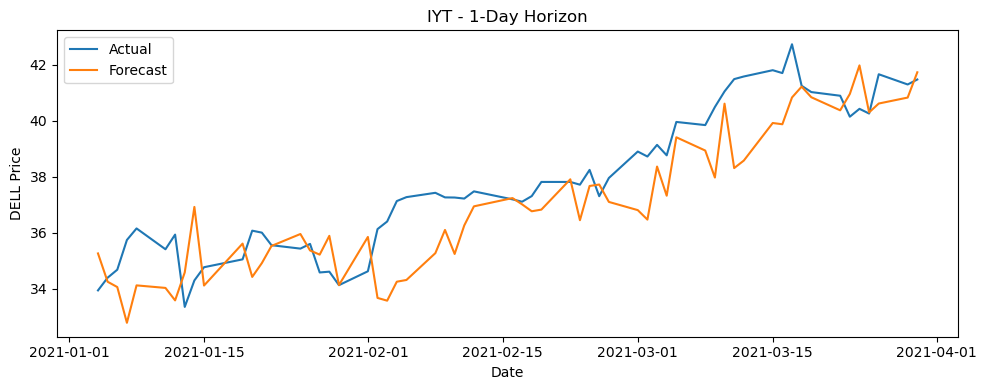

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 514ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 607ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 611ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 567ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 574ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 628ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 576ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 521ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 596ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 592ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

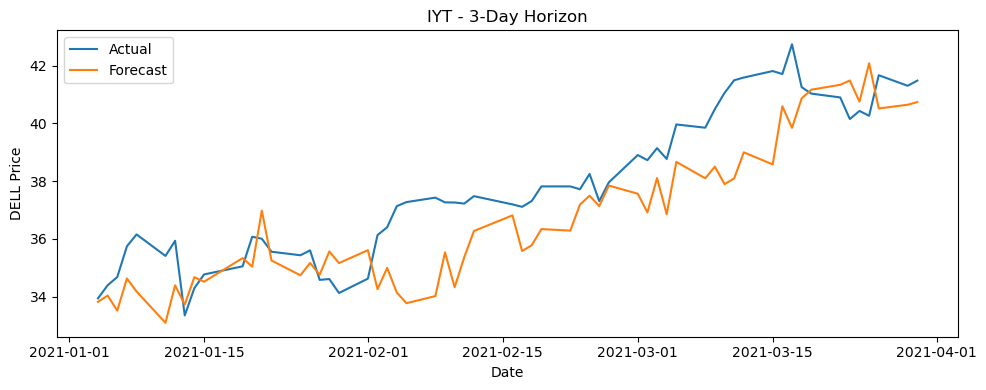

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 780ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 620ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 572ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 581ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 762ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 660ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 704ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 599ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 523ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 791ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 760ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 641ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 608ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 699ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 578ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

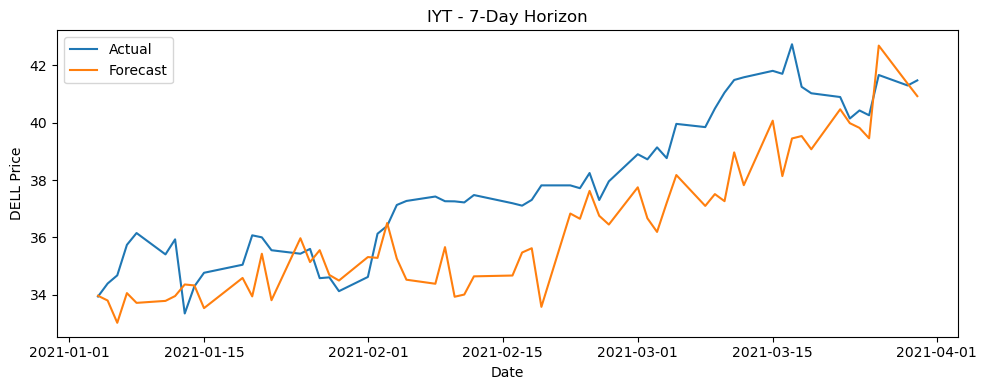


Saved metrics to metrics_lstm_exo_IYT_dell.csv

 Evaluating with exogenous variable: ^VIX
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 676ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 844ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 832ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 563ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 840ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 773ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 577ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 675ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step
1/1 ━━━━━━━━

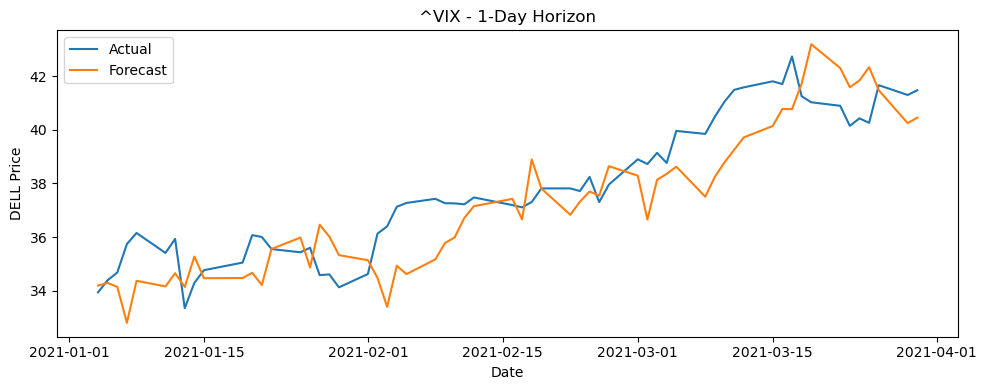

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 829ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 668ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 781ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 541ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 726ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 573ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 542ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 624ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 730ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 732ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 802ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 754ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 551ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 740ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 603ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 541ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 679ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 696ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

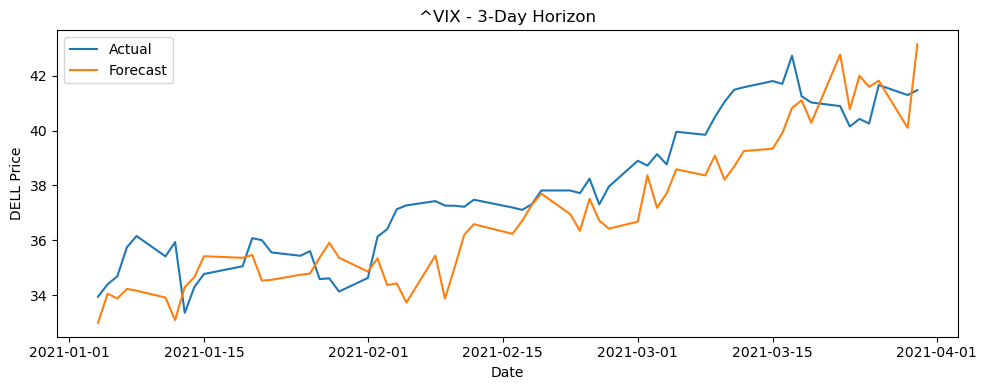

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 784ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 683ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 688ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 760ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 764ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 809ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 749ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 779ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 688ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 797ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 710ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 573ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 850ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 622ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 597ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 785ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 745ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

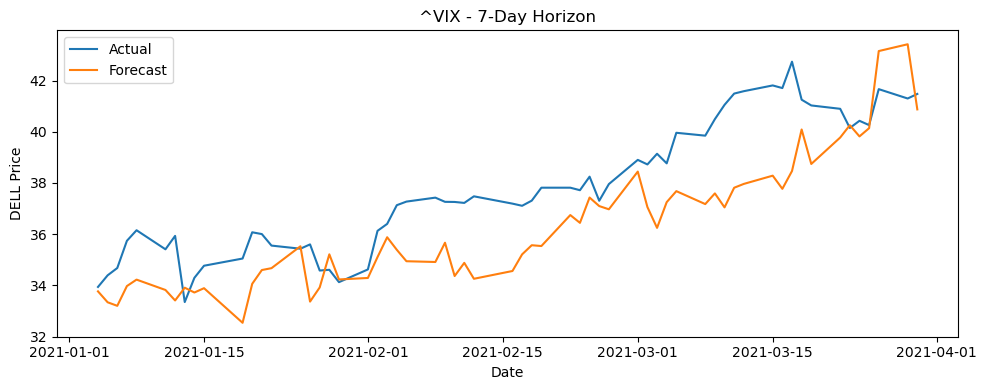


Saved metrics to metrics_lstm_exo_VIX_dell.csv


In [115]:
# loop over exo variables one at a time
exo_vars = ['SMH', '^IXIC', 'XLK', 'HG=F', 'CL=F', 'DX-Y.NYB', '^TNX', 'XLY', 'XLI', 'IYT','^VIX']

for var in exo_vars:
    print(f"\n Evaluating with exogenous variable: {var}")
    evaluate_lstm_model_with_exo(
        df=df.copy(),
        exo_var=var,
        model_fn=best_model_fn,
        forecast_horizons=[1, 3, 7],
        output_csv_path=f"metrics_lstm_exo_{var.replace('=', '').replace('^', '').replace('-', '')}_dell.csv",
        callbacks=[early_stop]
    )

In [116]:
#grouping exo variables by type
grouped_exo_vars = {
    "sectoral": ["SMH", "^IXIC", "XLK"],
    "macroeconomic": ["DX-Y.NYB", "^TNX", "^VIX", "XLY", "XLI"],
    "supply_chain_and_commodities": ["HG=F", "CL=F", "IYT"]
}


 Evaluating group: sectoral with variables: ['SMH', '^IXIC', 'XLK']
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 636ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 797ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 755ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 634ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 752ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 799ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 802ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 691ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 816ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 679ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 817ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 759ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 810ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 569ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 763ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 553ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 832ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 584ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/

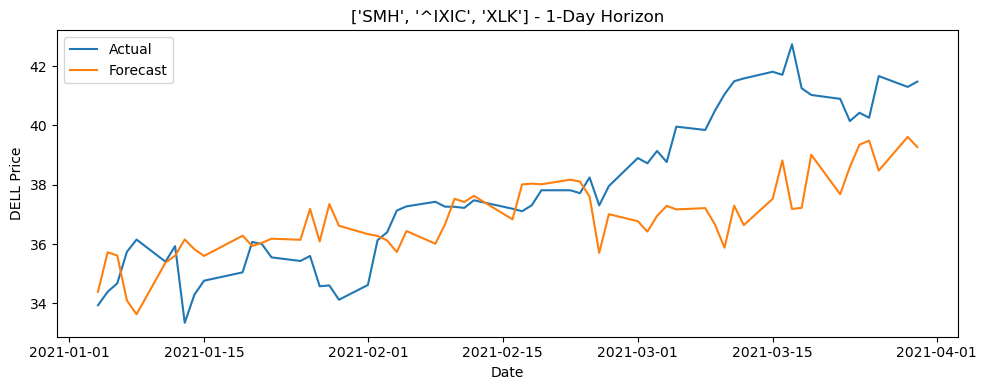


Saved metrics to metrics_lstm_group_sectoral_horizon_1_dell.csv

 Evaluating group: macroeconomic with variables: ['DX-Y.NYB', '^TNX', '^VIX', 'XLY', 'XLI']
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 750ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 700ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 780ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 759ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 962ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 656ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 580ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 736ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 701ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 548ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 744ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 829ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 770ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 921ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 630ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 683ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 676ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 813ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 828ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 753ms/step
1/1 ━━━━━━━━━━━━━━━━━━━

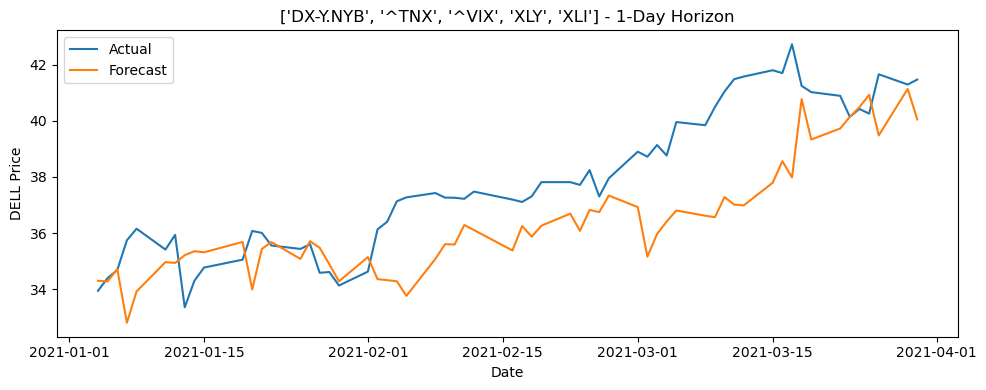


Saved metrics to metrics_lstm_group_macroeconomic_horizon_1_dell.csv

 Evaluating group: supply_chain_and_commodities with variables: ['HG=F', 'CL=F', 'IYT']
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 554ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 776ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 923ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 807ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 694ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 748ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 578ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 821ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 799ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 946ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 822ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 857ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 926ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 726ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 908ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 838ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step
1/1 ━━━━━━━━━━━━━━━━━━

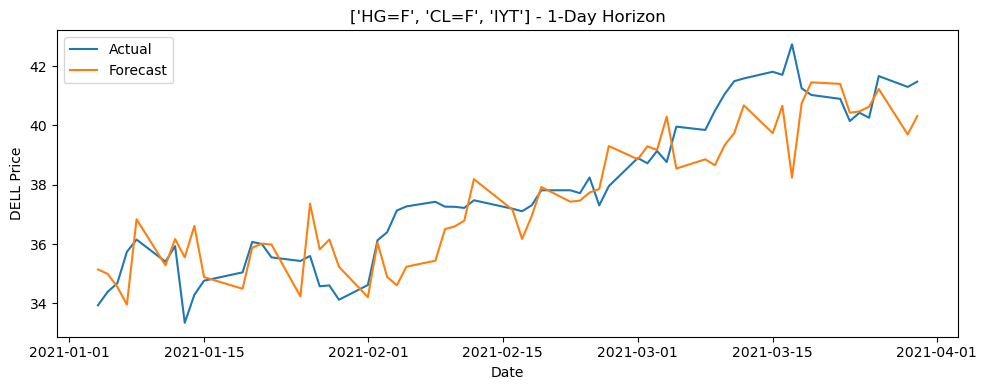


Saved metrics to metrics_lstm_group_supply_chain_and_commodities_horizon_1_dell.csv


In [117]:
#loop for evauating grouped variables
for group_name, var_list in grouped_exo_vars.items():
    print(f"\n Evaluating group: {group_name} with variables: {var_list}")
    
    evaluate_lstm_model_with_exo(
        df=df.copy(),
        exo_var=var_list,  # List of multiple variables
        model_fn=best_model_fn,
        forecast_horizons=[1], #trying one horizon at a time to deal with memory error
        output_csv_path=f"metrics_lstm_group_{group_name}_horizon_1_dell.csv",
        callbacks=[early_stop]
    )


 Evaluating group: sectoral with variables: ['SMH', '^IXIC', 'XLK']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 775ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 850ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 605ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 794ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 762ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 551ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 785ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 812ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 754ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 806ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 708ms/

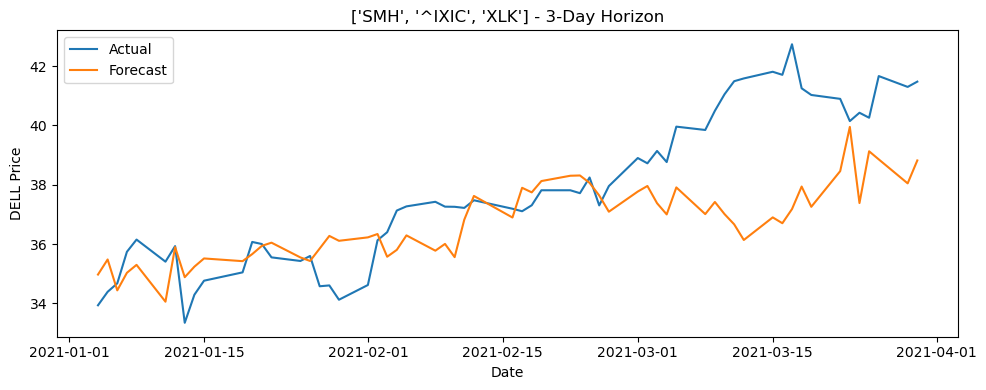


Saved metrics to metrics_lstm_group_sectoral_horizon_3_dell.csv

 Evaluating group: macroeconomic with variables: ['DX-Y.NYB', '^TNX', '^VIX', 'XLY', 'XLI']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 832ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 755ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 559ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 649ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 787ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 703ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 675ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 928ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 753ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 888ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 526ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 784ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 817ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   
1/1 ━━━━━━━━━━━━━━━━━━━

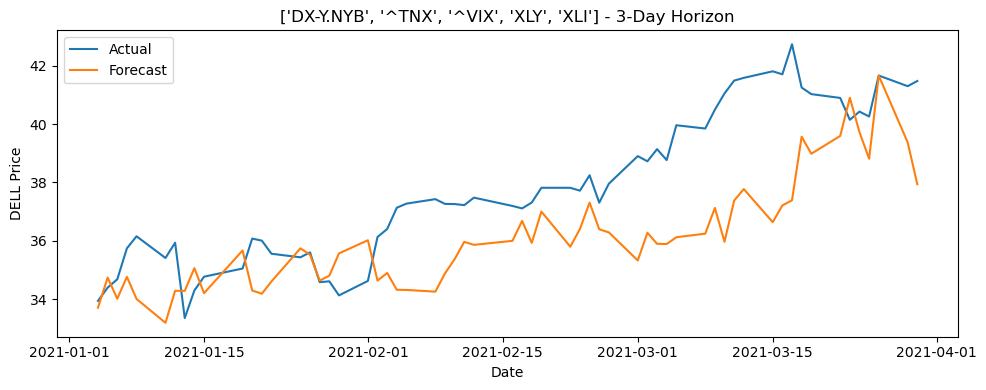


Saved metrics to metrics_lstm_group_macroeconomic_horizon_3_dell.csv

 Evaluating group: supply_chain_and_commodities with variables: ['HG=F', 'CL=F', 'IYT']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 747ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 739ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 782ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 575ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 573ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 611ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 675ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 834ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 739ms/step
1/1 ━━━━━━━━━━━━━━━━━━

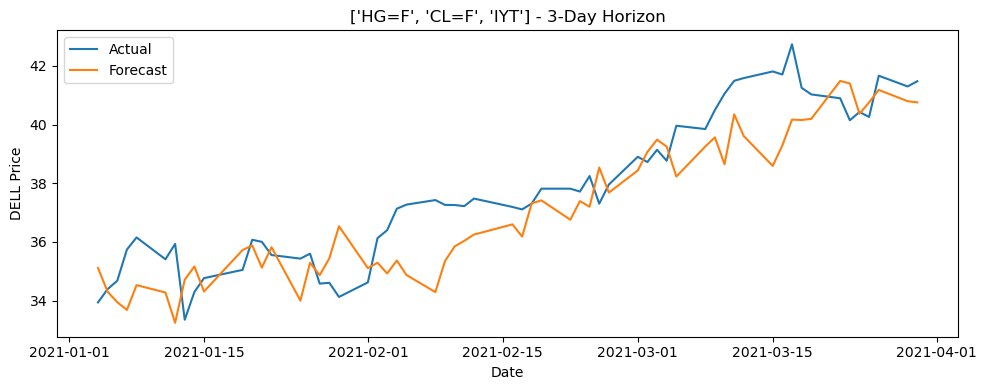


Saved metrics to metrics_lstm_group_supply_chain_and_commodities_horizon_3_dell.csv


In [118]:
#loop for evauating grouped variables
for group_name, var_list in grouped_exo_vars.items():
    print(f"\n Evaluating group: {group_name} with variables: {var_list}")
    
    evaluate_lstm_model_with_exo(
        df=df.copy(),
        exo_var=var_list,  # List of multiple variables
        model_fn=best_model_fn,
        forecast_horizons=[3],
        output_csv_path=f"metrics_lstm_group_{group_name}_horizon_3_dell.csv",
        callbacks=[early_stop]
    )


 Evaluating group: sectoral with variables: ['SMH', '^IXIC', 'XLK']
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 532ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 540ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 622ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 894ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 751ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 728ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 804ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 784ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 831ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 814ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 835ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 510ms/

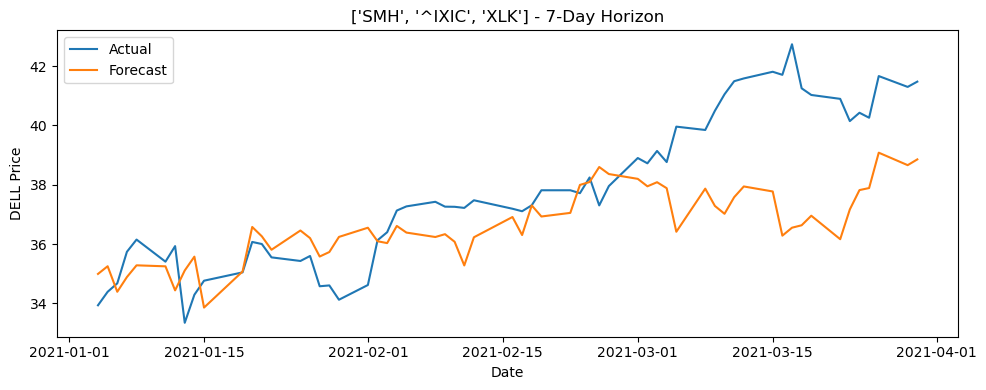


Saved metrics to metrics_lstm_group_sectoral_horizon_7_dell.csv

 Evaluating group: macroeconomic with variables: ['DX-Y.NYB', '^TNX', '^VIX', 'XLY', 'XLI']
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 685ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 778ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 552ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 851ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 857ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 552ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 964ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 858ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 806ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 840ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 855ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step
1/1 ━━━━━━━━━━━━━━━━━━━

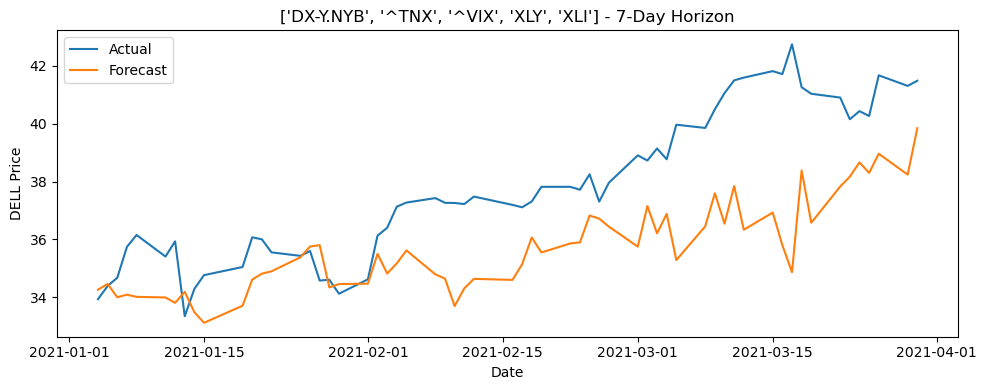


Saved metrics to metrics_lstm_group_macroeconomic_horizon_7_dell.csv

 Evaluating group: supply_chain_and_commodities with variables: ['HG=F', 'CL=F', 'IYT']
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 743ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 668ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 588ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 853ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 682ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 905ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 659ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 646ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 827ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 822ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 565ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 793ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

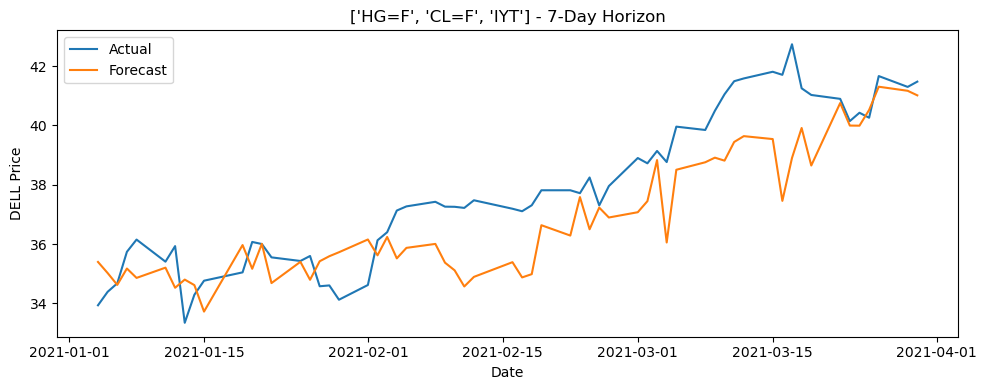


Saved metrics to metrics_lstm_group_supply_chain_and_commodities_horizon_7_dell.csv


In [119]:
#loop for evauating grouped variables
for group_name, var_list in grouped_exo_vars.items():
    print(f"\n Evaluating group: {group_name} with variables: {var_list}")
    
    evaluate_lstm_model_with_exo(
        df=df.copy(),
        exo_var=var_list,  # List of multiple variables
        model_fn=best_model_fn,
        forecast_horizons=[7],
        output_csv_path=f"metrics_lstm_group_{group_name}_horizon_7_dell.csv",
        callbacks=[early_stop]
    )

### Getting best score from each exo variable type to include as exo variables 

In [121]:
exo_vars = ['SMH', '^IXIC', 'XLK', 'HG=F', 'CL=F', 'DX-Y.NYB', '^TNX', 'XLY', 'XLI', 'IYT','^VIX']

combined_dfs = []

for var in exo_vars:
    safe_var = var.replace("=", "").replace("^", "").replace("-", "")
    filename = f"metrics_lstm_exo_{safe_var}_dell.csv"

    if os.path.exists(filename):
        df_temp = pd.read_csv(filename)
        df_temp["exo_var"] = var  # adding the original exogenous variable name
        combined_dfs.append(df_temp)
    else:
        print(f"Missing: {filename}")

# Combine and save
if combined_dfs:
    df_all = pd.concat(combined_dfs, ignore_index=True)
    df_all.to_csv("metrics_lstm_all_exo_combined_dell.csv", index=False)
    print("Combined results saved to: metrics_lstm_all_exo_combined_dell.csv")
else:
    print("No data to combine.")

Combined results saved to: metrics_lstm_all_exo_combined_dell.csv


In [122]:
df_all = df_all.drop_duplicates(subset=["exo_var", "horizon"])

#print best inputs
df_all.sort_values(by="mape").groupby("horizon").first()

,model,exo_var,rmse,mae,mape
horizon,,,,,
1,best_model_fn,HG=F,1.250987,1.036509,2.735949
3,best_model_fn,HG=F,1.222013,1.010837,2.701558
7,best_model_fn,HG=F,1.236177,1.034114,2.752557


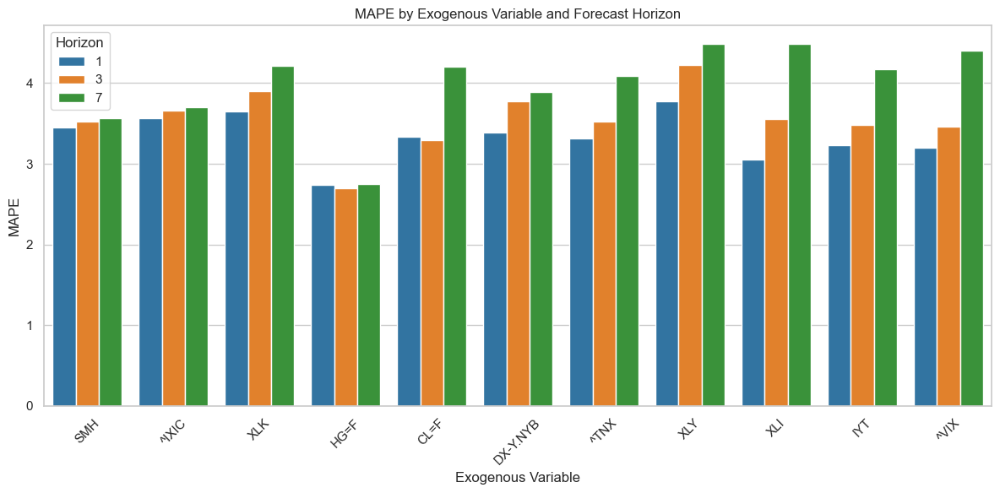

In [145]:
#plotting to compare across multiple horizons

plt.figure(figsize=(12, 6))
sns.barplot(
    data=df_all,
    x="exo_var",
    y="mape",
    hue="horizon",
    palette="tab10"
)
plt.title("MAPE by Exogenous Variable and Forecast Horizon")
plt.xlabel("Exogenous Variable")
plt.ylabel("MAPE")
plt.legend(title="Horizon")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

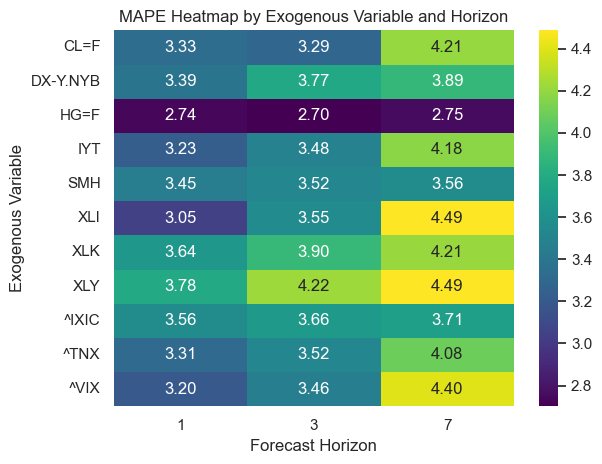

In [147]:
#heatmap
pivot = df_all.pivot(index="exo_var", columns="horizon", values="mape")
sns.heatmap(pivot, annot=True, fmt=".2f", cmap="viridis")
plt.title("MAPE Heatmap by Exogenous Variable and Horizon")
plt.ylabel("Exogenous Variable")
plt.xlabel("Forecast Horizon")
plt.tight_layout()
plt.show()

In [125]:
# mapping labels to tickers
label_mapping = {
    "sectoral": ["SMH", "^IXIC", "XLK"],
    "macroeconomic": ["DX-Y.NYB", "^TNX", "^VIX", "XLY", "XLI"],
    "supply_chain_and_commodities": ["HG=F", "CL=F", "IYT"]
}

# inverting the mapping to map each ticker to its category
ticker_to_category = {ticker: label for label, tickers in label_mapping.items() for ticker in tickers}

# assigning the category to each row
df_all["category"] = df_all["exo_var"].map(ticker_to_category)

# Save the updated DataFrame with category column to a new CSV
df_all.to_csv("metrics_with_categories_dell.csv", index=False)

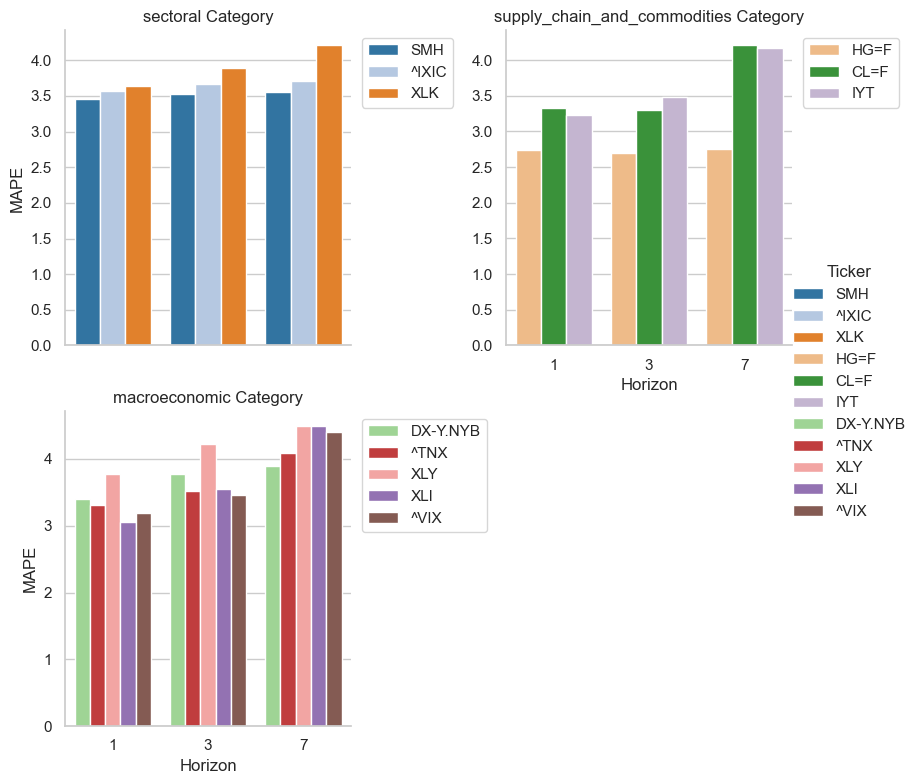

In [149]:
# setting style
sns.set(style="whitegrid")

# using unique color for each ticker
unique_tickers = df_all["exo_var"].unique()
palette = sns.color_palette("tab20", n_colors=len(unique_tickers))
color_map = dict(zip(unique_tickers, palette))

# FacetGrid creation
g = sns.FacetGrid(df_all, col="category", col_wrap=2, height=4, sharey=False)

# plot
g.map_dataframe(
    sns.barplot,
    x="horizon", y="mape", hue="exo_var",
    palette=color_map,
    errorbar=None
)

# key
g.add_legend(title="Ticker")
for ax in g.axes.flatten():
    ax.legend(loc='upper left', bbox_to_anchor=(1.01, 1))

# Set axis labels and titles
g.set_axis_labels("Horizon", "MAPE")
g.set_titles(col_template="{col_name} Category")
plt.tight_layout()
plt.show()

## BEst of need to be chosen

In [151]:
# best from each category identified - defining list to use in model
best_exo_by_horizon = {
    1: ["SMH", "HG=F", "XLI"],
    3: ["SMH", "HG=F", "^VIX"],
    7: ["SMH", "HG=F", "DX-Y.NYB"]
}

In [ ]:
#loop for evauating best of each categories variables combined
for group_name, var_list in grouped_exo_vars.items():
    print(f"\n Evaluating best exogenous variables for horizon 1 with variables: SMH, HG=F, ^TNX")
    
    evaluate_lstm_model_with_exo(
        df=df.copy(),
        exo_var=["SMH", "HG=F", "^XLI"],  # List of multiple variables
        model_fn=best_model_fn,
        forecast_horizons=[1], #trying one horizon at a time to deal with memory error
        output_csv_path=f"metrics_lstm_bestof_horizon_1_dell.csv",
        callbacks=[early_stop]
    )


 Evaluating best exogenous variables for horizon 1 with variables: SMH, HG=F, ^TNX
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 659ms/step


In [ ]:
#horizon 3
for group_name, var_list in grouped_exo_vars.items():
    print(f"\n Evaluating best exogenous variables for horizon 3 with variables: SMH, HG=F, XLI")
    
    evaluate_lstm_model_with_exo(
        df=df.copy(),
        exo_var=["SMH", "HG=F", "^VIX"],  # List of multiple variables
        model_fn=best_model_fn,
        forecast_horizons=[3], #trying one horizon at a time to deal with memory error
        output_csv_path=f"metrics_lstm_bestof_horizon_3_dell.csv",
        callbacks=[early_stop]
    )

In [ ]:
for group_name, var_list in grouped_exo_vars.items():
    print(f"\n Evaluating best exogenous variables for horizon 7 with variables: SMH, HG=F, ^TNX")
    
    evaluate_lstm_model_with_exo(
        df=df.copy(),
        exo_var=["SMH", "HG=F", "DX-Y.NYB"],  # List of multiple variables
        model_fn=best_model_fn,
        forecast_horizons=[7], #trying one horizon at a time to deal with memory error
        output_csv_path=f"metrics_lstm_bestof_horizon_7_dell.csv",
        callbacks=[early_stop]
    )

### Appendix: merged from `DELL_covid_bestof.ipynb`

The "best of each category" LSTM cells failed to run due to kernel death / memory timeouts, 
I created `DELL_covid_bestof.ipynb` containing just the necessary final cells and ran them separately. 

Below is an exact copy of the cells from `DELL_covid_bestof.ipynb`, appended here to keep a single notebook for submission. 
All original outputs from both notebooks are preserved.
(Merged on 2025-09-03 22:41:07)

# Dell best_of run

In [2]:
import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning
# Suppress common statsmodels warnings
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=ConvergenceWarning)
warnings.filterwarnings("ignore", message="No supported index is available")
warnings.filterwarnings("ignore", message="A date index has been provided, but it has no associated frequency")

In [3]:
#load libraries
# Core libraries
import os
os.environ['PYTHONHASHSEED'] = '22'
import random
import time
import string
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Statistical and time series analysis
from scipy.stats import spearmanr, pearsonr
from scipy.stats import pearsonr
from statsmodels.tsa.stattools import adfuller, grangercausalitytests
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Forecasting
from pmdarima import auto_arima

# Machine learning
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import MinMaxScaler
from xgboost import XGBRegressor

# Deep learning (LSTM)
import tensorflow as tf
import keras_tuner
from tensorflow.keras import optimizers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, LeakyReLU
from tensorflow.keras.callbacks import EarlyStopping
from keras_tuner.tuners import RandomSearch
from keras_tuner import HyperModel

# loading data
import yfinance as yf

#!pip install xgboost
#!pip install keras-tuner --quiet
#!pip install pmdarima

#preventinf memory full error
import gc
from keras import backend as K

In [4]:
#setting random seeed
seed = 22
random.seed(seed)
np.random.seed(seed)
tf.random.set_seed(seed)

## Pulling in data

In [6]:
# data doenloaded via google cloab instead
# uploading here

# Load the full combined file
df = pd.read_csv("dell_exo_data_covid/dell_exo_variables_combined_2020_2021.csv", skiprows = 1, index_col=0, parse_dates=True, date_format="%Y-%m-%d")

# Drop the first row (which is still the leftover 'Date' label)
df = df[df.index != "Date"].copy()

# Convert all columns to numeric (force errors to NaN)
df = df.apply(pd.to_numeric, errors="coerce")

# Check structure
print(df.info())
print(df.head())
print("\nMissing values:\n", df.isna().sum())

<class 'pandas.core.frame.DataFrame'>
Index: 313 entries, 2020-01-02 to 2021-03-30
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   DELL      313 non-null    float64
 1   SMH       313 non-null    float64
 2   ^IXIC     313 non-null    float64
 3   XLK       313 non-null    float64
 4   HG=F      313 non-null    float64
 5   CL=F      313 non-null    float64
 6   DX-Y.NYB  313 non-null    float64
 7   ^TNX      313 non-null    float64
 8   ^VIX      313 non-null    float64
 9   XLY       313 non-null    float64
 10  XLI       313 non-null    float64
 11  IYT       313 non-null    float64
dtypes: float64(12)
memory usage: 31.8+ KB
None
                 DELL        SMH        ^IXIC        XLK    HG=F       CL=F  \
Ticker                                                                        
2020-01-02  24.481901  69.920441  9092.190430  88.947220  2.8330  61.180000   
2020-01-03  23.676603  68.775078  9020.769531  87.947

Function for evaluating complex LSTM model

In [8]:
def evaluate_lstm_model(
    df,
    model_fn,
    forecast_horizons=[1, 3, 7],
    train_end="2020-12-31",
    test_start="2021-01-01",
    window_size=30,
    epochs=20,
    output_csv_path="lstm_metrics_dell.csv",
    plot=True,
    callbacks=None
):
    df = df.copy()
    df.index = pd.to_datetime(df.index)
    df = df.asfreq('B')
    series = df['DELL'].dropna().to_frame()

    scaler = MinMaxScaler()
    series_scaled = scaler.fit_transform(series)

    split_train = series.index <= train_end
    split_test = series.index >= test_start

    all_metrics = []

    for h in forecast_horizons:
        preds, actuals, dates = [], [], []

        for i in range(window_size, len(series_scaled) - h):
            if not split_test[i + h]:
                continue

            X = series_scaled[i - window_size:i].reshape(1, window_size, 1)
            y = series_scaled[i + h][0]

            X_train_full, y_train_full = [], []
            for j in range(window_size, i):
                X_train_full.append(series_scaled[j - window_size:j])
                y_train_full.append(series_scaled[j][0])
            X_train_full = np.array(X_train_full)
            y_train_full = np.array(y_train_full)

            model = model_fn((window_size, 1))
            model.fit(X_train_full, y_train_full, epochs=epochs, verbose=0, callbacks=callbacks)

            pred_scaled = model.predict(X)[0][0]
            pred = scaler.inverse_transform([[pred_scaled]])[0][0]
            actual = series.iloc[i + h][0]

            preds.append(pred)
            actuals.append(actual)
            dates.append(series.index[i + h])

        if preds:
            rmse = np.sqrt(mean_squared_error(actuals, preds))
            mae = mean_absolute_error(actuals, preds)
            mape = mean_absolute_percentage_error(actuals, preds)
            print(f"Horizon {h}: RMSE={rmse:.2f}, MAE={mae:.2f}, MAPE={mape:.2f}")

            all_metrics.append({
                "model": model_fn.__name__,
                "horizon": h,
                "rmse": rmse,
                "mae": mae,
                "mape": mape
            })

            if plot:
                plt.figure(figsize=(10, 4))
                plt.plot(dates, actuals, label="Actual")
                plt.plot(dates, preds, label="Forecast")
                plt.title(f"{model_fn.__name__} - {h}-Day Horizon")
                plt.xlabel("Date")
                plt.ylabel("DELL Price")
                plt.legend()
                plt.tight_layout()
                plt.show()

    df_metrics = pd.DataFrame(all_metrics)
    df_metrics.to_csv(output_csv_path, index=False)
    print(f"\n Saved metrics to {output_csv_path}")
    return df_metrics

In [9]:
#defining hypermodel for keras tuner
class LSTMHyperModel(HyperModel):
    def __init__(self, input_shape):
        self.input_shape = input_shape

    def build(self, hp):
        model = Sequential()

        # First LSTM layer
        activation_1 = hp.Choice("activation_1", ["relu", "tanh", "leaky_relu"])
        units_1 = hp.Int("units_1", min_value=16, max_value=128, step=16)
        return_seq = hp.Boolean("return_seq_1")

        if activation_1 == "leaky_relu":
            model.add(LSTM(units_1, activation=None, return_sequences=return_seq, input_shape=self.input_shape))
            model.add(LeakyReLU(alpha=hp.Float("leaky_relu_alpha_1", 0.01, 0.3, step=0.05)))
        else:
            model.add(LSTM(units_1, activation=activation_1, return_sequences=return_seq, input_shape=self.input_shape))

        # Optional second LSTM layer — only if first returns sequences
        if return_seq and hp.Boolean("add_second_lstm"):
            model.add(Dropout(hp.Float("dropout_1", 0.0, 0.4, step=0.1)))
            units_2 = hp.Int("units_2", min_value=16, max_value=64, step=16)
            activation_2 = hp.Choice("activation_2", ["relu", "tanh", "leaky_relu"])
            if activation_2 == "leaky_relu":
                model.add(LSTM(units_2, activation=None))
                model.add(LeakyReLU(alpha=hp.Float("leaky_relu_alpha_2", 0.01, 0.3, step=0.05)))
            else:
                model.add(LSTM(units_2, activation=activation_2))

        # Optional final dropout
        if hp.Boolean("add_final_dropout"):
            model.add(Dropout(hp.Float("final_dropout", 0.0, 0.3, step=0.1)))

        # Output layer
        model.add(Dense(1))  # Avoided activation=None/linear choice to keep tuner stable

        # Optimizer
        optimizer_name = hp.Choice("optimizer", ["adam", "rmsprop"])
        learning_rate = hp.Float("learning_rate", 1e-5, 1e-2, sampling="log")
        optimizer = optimizers.Adam(learning_rate) if optimizer_name == "adam" else optimizers.RMSprop(learning_rate)

        model.compile(optimizer=optimizer, loss="mse", metrics=["mae"])
        return model

In [10]:
# window size
window_size = 30
input_shape = (window_size, 1)
# scaled DELL series
df = df.copy()
df.index = pd.to_datetime(df.index)
df = df.asfreq("B")
series = df["DELL"].dropna().to_frame()

scaler = MinMaxScaler()
series_scaled = scaler.fit_transform(series)

#training sequences
X_train, y_train = [], []
for i in range(window_size, int(len(series_scaled) * 0.8)):
    X_train.append(series_scaled[i - window_size:i])
    y_train.append(series_scaled[i][0])

X_train = np.array(X_train)
y_train = np.array(y_train)

In [11]:
# Setup tuner
tuner = RandomSearch(
    LSTMHyperModel(input_shape=(window_size, 1)),
    objective="val_loss",
    max_trials=20,
    executions_per_trial=1,
    directory="lstm_tuning",
    project_name="baseline_tune",
    seed=seed #setting random seed
)

# Run tuning
early_stop = EarlyStopping(monitor="val_loss", patience=3, restore_best_weights=True)
tuner.search(X_train, y_train, validation_split=0.2, epochs=20, callbacks=[early_stop])

# Get best model + hyperparameters
best_hp = tuner.get_best_hyperparameters(1)[0]
best_model_complex = tuner.hypermodel.build(best_hp)

# Display best config
print("\n Best Hyperparameter Configuration:")
for k, v in best_hp.values.items():
    print(f"{k}: {v}")

Reloading Tuner from lstm_tuning\baseline_tune\tuner0.json

 Best Hyperparameter Configuration:
activation_1: tanh
units_1: 64
return_seq_1: False
add_second_lstm: False
add_final_dropout: True
output_activation: linear
optimizer: adam
learning_rate: 0.006571970090025509
dropout_1: 0.4
units_2: 64
activation_2: relu
leaky_relu_alpha_1: 0.11
final_dropout: 0.2


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━

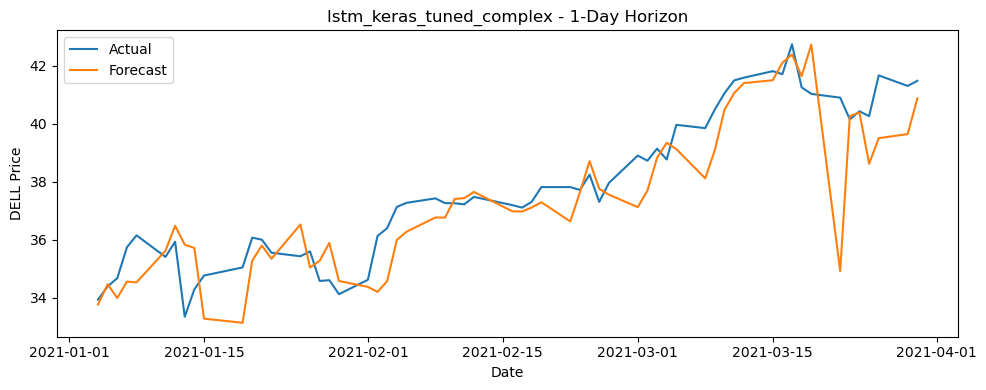

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━

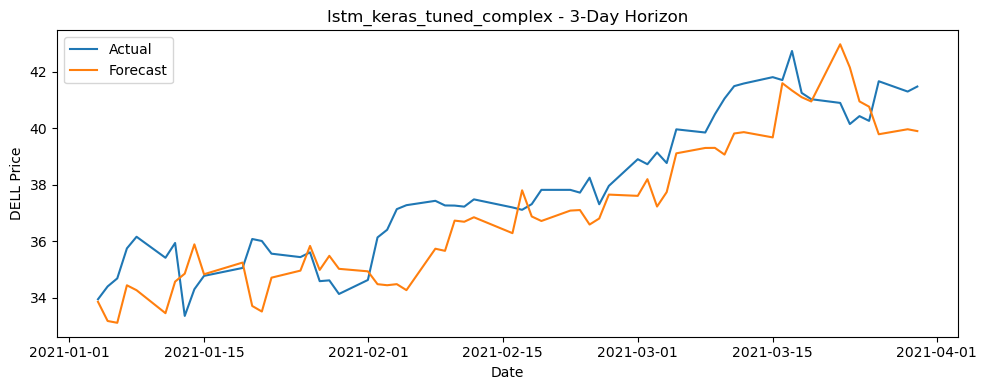

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━

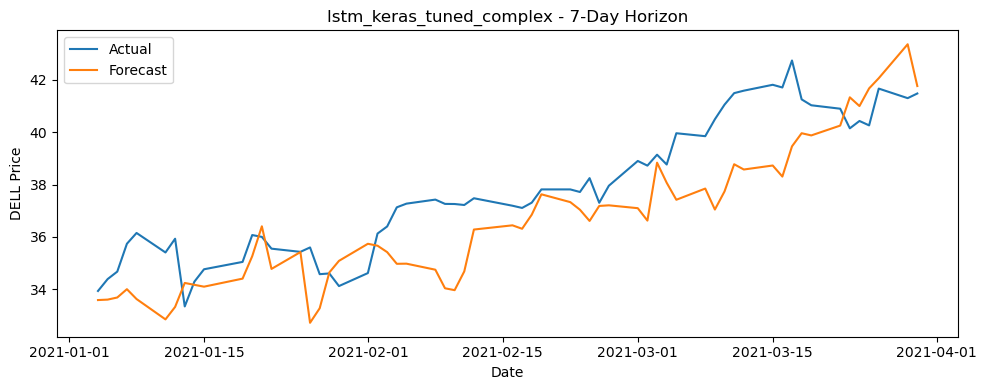


 Saved metrics to lstm_keras_tuned_metrics_dell.csv


,model,horizon,rmse,mae,mape
0,lstm_keras_tuned_complex,1,1.267615,0.878900,2.325782
1,lstm_keras_tuned_complex,3,1.369450,1.157464,3.062220
2,lstm_keras_tuned_complex,7,1.796157,1.457771,3.806022


In [20]:
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    mask = y_true != 0
    return np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100
#wrapper
def lstm_keras_tuned_complex(input_shape):
    return best_model_complex
#evaluate
evaluate_lstm_model(
    df=df,
    model_fn=lstm_keras_tuned_complex,
    forecast_horizons=[1, 3, 7],
    output_csv_path="lstm_keras_tuned_metrics_dell.csv",
    callbacks=[early_stop]
)

In [21]:
#saving best model for use with exo variables later
best_hp = tuner.get_best_hyperparameters(1)[0]

def best_model_fn(input_shape):
    model = LSTMHyperModel(input_shape).build(best_hp)
    return model

In [22]:
def evaluate_lstm_model_with_exo(
    df,
    exo_var=None,
    model_fn=None,
    forecast_horizons=[1, 3, 7],
    train_end="2020-12-31",
    test_start="2021-01-01",
    window_size=30,
    epochs=10,
    output_csv_path="metrics_dell.csv",
    plot=True,  
    callbacks=None
):
    df = df.copy()
    df.index = pd.to_datetime(df.index)
    df = df.asfreq("B")

    features = ["DELL"] + ([exo_var] if isinstance(exo_var, str) else exo_var or [])
    df = df[features].dropna()

    scaler = MinMaxScaler()
    data_scaled = scaler.fit_transform(df)

    split_train = df.index <= train_end
    split_test = df.index >= test_start

    all_metrics = []

    for h in forecast_horizons:
        preds, actuals, dates = [], [], []

        for i in range(window_size, len(data_scaled) - h):
            if not split_test[i + h]:
                continue

            # Build training set once per step
            X_train_full, y_train_full = [], []
            for j in range(window_size, i):
                X_train_full.append(data_scaled[j - window_size:j])
                y_train_full.append(data_scaled[j][0])

            X_train_full = np.array(X_train_full, dtype=np.float32)
            y_train_full = np.array(y_train_full, dtype=np.float32)

            X = data_scaled[i - window_size:i].reshape(1, window_size, len(features))

            # Create, fit, and predict
            model = model_fn((window_size, len(features)))
            model.fit(X_train_full, y_train_full, epochs=epochs, verbose=0, callbacks=callbacks)

            pred_scaled = model.predict(X)[0][0]
            pred = scaler.inverse_transform([[pred_scaled] + [0] * (len(features) - 1)])[0][0]
            actual = df.iloc[i + h]["DELL"]

            preds.append(pred)
            actuals.append(actual)
            dates.append(df.index[i + h])

            # CLEANUP
            del model, X_train_full, y_train_full, X
            K.clear_session()
            gc.collect()

        # Compute metrics
        if preds:
            rmse = np.sqrt(mean_squared_error(actuals, preds))
            mae = mean_absolute_error(actuals, preds)
            mape = mean_absolute_percentage_error(actuals, preds)
            print(f"Exo: {exo_var or 'None'} - Horizon {h} -> RMSE={rmse:.2f}, MAE={mae:.2f}, MAPE={mape:.2f}")

            all_metrics.append({
                "model": model_fn.__name__,
                "exo_var": exo_var or "None",
                "horizon": h,
                "rmse": rmse,
                "mae": mae,
                "mape": mape
            })

            if plot:
                plt.figure(figsize=(10, 4))
                plt.plot(dates, actuals, label="Actual")
                plt.plot(dates, preds, label="Forecast")
                plt.title(f"{exo_var or 'No Exo'} - {h}-Day Horizon")
                plt.xlabel("Date")
                plt.ylabel("DELL Price")
                plt.legend()
                plt.tight_layout()
                plt.show()

    # Save results
    df_metrics = pd.DataFrame(all_metrics)

    if os.path.exists(output_csv_path):
        existing = pd.read_csv(output_csv_path)
        df_metrics = pd.concat([existing, df_metrics], ignore_index=True)

    df_metrics.to_csv(output_csv_path, index=False)
    print(f"\nSaved metrics to {output_csv_path}")
    return df_metrics

## Best of run

In [24]:
# best from each category identified - defining list to use in model
best_exo_by_horizon = {
    1: ["SMH", "HG=F", "XLI"],
    3: ["SMH", "HG=F", "^VIX"],
    7: ["SMH", "HG=F", "DX-Y.NYB"]
}

In [27]:
grouped_exo_vars = {
    "sectoral": ["SMH", "^IXIC", "XLK"],
    "macroeconomic": ["DX-Y.NYB", "^TNX", "^VIX", "XLY", "XLI"],
    "supply_chain_and_commodities": ["HG=F", "CL=F", "IYT"]
}

In [31]:
df.head()

,DELL,SMH,^IXIC,XLK,HG=F,CL=F,DX-Y.NYB,^TNX,^VIX,XLY,XLI,IYT
Ticker,,,,,,,,,,,,
2020-01-02,24.481901,69.920441,9092.190430,88.947220,2.8330,61.180000,96.849998,1.882,12.47,121.004021,75.932228,46.198429
2020-01-03,23.676603,68.775078,9020.769531,87.947159,2.7985,63.049999,96.839996,1.788,14.02,119.974274,75.785889,45.879711
2020-01-06,23.915379,68.040489,9071.469727,88.156693,2.8005,63.270000,96.669998,1.811,13.85,120.307991,75.813316,45.605534
2020-01-07,23.316090,69.176201,9068.580078,88.118584,2.8040,62.700001,96.980003,1.827,13.79,120.117302,75.657822,45.764900
2020-01-08,23.409731,69.292183,9129.240234,89.061523,2.8190,59.610001,97.300003,1.874,13.45,120.479614,75.913940,46.142181



 Evaluating best exogenous variables for horizon 1 with variables: SMH, HG=F, XLI
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━

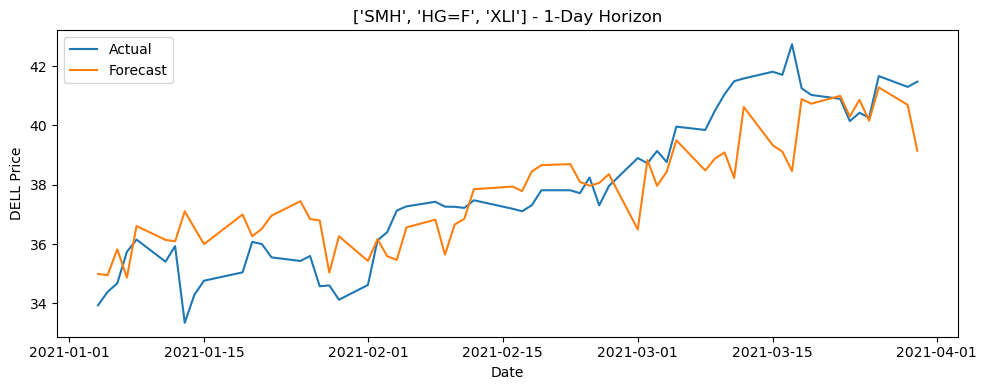


Saved metrics to metrics_lstm_bestof_horizon_1_dell.csv

 Evaluating best exogenous variables for horizon 1 with variables: SMH, HG=F, XLI
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/

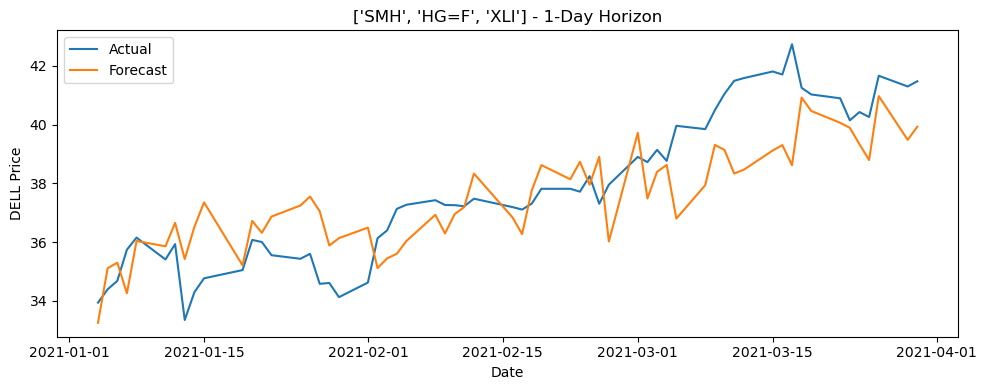


Saved metrics to metrics_lstm_bestof_horizon_1_dell.csv

 Evaluating best exogenous variables for horizon 1 with variables: SMH, HG=F, XLI
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step
1/

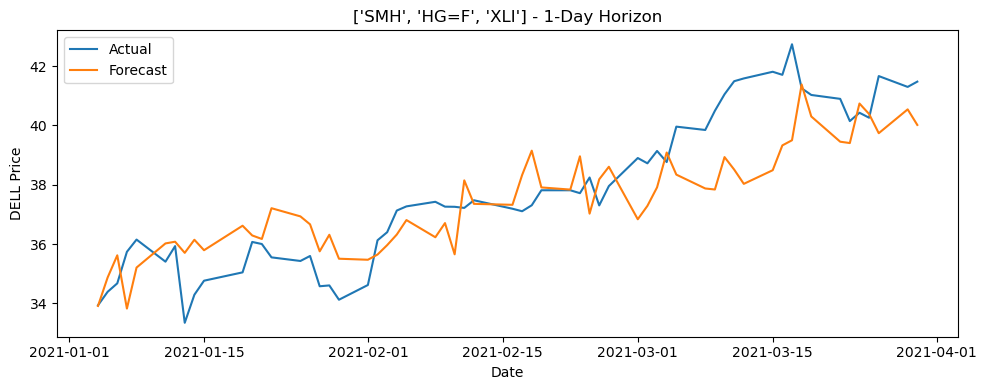


Saved metrics to metrics_lstm_bestof_horizon_1_dell.csv


In [33]:
#loop for evauating best of each categories variables combined
for group_name, var_list in grouped_exo_vars.items():
    print(f"\n Evaluating best exogenous variables for horizon 1 with variables: SMH, HG=F, XLI")
    
    evaluate_lstm_model_with_exo(
        df=df.copy(),
        exo_var=["SMH", "HG=F", "XLI"],  # List of multiple variables
        model_fn=best_model_fn,
        forecast_horizons=[1], #trying one horizon at a time to deal with memory error
        output_csv_path=f"metrics_lstm_bestof_horizon_1_dell.csv",
        callbacks=[early_stop]
    )


 Evaluating best exogenous variables for horizon 3 with variables: SMH, HG=F, ^VIX
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━

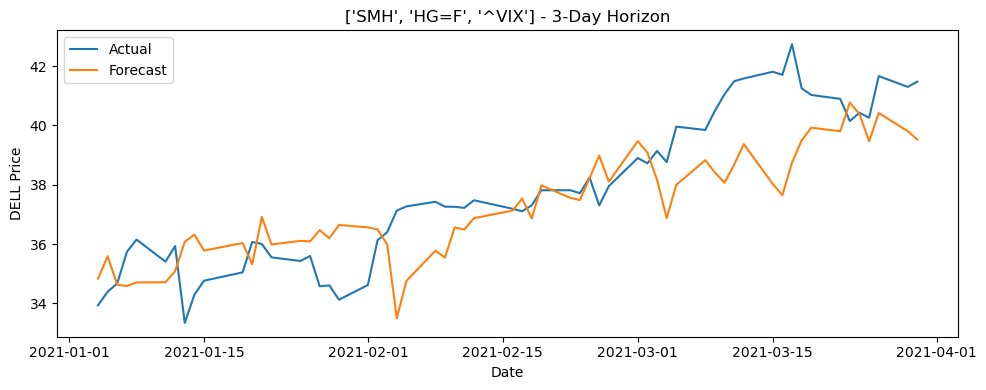


Saved metrics to metrics_lstm_bestof_horizon_3_dell.csv

 Evaluating best exogenous variables for horizon 3 with variables: SMH, HG=F, ^VIX
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1

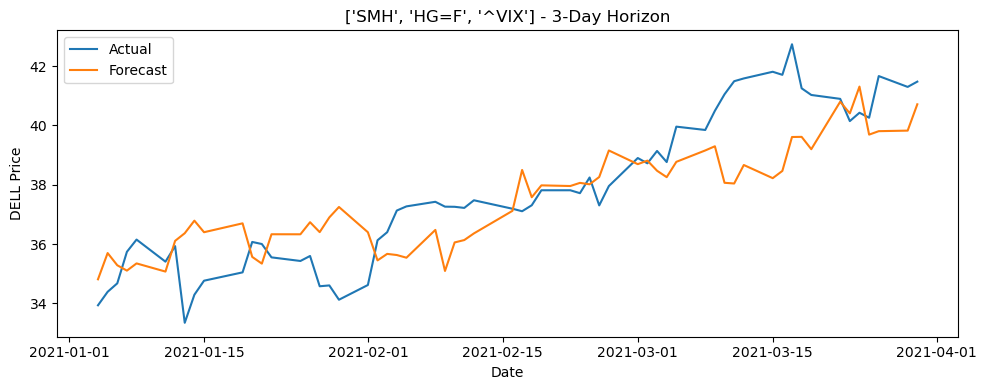


Saved metrics to metrics_lstm_bestof_horizon_3_dell.csv

 Evaluating best exogenous variables for horizon 3 with variables: SMH, HG=F, ^VIX
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1

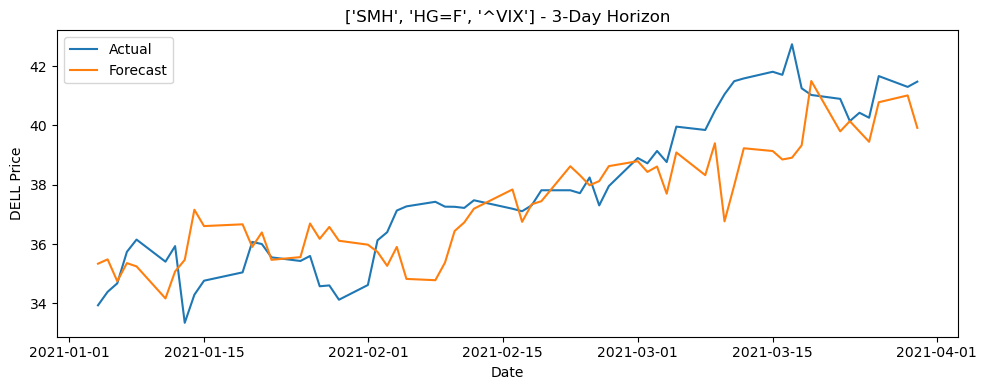


Saved metrics to metrics_lstm_bestof_horizon_3_dell.csv


In [34]:
#horizon 3
for group_name, var_list in grouped_exo_vars.items():
    print(f"\n Evaluating best exogenous variables for horizon 3 with variables: SMH, HG=F, ^VIX")
    
    evaluate_lstm_model_with_exo(
        df=df.copy(),
        exo_var=["SMH", "HG=F", "^VIX"],  # List of multiple variables
        model_fn=best_model_fn,
        forecast_horizons=[3], #trying one horizon at a time to deal with memory error
        output_csv_path=f"metrics_lstm_bestof_horizon_3_dell.csv",
        callbacks=[early_stop]
    )


 Evaluating best exogenous variables for horizon 7 with variables: SMH, HG=F, DX-Y.NYB
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━

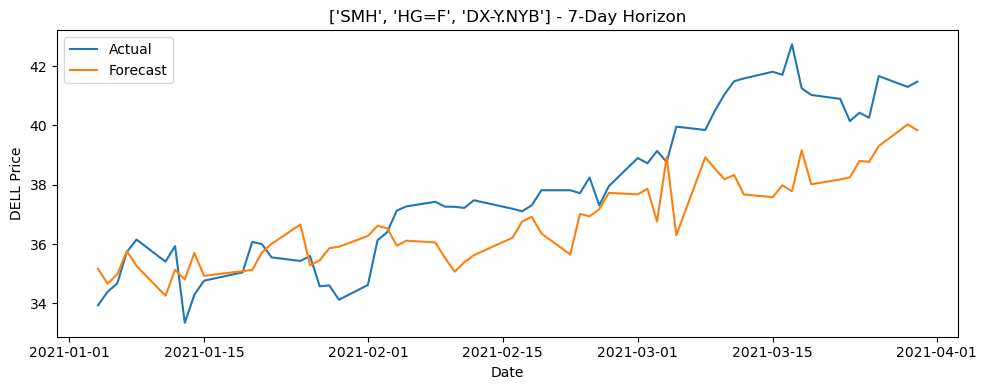


Saved metrics to metrics_lstm_bestof_horizon_7_dell.csv

 Evaluating best exogenous variables for horizon 7 with variables: SMH, HG=F, DX-Y.NYB
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/st

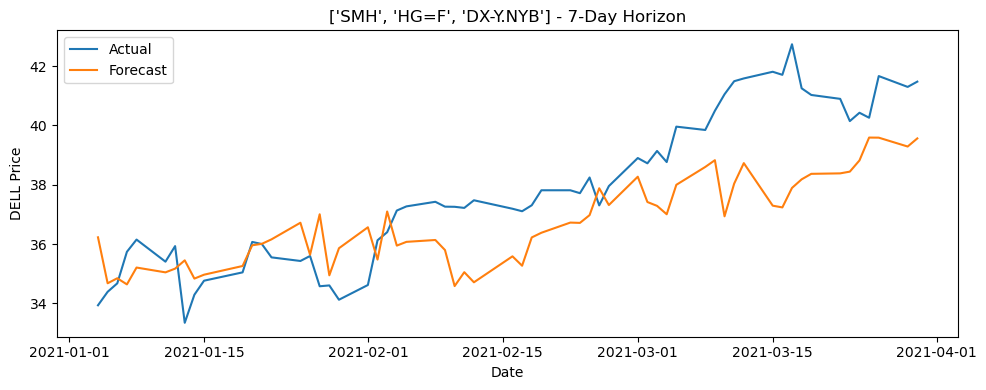


Saved metrics to metrics_lstm_bestof_horizon_7_dell.csv

 Evaluating best exogenous variables for horizon 7 with variables: SMH, HG=F, DX-Y.NYB
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/st

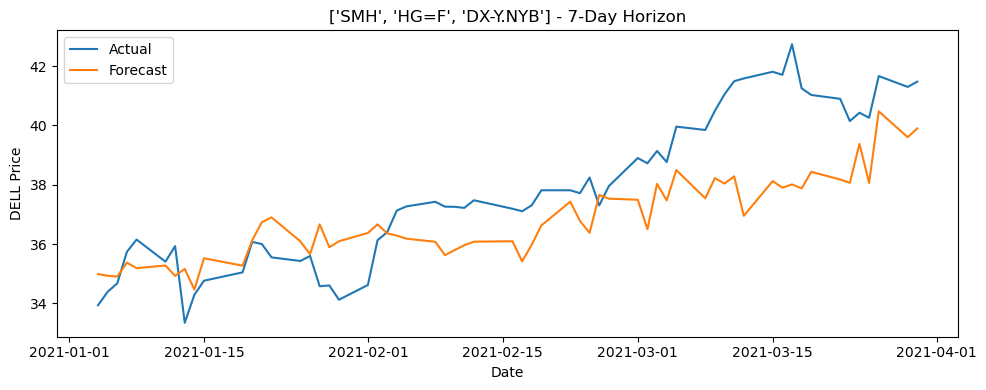


Saved metrics to metrics_lstm_bestof_horizon_7_dell.csv


In [35]:
for group_name, var_list in grouped_exo_vars.items():
    print(f"\n Evaluating best exogenous variables for horizon 7 with variables: SMH, HG=F, DX-Y.NYB")
    
    evaluate_lstm_model_with_exo(
        df=df.copy(),
        exo_var=["SMH", "HG=F", "DX-Y.NYB"],  # List of multiple variables
        model_fn=best_model_fn,
        forecast_horizons=[7], #trying one horizon at a time to deal with memory error
        output_csv_path=f"metrics_lstm_bestof_horizon_7_dell.csv",
        callbacks=[early_stop]
    )